In [1]:
# this cell download the data
import xarray as xr
import numpy as np

import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
import cartopy.crs as ccrs

data=pd.read_csv('~/Documents/post_doc/UV5_dataset/Ecopart_data_2008_to_2010.tsv',sep='\t')
column_names = data.columns.tolist()
ds1 = xr.Dataset.from_dataframe(data)
ds1 = ds1.to_dataframe().reset_index().set_index('Date_Time')

data=pd.read_csv('~/Documents/post_doc/UV5_dataset/Ecopart_data_2011_to_2013.tsv',sep='\t')
column_names = data.columns.tolist()
ds2 = xr.Dataset.from_dataframe(data)
ds2 = ds2.to_dataframe().reset_index().set_index('Date_Time')

data=pd.read_csv('~/Documents/post_doc/UV5_dataset/Ecopart_data_2014_to_2016.tsv',sep='\t')
column_names = data.columns.tolist()

ds3 = xr.Dataset.from_dataframe(data)
ds3 = ds3.to_dataframe().reset_index().set_index('Date_Time')

data=pd.read_csv('~/Documents/post_doc/UV5_dataset/Ecopart_data_2017_to_2019.tsv',sep='\t')
column_names = data.columns.tolist()
ds4 = xr.Dataset.from_dataframe(data)
ds4 = ds4.to_dataframe().reset_index().set_index('Date_Time')

data=pd.read_csv('~/Documents/post_doc/UV5_dataset/Ecopart_data_2020_to_2022.tsv',sep='\t')
column_names = data.columns.tolist()
ds5 = xr.Dataset.from_dataframe(data)
ds5 = ds5.to_dataframe().reset_index().set_index('Date_Time')

/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/1907709786.py:25: DtypeWarning: Columns (2,4) have mixed types. Specify dtype option on import or set low_memory=False.
  data=pd.read_csv('~/Documents/post_doc/UV5_dataset/Ecopart_data_2014_to_2016.tsv',sep='\t')
/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/1907709786.py:31: DtypeWarning: Columns (2,4) have mixed types. Specify dtype option on import or set low_memory=False.
  data=pd.read_csv('~/Documents/post_doc/UV5_dataset/Ecopart_data_2017_to_2019.tsv',sep='\t')


Depth 22.5 dbar: 8419 stations
Depth 27.5 dbar: 8408 stations
Depth 32.5 dbar: 8372 stations
Depth 37.5 dbar: 8360 stations
Depth 42.5 dbar: 8324 stations
Depth 47.5 dbar: 8226 stations
Depth 52.5 dbar: 8123 stations
Depth 57.5 dbar: 8048 stations
Depth 62.5 dbar: 8044 stations
Depth 67.5 dbar: 8028 stations
Depth 72.5 dbar: 8001 stations
Depth 77.5 dbar: 7968 stations
Depth 82.5 dbar: 7936 stations
Depth 87.5 dbar: 7893 stations
Depth 92.5 dbar: 7860 stations
Depth 97.5 dbar: 7817 stations
Depth 102.5 dbar: 7774 stations
Depth 107.5 dbar: 7661 stations
Depth 112.5 dbar: 7621 stations
Depth 117.5 dbar: 7586 stations
Depth 122.5 dbar: 7566 stations
Depth 127.5 dbar: 7534 stations
Depth 132.5 dbar: 7503 stations
Depth 137.5 dbar: 7479 stations
Depth 142.5 dbar: 7457 stations
Depth 147.5 dbar: 7425 stations
Depth 152.5 dbar: 7414 stations
Depth 157.5 dbar: 7394 stations
Depth 162.5 dbar: 7373 stations
Depth 167.5 dbar: 7334 stations
Depth 172.5 dbar: 7311 stations
Depth 177.5 dbar: 7270 s

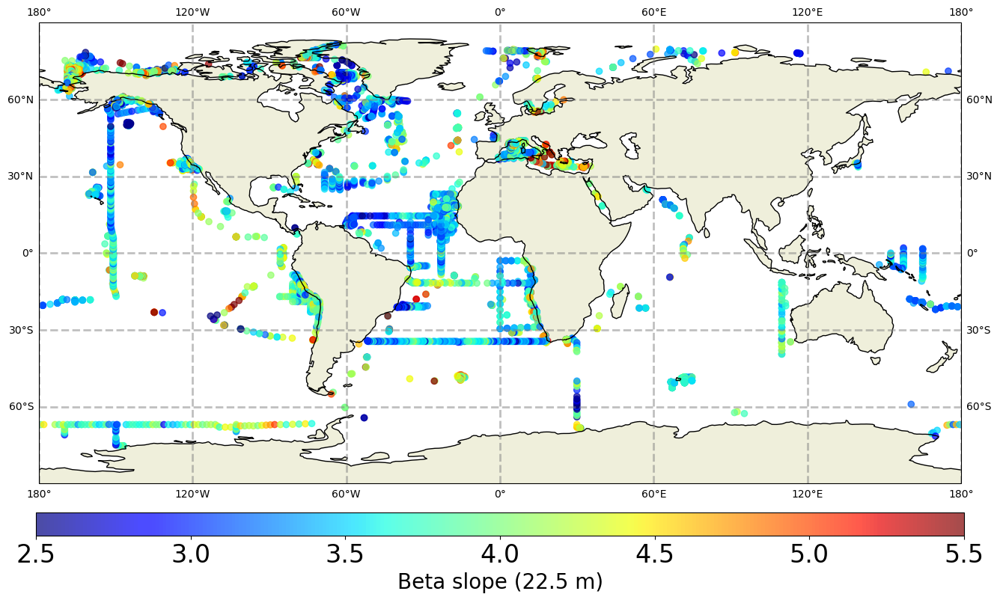

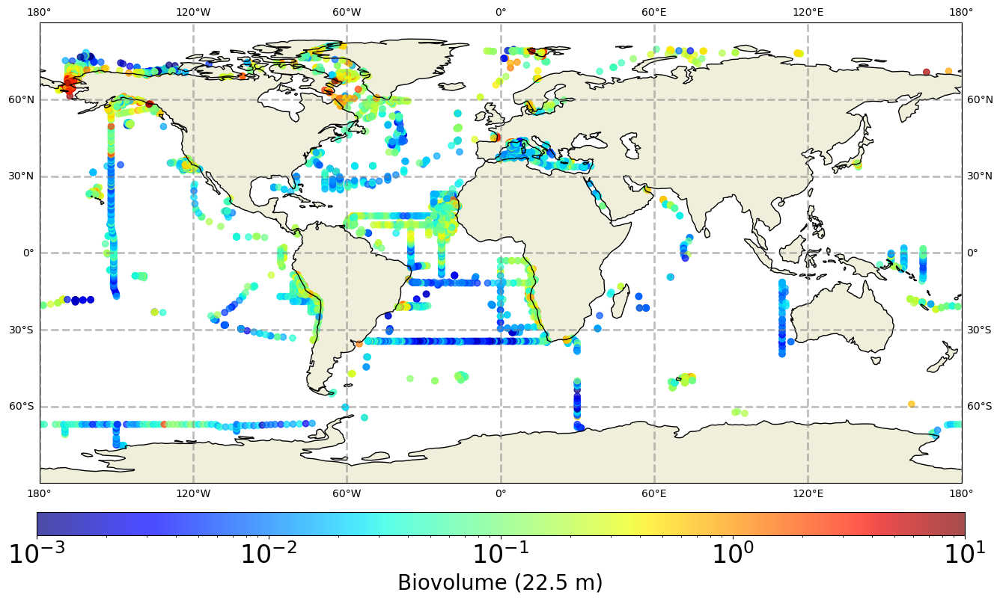

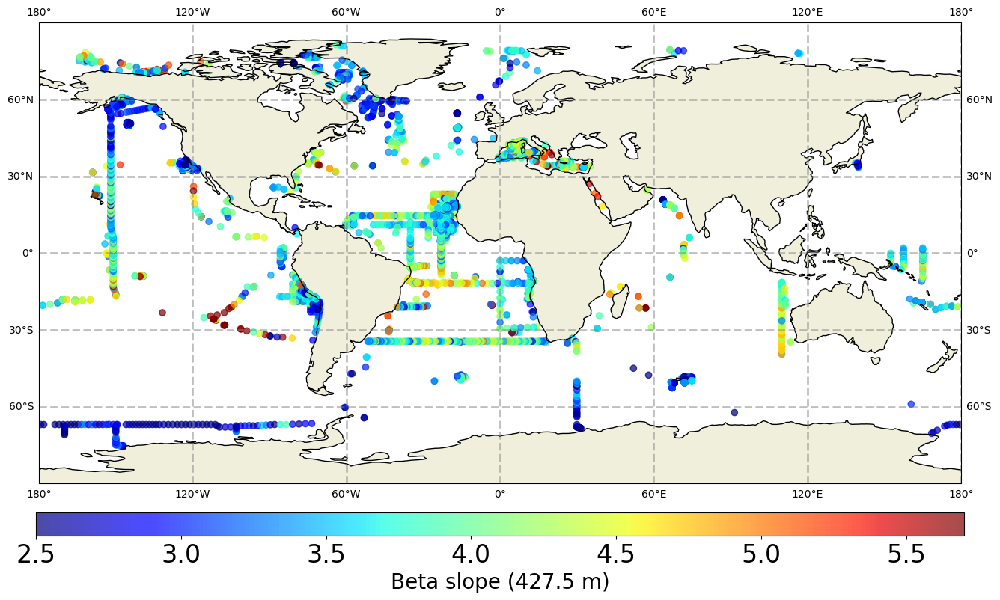

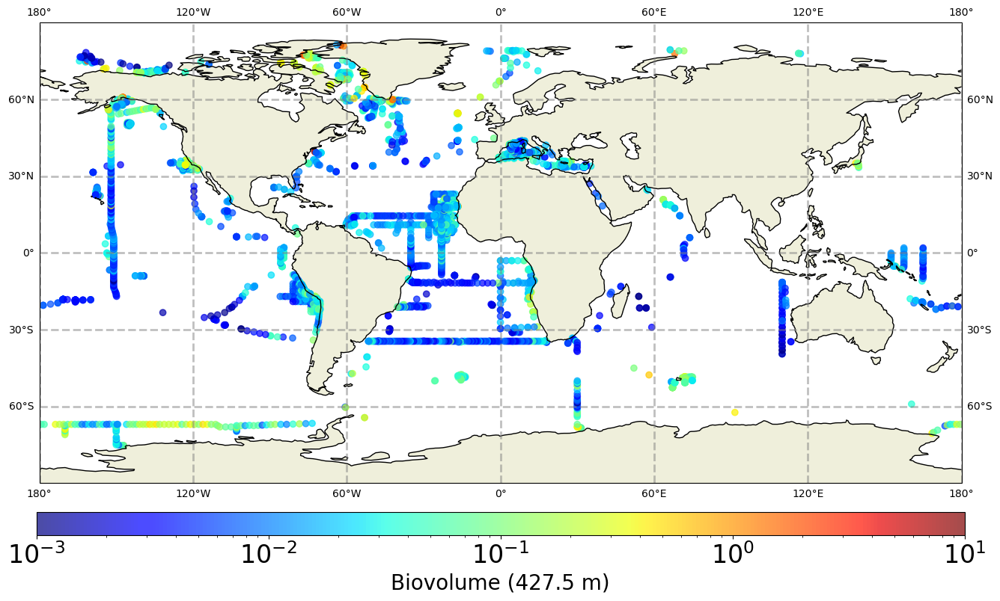

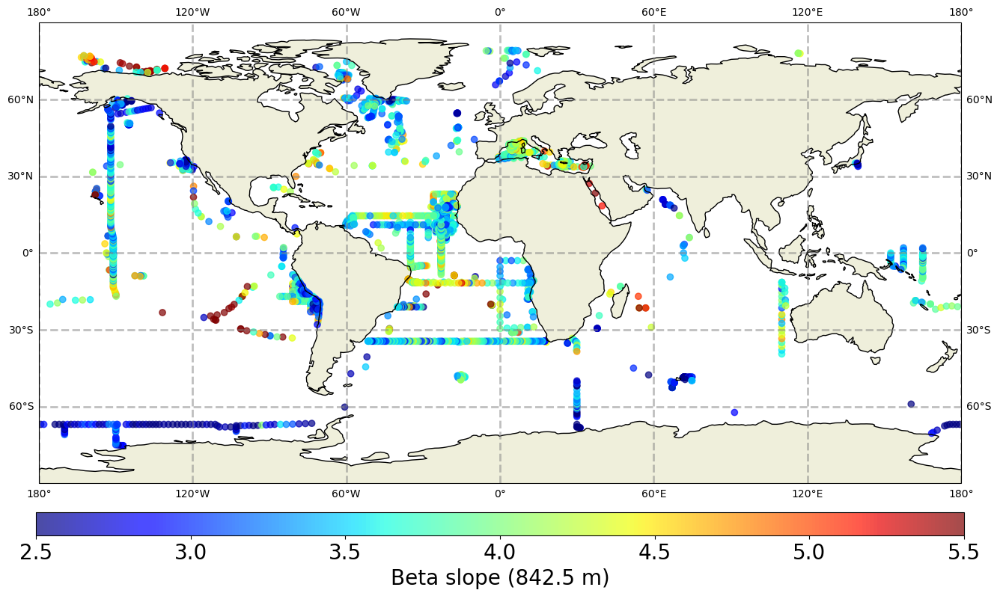

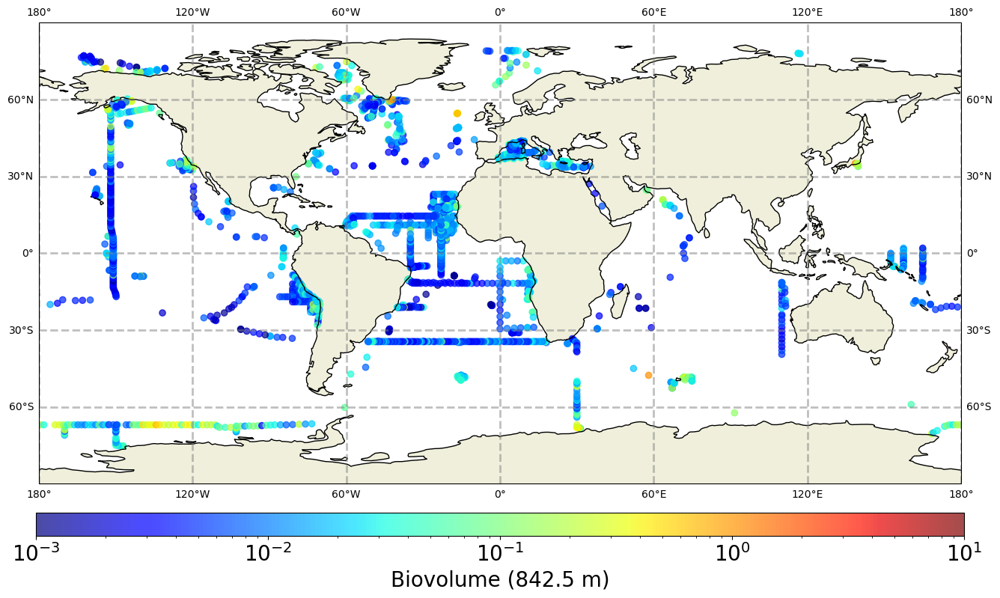

In [2]:
import numpy as np
import pandas as pd
from scipy.stats import linregress
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LogNorm

# Define pressure levels
pressure_levels = [22.5, 27.5, 32.5, 37.5, 42.5, 47.5,
                   52.5, 57.5, 62.5, 67.5, 72.5, 77.5, 82.5, 87.5, 92.5, 97.5,102.5,107.5,112.5,
                   117.5,122.5,127.5,132.5,137.5,142.5,147.5,152.5,157.5,162.5,167.5,172.5,177.5,
                   182.5,187.5,192.5,197.5,202.5,207.5,212.5,217.5,222.5,227.5,232.5,237.5,242.5,
                   247.5,252.5,257.5,262.5,267.5,272.5,277.5,282.5,287.5,292.5,297.5,302.5,307.5,
                   312.5,317.5,322.5,327.5,332.5,337.5,342.5,347.5,352.5,357.5,362.5,367.5,372.5,
                   377.5,382.5,387.5,392.5,397.5,402.5,407.5,412.5,417.5,422.5,427.5,432.5,437.5,
                   442.5,447.5,452.5,457.5,462.5,467.5,472.5,477.5,482.5,487.5,492.5,497.5,502.5,
                   507.5,512.5,517.5,522.5,527.5,532.5,537.5,542.5,547.5,552.5,557.5,562.5,567.5,
                   572.5,577.5,582.5,587.5,592.5,597.5,602.5,607.5,612.5,617.5,622.5,627.5,632.5,
                   637.5,642.5,647.5,652.5,657.5,662.5,667.5,672.5,677.5,682.5,687.5,692.5,697.5,
                   702.5,707.5,712.5,717.5,722.5,727.5,732.5,737.5,742.5,747.5,752.5,757.5,762.5,
                   767.5,772.5,777.5,782.5,787.5,792.5,797.5,802.5,807.5,812.5,817.5,822.5,827.5,
                   832.5,837.5,842.5,847.5,852.5,857.5]

# Particle radius (mm)
radius = [0.102, 0.128, 0.161, 0.203, 0.256, 0.323, 0.406, 0.512, 0.645, 0.813,
          1.02, 1.29, 1.63, 2.05, 2.58, 3.25, 4.1, 5.16]

# Particle concentration column names
A = [
   'Part conc frac [#/l] (ESD: 0.102-0.128 mm)', 'Part conc frac [#/l] (ESD: 0.128-0.161 mm)',
   'Part conc frac [#/l] (ESD: 0.161-0.203 mm)', 'Part conc frac [#/l] (ESD: 0.203-0.256 mm)',
   'Part conc frac [#/l] (ESD: 0.256-0.323 mm)', 'Part conc frac [#/l] (ESD: 0.323-0.406 mm)',
   'Part conc frac [#/l] (ESD: 0.406-0.512 mm)', 'Part conc frac [#/l] (ESD: 0.512-0.645 mm)',
   'Part conc frac [#/l] (ESD: 0.645-0.813 mm)', 'Part conc frac [#/l] (ESD: 0.813-1.02 mm)',
   'Part conc frac [#/l] (ESD: 1.02-1.29 mm)', 'Part conc frac [#/l] (ESD: 1.29-1.63 mm)',
   'Part conc frac [#/l] (ESD: 1.63-2.05 mm)', 'Part conc frac [#/l] (ESD: 2.05-2.58 mm)',
   'Part conc frac [#/l] (ESD: 2.58-3.25 mm)', 'Part conc frac [#/l] (ESD: 3.25-4.1 mm)',
   'Part conc frac [#/l] (ESD: 4.1-5.16 mm)', 'Part conc frac [#/l] (ESD: 5.16-6.5 mm)'
]

# Biovolume column names
B = [
   'Biovolume [mm3 l-1] (ESD: 0.102-0.128 mm)', 'Biovolume [mm3 l-1] (ESD: 0.128-0.161 mm)',
   'Biovolume [mm3 l-1] (ESD: 0.161-0.203 mm)', 'Biovolume [mm3 l-1] (ESD: 0.203-0.256 mm)',
   'Biovolume [mm3 l-1] (ESD: 0.256-0.323 mm)', 'Biovolume [mm3 l-1] (ESD: 0.323-0.406 mm)',
   'Biovolume [mm3 l-1] (ESD: 0.406-0.512 mm)', 'Biovolume [mm3 l-1] (ESD: 0.512-0.645 mm)',
   'Biovolume [mm3 l-1] (ESD: 0.645-0.813 mm)', 'Biovolume [mm3 l-1] (ESD: 0.813-1.02 mm)',
   'Biovolume [mm3 l-1] (ESD: 1.02-1.29 mm)', 'Biovolume [mm3 l-1] (ESD: 1.29-1.63 mm)',
   'Biovolume [mm3 l-1] (ESD: 1.63-2.05 mm)', 'Biovolume [mm3 l-1] (ESD: 2.05-2.58 mm)',
   'Biovolume [mm3 l-1] (ESD: 2.58-3.25 mm)', 'Biovolume [mm3 l-1] (ESD: 3.25-4.1 mm)',
   'Biovolume [mm3 l-1] (ESD: 4.1-5.16 mm)', 'Biovolume [mm3 l-1] (ESD: 5.16-6.5 mm)'
]

epsilon = 1e-5  # To avoid log(0)

# Dictionaries to store results per depth
beta_by_depth = {}
biovol_by_depth = {}
lat_by_depth = {}
lon_by_depth = {}

for q, p in enumerate(pressure_levels):

    # Combine all datasets for this depth
    dfs = [
        ds1[ds1['Pressure [dbar]'] == p],
        ds2[ds2['Pressure [dbar]'] == p],
        ds3[ds3['Pressure [dbar]'] == p],
        ds4[ds4['Pressure [dbar]'] == p],
        ds5[ds5['Pressure [dbar]'] == p],
    ]
    result_ab = pd.concat(dfs, ignore_index=True)
    M = len(result_ab)  # Dynamically determine number of stations
    if M == 0:
        continue

    print(f"Depth {p} dbar: {M} stations")

    # Initialize per-level arrays
    A1 = np.zeros((M, len(radius)))
    r = np.zeros((M, len(radius)))

    for k in range(len(radius)):
        A1[:, k] = result_ab[A[k]].values
        r[:, k] = radius[k]

    # Compute beta slope per station
    Z1_beta = np.full(M, np.nan)
    for k in range(M):
        Q = A1[k, :]
        y = r[k, :]
        mask = (Q > 0) & (y > 0)
        if np.sum(mask) > 2:
            slope, intercept, r_value, p_value, std_err = linregress(
                -np.log10(y[mask]),
                np.log10(Q[mask] / (y[mask] * 0.1))
            )
            Z1_beta[k] = slope
    beta_by_depth[p] = Z1_beta
    lat_by_depth[p] = result_ab['Latitude'].values
    lon_by_depth[p] = result_ab['Longitude'].values

    # ---- Compute Biovolume mean per station ----
    Bio1 = np.zeros((M, len(radius)))
    for k in range(len(radius)):
        Bio1[:, k] = result_ab[B[k]].values
    biovol_by_depth[p] = np.nanmean(Bio1, axis=1)

# ---- Example: plot one level ----
level_plot = 22.5  # choose a depth level that exists in your data
lat = lat_by_depth[level_plot]
lon = lon_by_depth[level_plot]
Z1_beta_mean = beta_by_depth[level_plot]
Bio1_mean = biovol_by_depth[level_plot]

# ---- Plot Beta ----
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(lon, lat, c=Z1_beta_mean, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=2.5, vmax=5.5)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND)
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
cbar.set_label(f'Beta slope ({level_plot} m)', fontsize=20)
cbar.ax.tick_params(labelsize=24)
plt.show()

# ---- Plot Biovolume ----
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(lon, lat, c=Bio1_mean, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), norm=LogNorm(vmin=1e-3, vmax=10))
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND)
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
cbar.set_label(f'Biovolume ({level_plot} m)', fontsize=20)
cbar.ax.tick_params(labelsize=24)
plt.show()


level_plot = 427.5  # choose a depth level that exists in your data
lat = lat_by_depth[level_plot]
lon = lon_by_depth[level_plot]
Z1_beta_mean = beta_by_depth[level_plot]
Bio1_mean = biovol_by_depth[level_plot]

# ---- Plot Beta ----
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(lon, lat, c=Z1_beta_mean, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=2.5, vmax=5.7)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND)
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
cbar.set_label(f'Beta slope ({level_plot} m)', fontsize=20)
cbar.ax.tick_params(labelsize=24)
plt.show()

# ---- Plot Biovolume ----
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(lon, lat, c=Bio1_mean, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), norm=LogNorm(vmin=1e-3, vmax=10))
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND)
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
cbar.set_label(f'Biovolume ({level_plot} m)', fontsize=20)
cbar.ax.tick_params(labelsize=24)
plt.show()

level_plot = 842.5  # choose a depth level that exists in your data
lat = lat_by_depth[level_plot]
lon = lon_by_depth[level_plot]
Z1_beta_mean = beta_by_depth[level_plot]
Bio1_mean = biovol_by_depth[level_plot]

# ---- Plot Beta ----
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(lon, lat, c=Z1_beta_mean, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=2.5, vmax=5.5)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND)
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
cbar.set_label(f'Beta slope ({level_plot} m)', fontsize=20)
cbar.ax.tick_params(labelsize=20)
plt.show()

# ---- Plot Biovolume ----
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(lon, lat, c=Bio1_mean, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), norm=LogNorm(vmin=1e-3, vmax=10))
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND)
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
cbar.set_label(f'Biovolume ({level_plot} m)', fontsize=20)
cbar.ax.tick_params(labelsize=20)
plt.show()





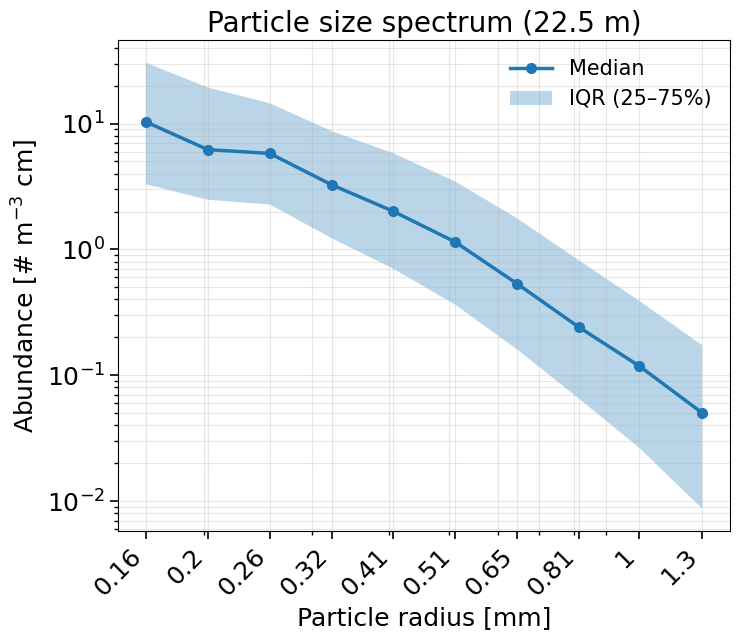

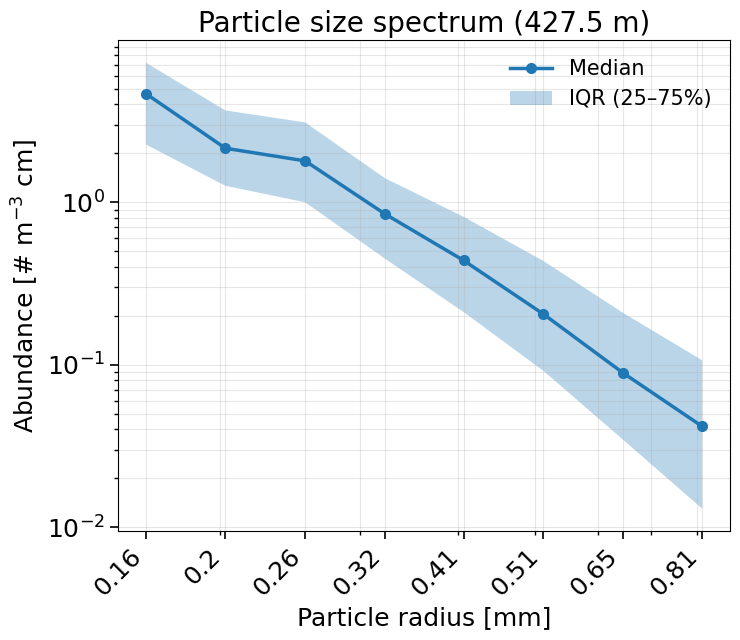

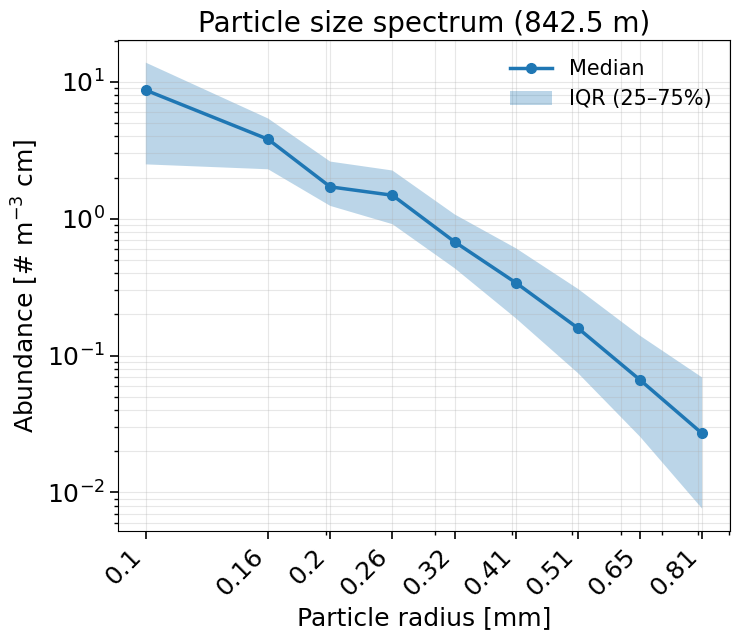

In [3]:
abundance_stats = {}

for p in pressure_levels:

    dfs = [
        ds1[ds1["Pressure [dbar]"] == p],
        ds2[ds2["Pressure [dbar]"] == p],
        ds3[ds3["Pressure [dbar]"] == p],
        ds4[ds4["Pressure [dbar]"] == p],
        ds5[ds5["Pressure [dbar]"] == p],
    ]

    result_ab = pd.concat(dfs, ignore_index=True)
    if len(result_ab) == 0:
        continue

    # Build abundance matrix: (stations, radius bins)
    A_mat = np.vstack([result_ab[col].values for col in A]).T

    median = np.nanmedian(A_mat, axis=0)
    p25    = np.nanpercentile(A_mat, 25, axis=0)
    p75    = np.nanpercentile(A_mat, 75, axis=0)

    abundance_stats[p] = {
        "median": median,
        "p25": p25,
        "p75": p75
    }

def plot_psd_depth(p, radius, stats):
    radius = np.asarray(radius)

    med = stats["median"]
    p25 = stats["p25"]
    p75 = stats["p75"]

    # Mask invalid bins for log–log plotting
    mask = (
        (radius > 0) &
        (med > 0) &
        (p25 > 0) &
        (p75 > 0)
    )

    r_plot   = radius[mask]
    med_plot = med[mask]
    p25_plot = p25[mask]
    p75_plot = p75[mask]

    fig, ax = plt.subplots(figsize=(7.5, 6.5))

    ax.plot(
        r_plot, med_plot,
        "-o", lw=2.5, ms=7,
        label="Median"
    )

    ax.fill_between(
        r_plot, p25_plot, p75_plot,
        alpha=0.3, label="IQR (25–75%)"
    )

    # Log scales
    ax.set_xscale("log")
    ax.set_yscale("log")
    # Force x ticks at radius bins
    ax.set_xticks(r_plot)
    ax.set_xticklabels([f"{r:.2g}" for r in r_plot])

    # 🔹 Larger labels
    ax.set_xlabel("Particle radius [mm]", fontsize=18)
    ax.set_ylabel("Abundance [# m$^{-3}$ cm]", fontsize=18)

    # 🔹 Larger tick numbers
    ax.tick_params(
        axis="both",
        which="major",
        labelsize=18,
        length=6,
        width=1.2
    )
    ax.tick_params(
        axis="both",
        which="minor",
        labelsize=18,
        length=3,
        width=1.0
    )

    # Title
    # Grid
    ax.grid(True, which="both", alpha=0.3)
    # Rotate x-axis tick numbers
    # --- Rotate x-axis tick numbers (LOG-SAFE) ---
    ax.tick_params(axis="x", which="minor", labelbottom=False)  # hide minor labels
    ax.figure.canvas.draw()  # force tick creation

    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_ha("right")



    # 🔹 Larger legend
    ax.legend(fontsize=15, frameon=False)
    ax.set_title(f"Particle size spectrum ({p} m)", fontsize=20)

    plt.tight_layout()
    plt.show()



plot_psd_depth(22.5,  radius, abundance_stats[22.5])
plot_psd_depth(427.5, radius, abundance_stats[427.5])
plot_psd_depth(842.5, radius, abundance_stats[842.5])



✅ Combined dataset shape: (940331, 5)
   Pressure_dbar   Latitude  Longitude  Beta_slope  Biovolume
0           22.5 -31.044500   4.662170    3.593144   0.001558
1           22.5  57.117167  17.668667    3.550586   0.149584
2           22.5  58.016833  17.984500    3.522142   0.249840
3           22.5  57.998167  19.878833    3.546030   0.266549
4           22.5  54.971167  14.098833    4.609787   0.050530


/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/3685569593.py:76: RuntimeWarning: Mean of empty slice
  mean_beta = np.nanmean(df_level.loc[mask, "Beta_slope"])


✅ Binned data: (236556, 5)


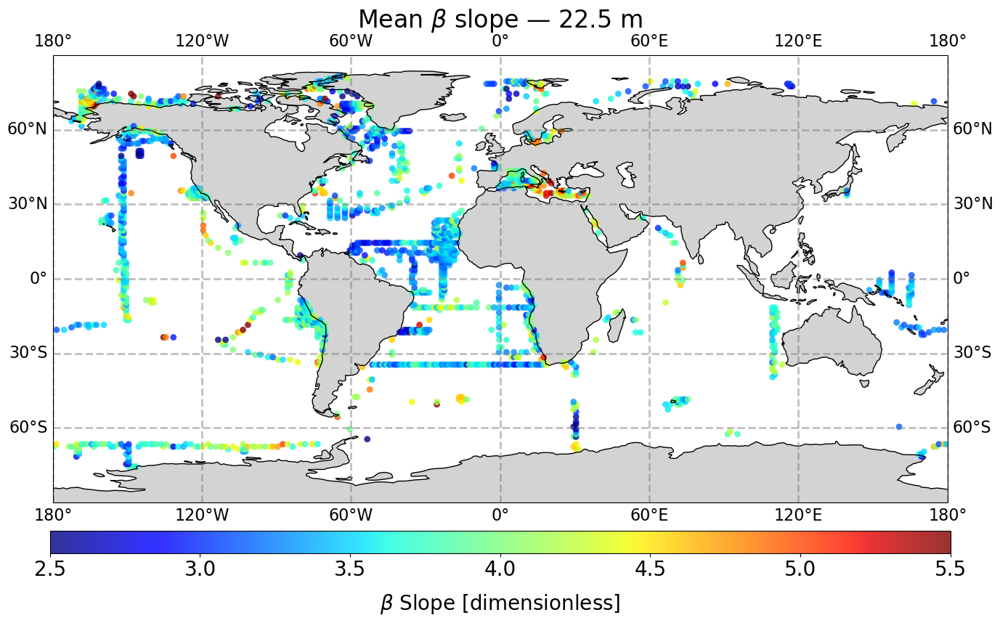

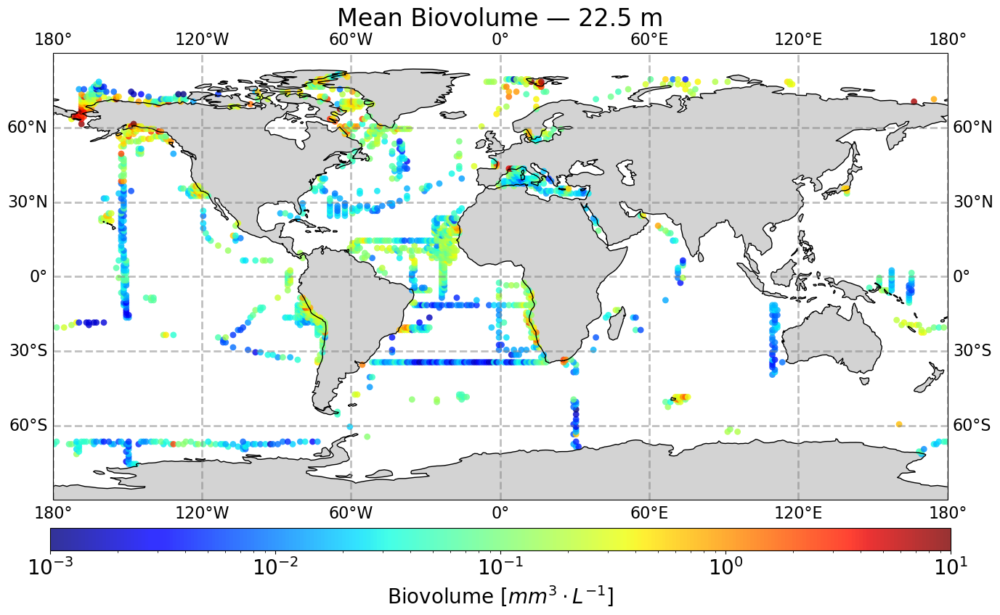

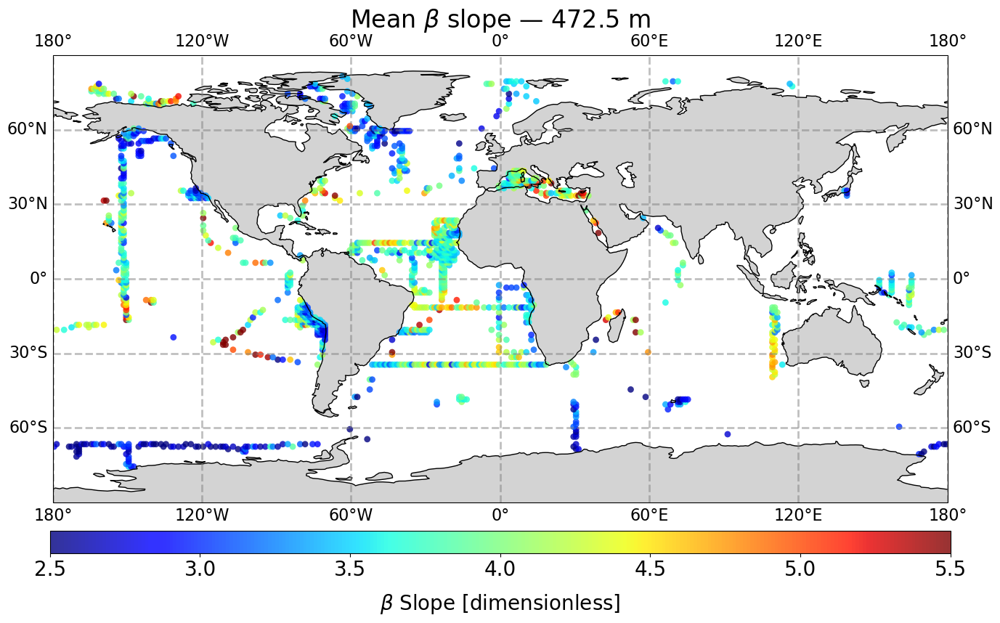

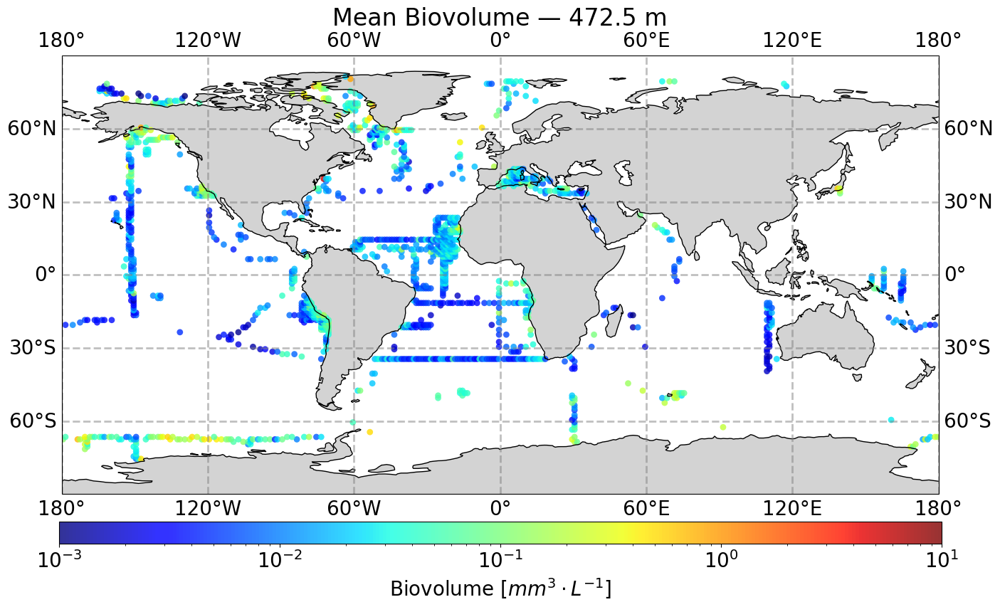

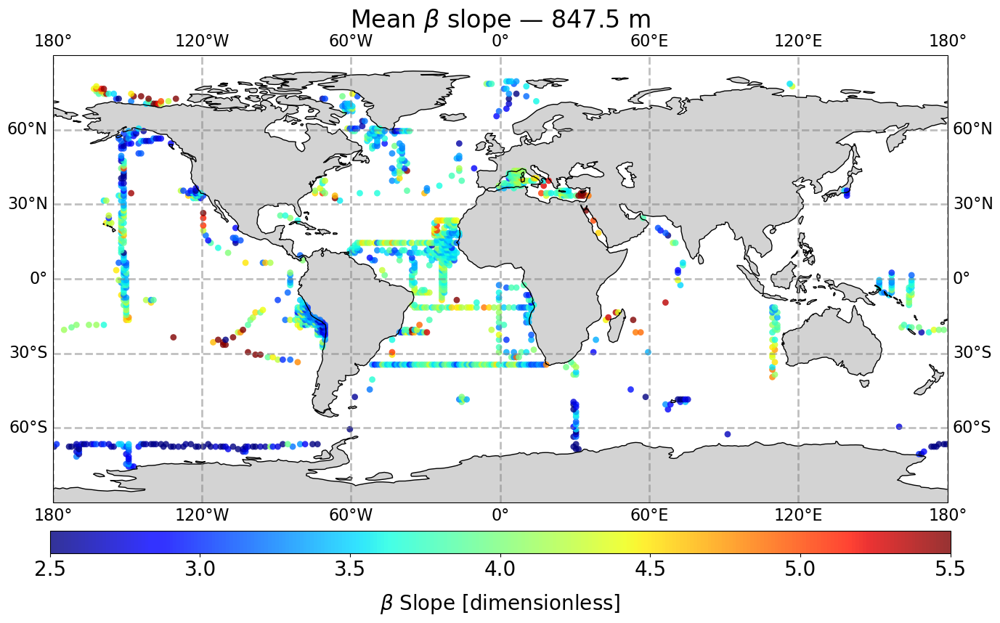

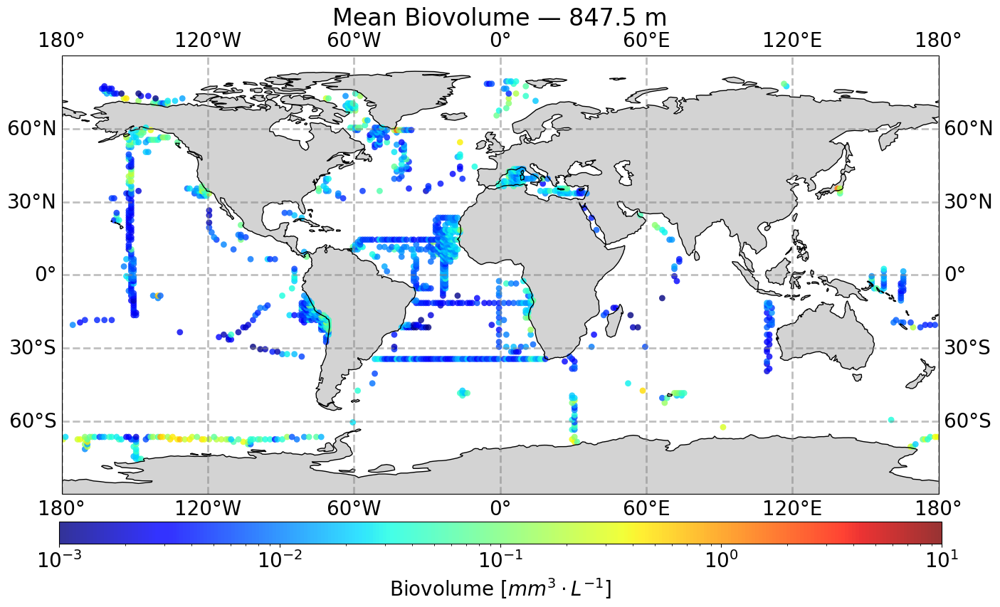

In [4]:
# ---- Concatenate all pressure levels into a single dataframe ----
records = []

for p in pressure_levels:
    if p not in beta_by_depth:
        continue  # skip levels without data

    beta = beta_by_depth[p]
    biovol = biovol_by_depth[p]
    lat = lat_by_depth[p]
    lon = lon_by_depth[p]
    M = len(beta)

    # Build a temporary DataFrame for this depth
    df_level = pd.DataFrame({
        "Pressure_dbar": np.full(M, p),
        "Latitude": lat,
        "Longitude": lon,
        "Beta_slope": beta,
        "Biovolume": biovol
    })

    records.append(df_level)

# Combine all into one DataFrame
df_all = pd.concat(records, ignore_index=True)

# Sort by depth (optional)
df_all = df_all.sort_values(by="Pressure_dbar").reset_index(drop=True)

print("✅ Combined dataset shape:", df_all.shape)
print(df_all.head())


import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LogNorm

# ---------------------------------------------------------------
# Input: df_all with ["Pressure_dbar", "Latitude", "Longitude", "Beta_slope", "Biovolume"]
# ---------------------------------------------------------------

# Define 1° grid
lat_edges = np.arange(-90, 91, 1)
lon_edges = np.arange(-180, 181, 1)
lat_centers = (lat_edges[:-1] + lat_edges[1:]) / 2
lon_centers = (lon_edges[:-1] + lon_edges[1:]) / 2

depths = sorted(df_all["Pressure_dbar"].unique())



records_binned = []  # list of per-bin means

# ---------------------------------------------------------------
# Bin-average each depth level
# ---------------------------------------------------------------
for p in depths:
    df_level = df_all[df_all["Pressure_dbar"] == p]
    if len(df_level) < 5:
        continue

    # Assign bins
    lat_idx = np.digitize(df_level["Latitude"], lat_edges) - 1
    lon_idx = np.digitize(df_level["Longitude"], lon_edges) - 1

    # Compute mean within each occupied bin
    for i in np.unique(lat_idx):
        for j in np.unique(lon_idx):
            mask = (lat_idx == i) & (lon_idx == j)
            if np.any(mask):
                mean_beta = np.nanmean(df_level.loc[mask, "Beta_slope"])
                mean_bio  = np.nanmean(df_level.loc[mask, "Biovolume"])
                records_binned.append({
                    "Pressure_dbar": p,
                    "Latitude": lat_centers[i],
                    "Longitude": lon_centers[j],
                    "Beta_slope": mean_beta,
                    "Biovolume": mean_bio
                })

# Combine into DataFrame
df_binned = pd.DataFrame(records_binned)
print("✅ Binned data:", df_binned.shape)

# ---------------------------------------------------------------
# Plot: choose depth and scatter the binned values
# ---------------------------------------------------------------
level_plot = 22.5
df_plot = df_binned[np.isclose(df_binned["Pressure_dbar"], level_plot)]

# --- Plot Beta slope ---
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(df_plot["Longitude"], df_plot["Latitude"],
                c=df_plot["Beta_slope"], cmap="jet", s=40, vmin=2.5, vmax=5.5,
                transform=ccrs.PlateCarree(), alpha=0.8, edgecolor='none')

ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.LAND, facecolor="lightgray")
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlabel_style = {'size': 16}
gl.ylabel_style = {'size': 16}

cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
# The 'r' before the string is critical to handle the backslash for \beta
cbar.set_label(r'$\beta$ Slope [dimensionless]', fontsize=20, labelpad=12)
cbar.ax.tick_params(labelsize=20)
plt.title(rf"Mean $\beta$ slope — {level_plot:.1f} m", fontsize=24)
plt.show()

# --- Plot Biovolume ---
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(df_plot["Longitude"], df_plot["Latitude"],
                c=df_plot["Biovolume"], cmap="jet", s=40,
                norm=LogNorm(vmin=0.001, vmax=10),
                transform=ccrs.PlateCarree(), alpha=0.8, edgecolor='none')

ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.LAND, facecolor="lightgray")
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlabel_style = {'size': 16}
gl.ylabel_style = {'size': 16}

cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
# Using raw strings (r'') to prevent Python backslash errors
cbar.set_label(r'Biovolume [$mm^3 \cdot L^{-1}$]', fontsize=20)
cbar.ax.tick_params(labelsize=20)
plt.title(f"Mean Biovolume — {level_plot:.1f} m", fontsize=24)
plt.show()



level_plot = 472.5
df_plot = df_binned[np.isclose(df_binned["Pressure_dbar"], level_plot)]

# --- Plot Beta slope ---
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(df_plot["Longitude"], df_plot["Latitude"],
                c=df_plot["Beta_slope"], cmap="jet", s=40, vmin=2.5, vmax=5.5,
                transform=ccrs.PlateCarree(), alpha=0.8, edgecolor='none')

ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.LAND, facecolor="lightgray")
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlabel_style = {'size': 16}
gl.ylabel_style = {'size': 16}

cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
# The 'r' before the string is critical to handle the backslash for \beta
cbar.set_label(r'$\beta$ Slope [dimensionless]', fontsize=20, labelpad=12)
cbar.ax.tick_params(labelsize=20)
plt.title(rf"Mean $\beta$ slope — {level_plot:.1f} m", fontsize=24)
plt.show()

# --- Plot Biovolume ---
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(df_plot["Longitude"], df_plot["Latitude"],
                c=df_plot["Biovolume"], cmap="jet", s=40,
                norm=LogNorm(vmin=0.001, vmax=10),
                transform=ccrs.PlateCarree(), alpha=0.8, edgecolor='none')

ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.LAND, facecolor="lightgray")
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style = {'size': 20}

cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
# Using raw strings (r'') to prevent Python backslash errors
cbar.set_label(r'Biovolume [$mm^3 \cdot L^{-1}$]', fontsize=20)
cbar.ax.tick_params(labelsize=20)
plt.title(f"Mean Biovolume — {level_plot:.1f} m", fontsize=24)
plt.show()

level_plot = 847.5
df_plot = df_binned[np.isclose(df_binned["Pressure_dbar"], level_plot)]

# --- Plot Beta slope ---
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(df_plot["Longitude"], df_plot["Latitude"],
                c=df_plot["Beta_slope"], cmap="jet", s=40, vmin=2.5, vmax=5.5,
                transform=ccrs.PlateCarree(), alpha=0.8, edgecolor='none')

ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.LAND, facecolor="lightgray")
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlabel_style = {'size': 16}
gl.ylabel_style = {'size': 16}

cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
# The 'r' before the string is critical to handle the backslash for \beta
cbar.set_label(r'$\beta$ Slope [dimensionless]', fontsize=20, labelpad=12)
cbar.ax.tick_params(labelsize=20)
plt.title(rf"Mean $\beta$ slope — {level_plot:.1f} m", fontsize=24)
plt.show()

# --- Plot Biovolume ---
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(16, 10))
sc = ax.scatter(df_plot["Longitude"], df_plot["Latitude"],
                c=df_plot["Biovolume"], cmap="jet", s=40,
                norm=LogNorm(vmin=0.001, vmax=10),
                transform=ccrs.PlateCarree(), alpha=0.8, edgecolor='none')

ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.LAND, facecolor="lightgray")
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style = {'size': 20}

cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40)
# Using raw strings (r'') to prevent Python backslash errors
cbar.set_label(r'Biovolume [$mm^3 \cdot L^{-1}$]', fontsize=20)
cbar.ax.tick_params(labelsize=20)
plt.title(f"Mean Biovolume — {level_plot:.1f} m", fontsize=24)
plt.show()

In [5]:
import pandas as pd
import numpy as np
import xarray as xr

print("\n🔍 Counting valid & missing Beta_slope points per depth...")

# --- Define true global grid size
n_total_global = 180 * 360  # 1° global grid

depth_values = sorted(df_binned["Pressure_dbar"].unique())
valid_counts, missing_counts = [], []

for p in depth_values:
    df_level = df_binned[df_binned["Pressure_dbar"] == p]
    n_valid = df_level["Beta_slope"].notnull().sum()
    n_missing = n_total_global - n_valid
    valid_counts.append(n_valid)
    missing_counts.append(n_missing)

df_counts = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts,
    "Missing_points": missing_counts
})

print("✅ Depth-level counts:")
print(df_counts.head())

# --- Select representative levels
bin_size = 15
selected_depths = [
    block.loc[block["Valid_points"].idxmax(), "Pressure_dbar"]
    for start in range(0, len(df_counts), bin_size)
    if not (block := df_counts.iloc[start:start+bin_size]).empty
]
print(f"\n✅ Selected {len(selected_depths)} representative depth levels")

# --- Build full 1×1° global grid for those depths
unique_depths = np.array(selected_depths)
unique_lats = np.arange(-89.5, 90.0, 1.0)
unique_lons = np.arange(-179.5, 180.0, 1.0)

depth_mesh, lat_mesh, lon_mesh = np.meshgrid(unique_depths, unique_lats, unique_lons, indexing="ij")

df_full = pd.DataFrame({
    "Pressure_dbar": depth_mesh.ravel(),
    "Latitude": lat_mesh.ravel(),
    "Longitude": lon_mesh.ravel()
})

# --- Merge with valid data
df_valid_selected = df_binned[df_binned["Pressure_dbar"].isin(unique_depths) &
                              df_binned["Beta_slope"].notnull()].copy()

df_merged = df_full.merge(
    df_valid_selected[["Pressure_dbar", "Latitude", "Longitude", "Beta_slope"]],
    on=["Pressure_dbar", "Latitude", "Longitude"],
    how="left"
)

# --- Split valid/missing subsets (now complementary)
df_valid_selected = df_merged[df_merged["Beta_slope"].notnull()].copy()
df_missing_selected = df_merged[df_merged["Beta_slope"].isnull()].copy()

print("\n✅ Complementary subsets created:")
print(f"Valid: {len(df_valid_selected)} points")
print(f"Missing: {len(df_missing_selected)} points")
print(f"Total grid cells: {len(df_merged)} (should equal 64800 × {len(unique_depths)})")

# --- Convert to xarray Datasets
ds_beta_valid_selected = df_valid_selected.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_beta_missing_selected = df_missing_selected.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()


# --- Print per-depth counts
print("\n✅ Final complementary datasets by depth:")
print("Valid:")
print(df_valid_selected.groupby("Pressure_dbar").size())
print("\nMissing:")
print(df_missing_selected.groupby("Pressure_dbar").size())



🔍 Counting valid & missing Beta_slope points per depth...
✅ Depth-level counts:
   Pressure_dbar  Valid_points  Missing_points
0           22.5          1703           63097
1           27.5          1703           63097
2           32.5          1699           63101
3           37.5          1695           63105
4           42.5          1694           63106

✅ Selected 12 representative depth levels

✅ Complementary subsets created:
Valid: 16992 points
Missing: 760608 points
Total grid cells: 777600 (should equal 64800 × 12)

✅ Final complementary datasets by depth:
Valid:
Pressure_dbar
22.5     1703
97.5     1626
172.5    1579
247.5    1517
322.5    1462
397.5    1437
472.5    1365
547.5    1303
627.5    1274
697.5    1260
772.5    1240
847.5    1226
dtype: int64

Missing:
Pressure_dbar
22.5     63097
97.5     63174
172.5    63221
247.5    63283
322.5    63338
397.5    63363
472.5    63435
547.5    63497
627.5    63526
697.5    63540
772.5    63560
847.5    63574
dtype: int64


In [6]:
import pandas as pd
import numpy as np
import xarray as xr

print("\n🔍 Counting valid & missing Beta_slope points per depth...")

# --- Define true global grid size
n_total_global = 180 * 360  # 1° global grid

depth_values = sorted(df_binned["Pressure_dbar"].unique())
valid_counts, missing_counts = [], []

for p in depth_values:
    df_level = df_binned[df_binned["Pressure_dbar"] == p]
    n_valid = df_level["Biovolume"].notnull().sum()
    n_missing = n_total_global - n_valid
    valid_counts.append(n_valid)
    missing_counts.append(n_missing)

df_counts = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts,
    "Missing_points": missing_counts
})

print("✅ Depth-level counts:")
print(df_counts.head())

# --- Select representative levels
bin_size = 15
selected_depths = [
    block.loc[block["Valid_points"].idxmax(), "Pressure_dbar"]
    for start in range(0, len(df_counts), bin_size)
    if not (block := df_counts.iloc[start:start+bin_size]).empty
]
print(f"\n✅ Selected {len(selected_depths)} representative depth levels")

# --- Build full 1×1° global grid for those depths
unique_depths = np.array(selected_depths)
unique_lats = np.arange(-89.5, 90.0, 1.0)
unique_lons = np.arange(-179.5, 180.0, 1.0)

depth_mesh, lat_mesh, lon_mesh = np.meshgrid(unique_depths, unique_lats, unique_lons, indexing="ij")

df_full = pd.DataFrame({
    "Pressure_dbar": depth_mesh.ravel(),
    "Latitude": lat_mesh.ravel(),
    "Longitude": lon_mesh.ravel()
})

# --- Merge with valid data
df_valid_selected = df_binned[df_binned["Pressure_dbar"].isin(unique_depths) &
                              df_binned["Biovolume"].notnull()].copy()

df_merged = df_full.merge(
    df_valid_selected[["Pressure_dbar", "Latitude", "Longitude", "Biovolume"]],
    on=["Pressure_dbar", "Latitude", "Longitude"],
    how="left"
)

# --- Split valid/missing subsets (now complementary)
df_valid_selected = df_merged[df_merged["Biovolume"].notnull()].copy()
df_missing_selected = df_merged[df_merged["Biovolume"].isnull()].copy()

print("\n✅ Complementary subsets created:")
print(f"Valid: {len(df_valid_selected)} points")
print(f"Missing: {len(df_missing_selected)} points")
print(f"Total grid cells: {len(df_merged)} (should equal 64800 × {len(unique_depths)})")

# --- Convert to xarray Datasets
ds_biovolume_valid_selected = df_valid_selected.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_biovolume_missing_selected = df_missing_selected.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()

# --- Print per-depth counts
print("\n✅ Final complementary datasets by depth:")
print("Valid:")
print(df_valid_selected.groupby("Pressure_dbar").size())
print("\nMissing:")
print(df_missing_selected.groupby("Pressure_dbar").size())



🔍 Counting valid & missing Beta_slope points per depth...
✅ Depth-level counts:
   Pressure_dbar  Valid_points  Missing_points
0           22.5          1703           63097
1           27.5          1703           63097
2           32.5          1699           63101
3           37.5          1695           63105
4           42.5          1694           63106

✅ Selected 12 representative depth levels

✅ Complementary subsets created:
Valid: 16992 points
Missing: 760608 points
Total grid cells: 777600 (should equal 64800 × 12)

✅ Final complementary datasets by depth:
Valid:
Pressure_dbar
22.5     1703
97.5     1626
172.5    1579
247.5    1517
322.5    1462
397.5    1437
472.5    1365
547.5    1303
627.5    1274
697.5    1260
772.5    1240
847.5    1226
dtype: int64

Missing:
Pressure_dbar
22.5     63097
97.5     63174
172.5    63221
247.5    63283
322.5    63338
397.5    63363
472.5    63435
547.5    63497
627.5    63526
697.5    63540
772.5    63560
847.5    63574
dtype: int64


In [27]:
import xarray as xr
import numpy as np
import pandas as pd

# ============================================================
# 1️⃣ Load and preprocess WOA salinity dataset
# ============================================================
infile = '~/Desktop/WOA.nc'
ds = xr.open_dataset(infile, engine='netcdf4')
ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")
ds = xr.decode_cf(ds)

# Convert longitude from 0–360 → –180–180
def convert_0_360_to_neg180_180(_ds):
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
        _ds['lon'].attrs = attrs
    return _ds

ds = convert_0_360_to_neg180_180(ds)
salt = ds['salt'].mean('time')
print("✅ WOA salinity loaded:", salt.shape)

# ============================================================
# 2️⃣ Helper: Extract salinity at valid & missing df_binned points
# ============================================================
def extract_salinity_for_depth(p, df_binned, salt):
    """Extract WOA salinity where df_binned has data and where it doesn't."""
    # --- Select all points at this pressure ---
    df_level = df_binned[np.isclose(df_binned["Pressure_dbar"], p)].copy()
    if df_level.empty:
        return None, None

    # Ensure consistent dtype for merging
    df_level["Latitude"] = df_level["Latitude"].astype(np.float64)
    df_level["Longitude"] = df_level["Longitude"].astype(np.float64)

    # --- Select nearest depth from WOA ---
    if "depth" in salt.dims:
        woa_depth = float(salt.depth.sel(depth=p, method="nearest"))
        salt_level = salt.sel(depth=woa_depth)
    else:
        salt_level = salt  # surface-only case

    # --- Extract all WOA coordinates ---
    woa_lat = salt_level.lat.values.astype(np.float64)
    woa_lon = salt_level.lon.values.astype(np.float64)

    # --- Prepare masks ---
    valid_mask = np.zeros((len(woa_lat), len(woa_lon)), dtype=bool)

    # Build mask for valid data points (nearest grid match)
    for _, row in df_level.iterrows():
        lat_idx = np.abs(woa_lat - row["Latitude"]).argmin()
        lon_idx = np.abs(woa_lon - row["Longitude"]).argmin()
        valid_mask[lat_idx, lon_idx] = True

    # Compute complement (missing mask)
    missing_mask = ~valid_mask

    # --- Extract salinity for both masks ---
    salt_data = salt_level.values
    lat2d, lon2d = np.meshgrid(woa_lat, woa_lon, indexing='ij')

    # Where data exist
    sal_valid = salt_data[valid_mask]
    lat_valid = lat2d[valid_mask]
    lon_valid = lon2d[valid_mask]

    # Where data missing
    sal_missing = salt_data[missing_mask]
    lat_missing = lat2d[missing_mask]
    lon_missing = lon2d[missing_mask]

    # --- Build DataFrames ---
    df_valid = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_valid,
        "Longitude": lon_valid,
        "Salinity": sal_valid
    })

    df_missing = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_missing,
        "Longitude": lon_missing,
        "Salinity": sal_missing
    })

    return df_valid, df_missing


# ============================================================
# 3️⃣ Loop over all pressure levels in df_binned
# ============================================================
depths = sorted(df_binned["Pressure_dbar"].unique())
valid_records, missing_records = [], []

for p in depths:
    df_v, df_m = extract_salinity_for_depth(p, df_binned, salt)
    if df_v is not None:
        valid_records.append(df_v)
        missing_records.append(df_m)
        print(f"✅ Depth {p:.1f} dbar → {len(df_v)} valid, {len(df_m)} missing points")

# Combine all depths into single DataFrames
df_salinity_valid = pd.concat(valid_records, ignore_index=True)
df_salinity_missing = pd.concat(missing_records, ignore_index=True)

print("\n✅ Combined results:")
print(f"   Salinity where data exist: {df_salinity_valid.shape}")
print(f"   Salinity where data missing: {df_salinity_missing.shape}")

# ============================================================
# 4️⃣ (Optional) Save to NetCDF
# ============================================================
ds_salinity_valid = df_salinity_valid.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()

ds_salinity_missing = df_salinity_missing.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()




/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/1220978784.py:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")


✅ WOA salinity loaded: (180, 360)
✅ Depth 22.5 dbar → 1703 valid, 63097 missing points
✅ Depth 27.5 dbar → 1703 valid, 63097 missing points
✅ Depth 32.5 dbar → 1699 valid, 63101 missing points
✅ Depth 37.5 dbar → 1695 valid, 63105 missing points
✅ Depth 42.5 dbar → 1694 valid, 63106 missing points
✅ Depth 47.5 dbar → 1684 valid, 63116 missing points
✅ Depth 52.5 dbar → 1669 valid, 63131 missing points
✅ Depth 57.5 dbar → 1658 valid, 63142 missing points
✅ Depth 62.5 dbar → 1654 valid, 63146 missing points
✅ Depth 67.5 dbar → 1647 valid, 63153 missing points
✅ Depth 72.5 dbar → 1648 valid, 63152 missing points
✅ Depth 77.5 dbar → 1645 valid, 63155 missing points
✅ Depth 82.5 dbar → 1642 valid, 63158 missing points
✅ Depth 87.5 dbar → 1633 valid, 63167 missing points
✅ Depth 92.5 dbar → 1629 valid, 63171 missing points
✅ Depth 97.5 dbar → 1626 valid, 63174 missing points
✅ Depth 102.5 dbar → 1622 valid, 63178 missing points
✅ Depth 107.5 dbar → 1612 valid, 63188 missing points
✅ Depth 11

In [28]:
import pandas as pd
import numpy as np
import xarray as xr

# ============================================================
# 5️⃣ Select every 10th-level group’s best (most valid) depth
# ============================================================
print("\n🔍 Selecting best depth level (max valid data) in each 10-level bin...")

# ✅ Step 1: Use the valid counts you printed earlier (df_counts_true)
# If you still have `depth_values` and `valid_counts` from your earlier loop, reuse them:
# (Otherwise, rebuild them quickly here)

depth_values = []
valid_counts_list = []
missing_counts_list = []

for p in sorted(df_binned["Pressure_dbar"].unique()):
    df_v, df_m = extract_salinity_for_depth(p, df_binned, salt)
    if df_v is not None:
        depth_values.append(p)
        valid_counts_list.append(len(df_v))
        missing_counts_list.append(len(df_m))

df_counts_true = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts_list,
    "Missing_points": missing_counts_list
})

# Step 2: group every 10 levels (non-overlapping, include final partial)
bin_size = 15
selected_depths = []
selected_counts = []

for start in range(0, len(df_counts_true), bin_size):
    end = min(start + bin_size, len(df_counts_true))
    block = df_counts_true.iloc[start:end]
    if block.empty:
        continue

    # pick the row with the maximum number of valid points
    best_row = block.loc[block["Valid_points"].idxmax()]
    selected_depths.append(best_row["Pressure_dbar"])
    selected_counts.append(int(best_row["Valid_points"]))

# Step 3: subset ds_valid using selected depths
ds_salt_valid = ds_salinity_valid.sel(
    Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"),
    method="nearest",
    tolerance=1e-6
)
# Step 4: print summary table
print(f"✅ Selected {len(selected_depths)} representative levels out of {len(df_counts_true)} total:\n")
print(f"{'Block':<8}{'Depth Range (dbar)':<25}{'Selected Level (dbar)':<25}{'Valid Count':<15}")
print("-" * 70)
for i, (depth, count) in enumerate(zip(selected_depths, selected_counts)):
    start_idx = i * bin_size
    end_idx = min((i + 1) * bin_size - 1, len(df_counts_true) - 1)
    block_start = df_counts_true.iloc[start_idx]["Pressure_dbar"]
    block_end = df_counts_true.iloc[end_idx]["Pressure_dbar"]
    print(f"{i+1:<8}{f'{block_start:.1f}–{block_end:.1f}':<25}{f'{depth:.1f}':<25}{count:<15}")

print("\n✅ Final selected dataset summary:")
print(ds_salt_valid)

# same for missing values
ds_salt_missing = ds_salinity_missing.sel(
    Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"),
    method="nearest",
    tolerance=1e-6
)





🔍 Selecting best depth level (max valid data) in each 10-level bin...
✅ Selected 12 representative levels out of 168 total:

Block   Depth Range (dbar)       Selected Level (dbar)    Valid Count    
----------------------------------------------------------------------
1       22.5–92.5                22.5                     1703           
2       97.5–167.5               97.5                     1626           
3       172.5–242.5              172.5                    1579           
4       247.5–317.5              247.5                    1517           
5       322.5–392.5              322.5                    1462           
6       397.5–467.5              397.5                    1437           
7       472.5–542.5              472.5                    1365           
8       547.5–617.5              547.5                    1303           
9       622.5–692.5              627.5                    1274           
10      697.5–767.5              697.5                    1260 

In [8]:
## NPP

#!pip install pyhdf
import os
import requests
import gzip
import shutil
from datetime import datetime

from pyhdf.SD import SD, SDC

import os, gzip, shutil, time
import requests
from requests.adapters import HTTPAdapter
from urllib3.util.retry import Retry

def make_session():
    s = requests.Session()
    s.headers.update({"User-Agent": "npp-fetch/1.0"})
    retries = Retry(total=5, backoff_factor=0.5, status_forcelist=[429, 500, 502, 503, 504])
    s.mount("http://", HTTPAdapter(max_retries=retries))
    s.mount("https://", HTTPAdapter(max_retries=retries))
    return s

def download_and_decompress(base_url, date_value, download_dir, session=None):
    if session is None:
        session = make_session()

    gz_filename  = f"eppley.{date_value}.hdf.gz"
    hdf_filename = f"eppley.{date_value}.hdf"
    gz_path  = os.path.join(download_dir, gz_filename)
    hdf_path = os.path.join(download_dir, hdf_filename)

    # Skip if already present
    if os.path.exists(hdf_path):
        return hdf_path

    url = f"{base_url}/{gz_filename}"
    # The server often redirects to https; allow that but skip cert verification only for this host.
    try:
        with session.get(url, stream=True, timeout=60, verify=False) as r:  # <-- verify=False
            r.raise_for_status()
            with open(gz_path, "wb") as f:
                for chunk in r.iter_content(chunk_size=1<<20):
                    if chunk:
                        f.write(chunk)
        # Decompress
        with gzip.open(gz_path, "rb") as f_in, open(hdf_path, "wb") as f_out:
            shutil.copyfileobj(f_in, f_out)
        os.remove(gz_path)
        return hdf_path
    except requests.RequestException as e:
        print(f"[skip] {gz_filename}: {e}")
        if os.path.exists(gz_path):
            os.remove(gz_path)
        return None


def read_npp_data(hdf_path):
    try:
        hdf = SD(hdf_path, SDC.READ)
        npp_sds = hdf.select('npp')
        npp_data = npp_sds.get()
        print(f"Extracted NPP data from {hdf_path}")
        return npp_data
    except Exception as e:
        print(f"Error processing {hdf_path}: {e}")
        return None

def main():
    base_url = "http://orca.science.oregonstate.edu/data/1x2/monthly/eppley.r2022.m.chl.m.sst/hdf"
    download_dir = "./npp_data"
    os.makedirs(download_dir, exist_ok=True)

    # Generate date values for the first day of each month from January 2003 to December 2023
    date_values = []
    for year in range(2003, 2024):
        for month in range(1, 13):
            date = datetime(year, month, 1)
            date_str = date.strftime('%Y%j')
            date_values.append(date_str)

    npp_data_list = []
    for date_value in date_values:
        hdf_path = download_and_decompress(base_url, date_value, download_dir)
        if hdf_path:
            npp_data = read_npp_data(hdf_path)
            if npp_data is not None:
                npp_data_list.append(npp_data)
    return  npp_data_list
    # Further processing of npp_data_list as needed

npp_data_list=main()

from datetime import datetime, timedelta

# Initialize an empty list to store the date strings
date_values = []

# Define the start and end years
start_year = 2003
end_year = 2024

# Loop through each year
for year in range(start_year, end_year + 1):
    # Loop through each day of the year
    for day in range(1, 366):  # 1 to 365
        try:
            # Create a date object for the current year and day
            date = datetime(year, 1, 1) + timedelta(days=day - 1)
            # Format the date as 'YYYYDDD' and append to the list
            date_values.append(date.strftime('%Y%j'))
        except ValueError:
            # This will handle the case for leap years
            continue

# Display the generated date values
import numpy as np
import xarray as xr
import pandas as pd
from datetime import datetime

# Assuming npp_data_list contains your 252 (lat, lon) arrays
# and date_values contains the corresponding 'YYYYDDD' strings

# Initialize an empty list to store DataArrays
data_arrays = []

# Loop over the NPP data and corresponding date values
for npp_data, date_str in zip(npp_data_list, date_values):
    # Convert 'YYYYDDD' to a datetime object
    date = datetime.strptime(date_str, '%Y%j')
    
    # Create a DataArray for the current NPP data
    da = xr.DataArray(
        npp_data,
        dims=('lat', 'lon'),
        coords={
            'lat': np.linspace(90, -90, npp_data.shape[0]),
            'lon': np.linspace(-180, 180, npp_data.shape[1]),
            'time': date
        },
        name='npp'
    )
    data_arrays.append(da)

# Concatenate all DataArrays along a new 'time' dimension
npp_combined = xr.concat(data_arrays, dim='time')

import xarray as xr

# Assuming 'npp_combined' is your DataArray with dimensions ('time', 'lat', 'lon')

# Reverse the latitude dimension
npp_combined_reversed = npp_combined.reindex(lat=npp_combined.lat[::-1])



# Coarsen the data
npp_coarsened = npp_combined_reversed.coarsen(lat=6, lon=6, boundary='trim').mean()

# Display the resulting DataArray
print(npp_coarsened)


def convert_0_360_to_neg180_180(_ds):
    """
    Convert longitude from 0-360 degrees to -180 to 180 degrees.
    """
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
    return _ds

# Apply the conversion to your dataset
npp_coarsened = convert_0_360_to_neg180_180(npp_coarsened)

# Check latitude order and flip if necessary

# Display the corrected dataset
# Check if latitude is in descending order
if npp_coarsened.lat[0] > npp_coarsened.lat[-1]:
    # Reindex latitude to ascending order
    npp_coarsened = npp_coarsened.reindex(lat=npp_coarsened.lat[::-1])

# Display the corrected dataset
npp_array = npp_coarsened.values

# Replace negative values with NaN
npp_array[npp_array < 0] = np.nan

# Convert back to DataArray
npp_coarsened = xr.DataArray(npp_array, dims=npp_coarsened.dims, coords=npp_coarsened.coords)
npp_coarsened['time']=pd.date_range("2003-01-01", periods=251, freq="M")

npp = npp_coarsened.mean("time")  # mean over time (surface, global)
print("✅ NPP dataset loaded:", npp.shape)

# Ensure coordinates are float64
npp["lat"] = npp_coarsened["lat"].astype(np.float64)
npp["lon"] = npp_coarsened["lon"].astype(np.float64)

# ============================================================
# 2️⃣ Helper: Extract NPP at valid & missing df_binned points
# ============================================================
def extract_npp_for_depth(p, df_binned, npp):
    """Extract NPP where df_binned has data and where it doesn't."""
    df_level = df_binned[np.isclose(df_binned["Pressure_dbar"], p)].copy()
    if df_level.empty:
        return None, None

    df_level["Latitude"] = df_level["Latitude"].astype(np.float64)
    df_level["Longitude"] = df_level["Longitude"].astype(np.float64)

    # --- Extract grid coordinates ---
    npp_lat = npp.lat.values
    npp_lon = npp.lon.values

    # --- Prepare masks ---
    valid_mask = np.zeros((len(npp_lat), len(npp_lon)), dtype=bool)

    # Build mask for valid points (nearest grid match)
    for _, row in df_level.iterrows():
        lat_idx = np.abs(npp_lat - row["Latitude"]).argmin()
        lon_idx = np.abs(npp_lon - row["Longitude"]).argmin()
        valid_mask[lat_idx, lon_idx] = True

    missing_mask = ~valid_mask

    # --- Extract NPP values ---
    npp_data = npp.values
    lat2d, lon2d = np.meshgrid(npp_lat, npp_lon, indexing='ij')

    # Where data exist
    npp_valid = npp_data[valid_mask]
    lat_valid = lat2d[valid_mask]
    lon_valid = lon2d[valid_mask]

    # Where data missing
    npp_missing = npp_data[missing_mask]
    lat_missing = lat2d[missing_mask]
    lon_missing = lon2d[missing_mask]

    # --- Build DataFrames ---
    df_valid = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_valid,
        "Longitude": lon_valid,
        "NPP": npp_valid
    })

    df_missing = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_missing,
        "Longitude": lon_missing,
        "NPP": npp_missing
    })

    return df_valid, df_missing


# ============================================================
# 3️⃣ Loop over all pressure levels in df_binned
# ============================================================
depths = sorted(df_binned["Pressure_dbar"].unique())
valid_records, missing_records = [], []

for p in depths:
    df_v, df_m = extract_npp_for_depth(p, df_binned, npp)
    if df_v is not None:
        valid_records.append(df_v)
        missing_records.append(df_m)
        print(f"✅ Depth {p:.1f} dbar → {len(df_v)} valid, {len(df_m)} missing NPP points")

# Combine results into single DataFrames
df_npp_valid = pd.concat(valid_records, ignore_index=True)
df_npp_missing = pd.concat(missing_records, ignore_index=True)

print("\n✅ Combined results:")
print(f"   NPP where data exist: {df_npp_valid.shape}")
print(f"   NPP where data missing: {df_npp_missing.shape}")

# ============================================================
# 4️⃣ Save to NetCDF
# ============================================================
ds_npp_valid = df_npp_valid.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_npp_missing = df_npp_missing.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()



Extracted NPP data from ./npp_data/eppley.2003001.hdf
Extracted NPP data from ./npp_data/eppley.2003032.hdf
Extracted NPP data from ./npp_data/eppley.2003060.hdf
Extracted NPP data from ./npp_data/eppley.2003091.hdf
Extracted NPP data from ./npp_data/eppley.2003121.hdf
Extracted NPP data from ./npp_data/eppley.2003152.hdf
Extracted NPP data from ./npp_data/eppley.2003182.hdf
Extracted NPP data from ./npp_data/eppley.2003213.hdf
Extracted NPP data from ./npp_data/eppley.2003244.hdf
Extracted NPP data from ./npp_data/eppley.2003274.hdf
Extracted NPP data from ./npp_data/eppley.2003305.hdf
Extracted NPP data from ./npp_data/eppley.2003335.hdf
Extracted NPP data from ./npp_data/eppley.2004001.hdf
Extracted NPP data from ./npp_data/eppley.2004032.hdf
Extracted NPP data from ./npp_data/eppley.2004061.hdf
Extracted NPP data from ./npp_data/eppley.2004092.hdf
Extracted NPP data from ./npp_data/eppley.2004122.hdf
Extracted NPP data from ./npp_data/eppley.2004153.hdf
Extracted NPP data from ./np

/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'orca.science.oregonstate.edu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


[skip] eppley.2022091.hdf.gz: 404 Client Error: Not Found for url: https://orca.science.oregonstate.edu/data/1x2/monthly/eppley.r2022.m.chl.m.sst/hdf/eppley.2022091.hdf.gz
Extracted NPP data from ./npp_data/eppley.2022121.hdf
Extracted NPP data from ./npp_data/eppley.2022152.hdf
Extracted NPP data from ./npp_data/eppley.2022182.hdf
Extracted NPP data from ./npp_data/eppley.2022213.hdf
Extracted NPP data from ./npp_data/eppley.2022244.hdf
Extracted NPP data from ./npp_data/eppley.2022274.hdf
Extracted NPP data from ./npp_data/eppley.2022305.hdf
Extracted NPP data from ./npp_data/eppley.2022335.hdf
Extracted NPP data from ./npp_data/eppley.2023001.hdf
Extracted NPP data from ./npp_data/eppley.2023032.hdf
Extracted NPP data from ./npp_data/eppley.2023060.hdf
Extracted NPP data from ./npp_data/eppley.2023091.hdf
Extracted NPP data from ./npp_data/eppley.2023121.hdf
Extracted NPP data from ./npp_data/eppley.2023152.hdf
Extracted NPP data from ./npp_data/eppley.2023182.hdf
Extracted NPP data

/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/4232293331.py:196: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  npp_coarsened['time']=pd.date_range("2003-01-01", periods=251, freq="M")


✅ Depth 37.5 dbar → 1695 valid, 63105 missing NPP points
✅ Depth 42.5 dbar → 1694 valid, 63106 missing NPP points
✅ Depth 47.5 dbar → 1684 valid, 63116 missing NPP points
✅ Depth 52.5 dbar → 1669 valid, 63131 missing NPP points
✅ Depth 57.5 dbar → 1658 valid, 63142 missing NPP points
✅ Depth 62.5 dbar → 1654 valid, 63146 missing NPP points
✅ Depth 67.5 dbar → 1647 valid, 63153 missing NPP points
✅ Depth 72.5 dbar → 1648 valid, 63152 missing NPP points
✅ Depth 77.5 dbar → 1645 valid, 63155 missing NPP points
✅ Depth 82.5 dbar → 1642 valid, 63158 missing NPP points
✅ Depth 87.5 dbar → 1633 valid, 63167 missing NPP points
✅ Depth 92.5 dbar → 1629 valid, 63171 missing NPP points
✅ Depth 97.5 dbar → 1626 valid, 63174 missing NPP points
✅ Depth 102.5 dbar → 1622 valid, 63178 missing NPP points
✅ Depth 107.5 dbar → 1612 valid, 63188 missing NPP points
✅ Depth 112.5 dbar → 1608 valid, 63192 missing NPP points
✅ Depth 117.5 dbar → 1606 valid, 63194 missing NPP points
✅ Depth 122.5 dbar → 1600 v

In [9]:
import pandas as pd
import numpy as np
import xarray as xr

# ============================================================
# 5️⃣ Select every 10th-level group’s best (most valid) depth
# ============================================================
print("\n🔍 Selecting best depth level (max valid data) in each 10-level bin...")

# ✅ Step 1: Use the valid counts you printed earlier (df_counts_true)
# If you still have `depth_values` and `valid_counts` from your earlier loop, reuse them:
# (Otherwise, rebuild them quickly here)

depth_values = []
valid_counts_list = []
missing_counts_list = []

for p in sorted(df_binned["Pressure_dbar"].unique()):
    df_v, df_m = extract_salinity_for_depth(p, df_binned, npp)
    if df_v is not None:
        depth_values.append(p)
        valid_counts_list.append(len(df_v))
        missing_counts_list.append(len(df_m))

df_counts_true = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts_list,
    "Missing_points": missing_counts_list
})

# Step 2: group every 10 levels (non-overlapping, include final partial)
bin_size = 15
selected_depths = []
selected_counts = []

for start in range(0, len(df_counts_true), bin_size):
    end = min(start + bin_size, len(df_counts_true))
    block = df_counts_true.iloc[start:end]
    if block.empty:
        continue

    # pick the row with the maximum number of valid points
    best_row = block.loc[block["Valid_points"].idxmax()]
    selected_depths.append(best_row["Pressure_dbar"])
    selected_counts.append(int(best_row["Valid_points"]))

# Step 3: subset ds_valid using selected depths
ds_npp_valid_best = ds_npp_valid.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))

# Step 4: print summary table
print(f"✅ Selected {len(selected_depths)} representative levels out of {len(df_counts_true)} total:\n")
print(f"{'Block':<8}{'Depth Range (dbar)':<25}{'Selected Level (dbar)':<25}{'Valid Count':<15}")
print("-" * 70)

for i, (depth, count) in enumerate(zip(selected_depths, selected_counts)):
    start_idx = i * bin_size
    end_idx = min((i + 1) * bin_size - 1, len(df_counts_true) - 1)
    block_start = df_counts_true.iloc[start_idx]["Pressure_dbar"]
    block_end = df_counts_true.iloc[end_idx]["Pressure_dbar"]
    print(f"{i+1:<8}{f'{block_start:.1f}–{block_end:.1f}':<25}{f'{depth:.1f}':<25}{count:<15}")

print("\n✅ Final selected dataset summary:")
print(ds_npp_valid_best)

# same for missing values
ds_npp_missing_best = ds_npp_missing.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))

ds_npp_missing_best


🔍 Selecting best depth level (max valid data) in each 10-level bin...
✅ Selected 12 representative levels out of 168 total:

Block   Depth Range (dbar)       Selected Level (dbar)    Valid Count    
----------------------------------------------------------------------
1       22.5–92.5                22.5                     1703           
2       97.5–167.5               97.5                     1626           
3       172.5–242.5              172.5                    1579           
4       247.5–317.5              247.5                    1517           
5       322.5–392.5              322.5                    1462           
6       397.5–467.5              397.5                    1437           
7       472.5–542.5              472.5                    1365           
8       547.5–617.5              547.5                    1303           
9       622.5–692.5              627.5                    1274           
10      697.5–767.5              697.5                    1260 

<xarray.Dataset> Size: 3MB
Dimensions:        (Pressure_dbar: 12, Latitude: 180, Longitude: 360)
Coordinates:
  * Pressure_dbar  (Pressure_dbar) float64 96B 22.5 97.5 172.5 ... 772.5 847.5
  * Latitude       (Latitude) float64 1kB -89.58 -88.58 -87.58 ... 88.58 89.58
  * Longitude      (Longitude) float64 3kB -179.6 -178.6 -177.6 ... 178.6 179.6
Data variables:
    NPP            (Pressure_dbar, Latitude, Longitude) float32 3MB nan ... nan

In [12]:
import xarray as xr
import numpy as np
import pandas as pd

# ============================================================
# 1️⃣ Load and preprocess WOA phosphate dataset
# ============================================================
infile = '~/Desktop/WOA.nc'
ds = xr.open_dataset(infile, engine='netcdf4')
ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")
ds = xr.decode_cf(ds)

# --- Convert longitude from 0–360 → –180–180 ---
def convert_0_360_to_neg180_180(_ds):
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
        _ds['lon'].attrs = attrs
    return _ds

ds = convert_0_360_to_neg180_180(ds)

# --- Load phosphate variable and take mean over time ---
po4 = ds['po4'].mean('time')
print("✅ WOA phosphate loaded:", po4.shape)

# ============================================================
# 2️⃣ Helper: Extract PO₄ at valid & missing df_binned points
# ============================================================
def extract_po4_for_depth(p, df_binned, po4):
    """Extract WOA phosphate where df_binned has data and where it doesn't."""
    df_level = df_binned[np.isclose(df_binned["Pressure_dbar"], p)].copy()
    if df_level.empty:
        return None, None

    df_level["Latitude"] = df_level["Latitude"].astype(np.float64)
    df_level["Longitude"] = df_level["Longitude"].astype(np.float64)

    # --- Select nearest depth from WOA ---
    if "depth" in po4.dims:
        woa_depth = float(po4.depth.sel(depth=p, method="nearest"))
        po4_level = po4.sel(depth=woa_depth)
    else:
        po4_level = po4  # surface-only case

    # --- Extract coordinate arrays ---
    woa_lat = po4_level.lat.values.astype(np.float64)
    woa_lon = po4_level.lon.values.astype(np.float64)

    # --- Create mask of valid locations ---
    valid_mask = np.zeros((len(woa_lat), len(woa_lon)), dtype=bool)
    for _, row in df_level.iterrows():
        lat_idx = np.abs(woa_lat - row["Latitude"]).argmin()
        lon_idx = np.abs(woa_lon - row["Longitude"]).argmin()
        valid_mask[lat_idx, lon_idx] = True

    # --- Complement mask ---
    missing_mask = ~valid_mask

    # --- Extract PO₄ values ---
    po4_data = po4_level.values
    lat2d, lon2d = np.meshgrid(woa_lat, woa_lon, indexing='ij')

    po4_valid = po4_data[valid_mask]
    po4_missing = po4_data[missing_mask]

    lat_valid = lat2d[valid_mask]
    lon_valid = lon2d[valid_mask]
    lat_missing = lat2d[missing_mask]
    lon_missing = lon2d[missing_mask]

    # --- Build DataFrames ---
    df_valid = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_valid,
        "Longitude": lon_valid,
        "PO4": po4_valid
    })

    df_missing = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_missing,
        "Longitude": lon_missing,
        "PO4": po4_missing
    })

    return df_valid, df_missing


# ============================================================
# 3️⃣ Loop over all pressure levels in df_binned
# ============================================================
depths = sorted(df_binned["Pressure_dbar"].unique())
valid_records, missing_records = [], []

for p in depths:
    df_v, df_m = extract_po4_for_depth(p, df_binned, po4)
    if df_v is not None:
        valid_records.append(df_v)
        missing_records.append(df_m)
        print(f"✅ Depth {p:.1f} dbar → {len(df_v)} valid, {len(df_m)} missing PO₄ points")

# Combine all depths into single DataFrames
df_po4_valid = pd.concat(valid_records, ignore_index=True)
df_po4_missing = pd.concat(missing_records, ignore_index=True)

print("\n✅ Combined PO₄ results:")
print(f"   PO₄ where data exist: {df_po4_valid.shape}")
print(f"   PO₄ where data missing: {df_po4_missing.shape}")

ds_po4_valid = df_po4_valid.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_po4_missing = df_po4_missing.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()



/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/946071384.py:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")


✅ WOA phosphate loaded: (180, 360)
✅ Depth 22.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 27.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 32.5 dbar → 1699 valid, 63101 missing PO₄ points
✅ Depth 37.5 dbar → 1695 valid, 63105 missing PO₄ points
✅ Depth 42.5 dbar → 1694 valid, 63106 missing PO₄ points
✅ Depth 47.5 dbar → 1684 valid, 63116 missing PO₄ points
✅ Depth 52.5 dbar → 1669 valid, 63131 missing PO₄ points
✅ Depth 57.5 dbar → 1658 valid, 63142 missing PO₄ points
✅ Depth 62.5 dbar → 1654 valid, 63146 missing PO₄ points
✅ Depth 67.5 dbar → 1647 valid, 63153 missing PO₄ points
✅ Depth 72.5 dbar → 1648 valid, 63152 missing PO₄ points
✅ Depth 77.5 dbar → 1645 valid, 63155 missing PO₄ points
✅ Depth 82.5 dbar → 1642 valid, 63158 missing PO₄ points
✅ Depth 87.5 dbar → 1633 valid, 63167 missing PO₄ points
✅ Depth 92.5 dbar → 1629 valid, 63171 missing PO₄ points
✅ Depth 97.5 dbar → 1626 valid, 63174 missing PO₄ points
✅ Depth 102.5 dbar → 1622 valid, 63178 missing PO₄ po

In [13]:
import pandas as pd
import numpy as np
import xarray as xr

# ============================================================
# 5️⃣ Select every 10th-level group’s best (most valid) depth
# ============================================================
print("\n🔍 Selecting best depth level (max valid data) in each 10-level bin...")

# ✅ Step 1: Use the valid counts you printed earlier (df_counts_true)
# If you still have `depth_values` and `valid_counts` from your earlier loop, reuse them:
# (Otherwise, rebuild them quickly here)

depth_values = []
valid_counts_list = []
missing_counts_list = []

for p in sorted(df_binned["Pressure_dbar"].unique()):
    df_v, df_m = extract_salinity_for_depth(p, df_binned, po4)
    if df_v is not None:
        depth_values.append(p)
        valid_counts_list.append(len(df_v))
        missing_counts_list.append(len(df_m))

df_counts_true = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts_list,
    "Missing_points": missing_counts_list
})

# Step 2: group every 10 levels (non-overlapping, include final partial)
bin_size = 15
selected_depths = []
selected_counts = []

for start in range(0, len(df_counts_true), bin_size):
    end = min(start + bin_size, len(df_counts_true))
    block = df_counts_true.iloc[start:end]
    if block.empty:
        continue

    # pick the row with the maximum number of valid points
    best_row = block.loc[block["Valid_points"].idxmax()]
    selected_depths.append(best_row["Pressure_dbar"])
    selected_counts.append(int(best_row["Valid_points"]))

# Step 3: subset ds_valid using selected depths
ds_po4_valid_best = ds_po4_valid.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))

# Step 4: print summary table
print(f"✅ Selected {len(selected_depths)} representative levels out of {len(df_counts_true)} total:\n")
print(f"{'Block':<8}{'Depth Range (dbar)':<25}{'Selected Level (dbar)':<25}{'Valid Count':<15}")
print("-" * 70)

for i, (depth, count) in enumerate(zip(selected_depths, selected_counts)):
    start_idx = i * bin_size
    end_idx = min((i + 1) * bin_size - 1, len(df_counts_true) - 1)
    block_start = df_counts_true.iloc[start_idx]["Pressure_dbar"]
    block_end = df_counts_true.iloc[end_idx]["Pressure_dbar"]
    print(f"{i+1:<8}{f'{block_start:.1f}–{block_end:.1f}':<25}{f'{depth:.1f}':<25}{count:<15}")



# same for missing values
ds_po4_missing_best = ds_po4_missing.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))




🔍 Selecting best depth level (max valid data) in each 10-level bin...
✅ Selected 12 representative levels out of 168 total:

Block   Depth Range (dbar)       Selected Level (dbar)    Valid Count    
----------------------------------------------------------------------
1       22.5–92.5                22.5                     1703           
2       97.5–167.5               97.5                     1626           
3       172.5–242.5              172.5                    1579           
4       247.5–317.5              247.5                    1517           
5       322.5–392.5              322.5                    1462           
6       397.5–467.5              397.5                    1437           
7       472.5–542.5              472.5                    1365           
8       547.5–617.5              547.5                    1303           
9       622.5–692.5              627.5                    1274           
10      697.5–767.5              697.5                    1260 

In [14]:
import xarray as xr
import numpy as np
import pandas as pd

#nitrate
# ============================================================
# 1️⃣ Load and preprocess WOA phosphate dataset
# ============================================================
infile = '~/Desktop/WOA.nc'
ds = xr.open_dataset(infile, engine='netcdf4')
ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")
ds = xr.decode_cf(ds)

# --- Convert longitude from 0–360 → –180–180 ---
def convert_0_360_to_neg180_180(_ds):
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
        _ds['lon'].attrs = attrs
    return _ds

ds = convert_0_360_to_neg180_180(ds)

# --- Load phosphate variable and take mean over time ---
po4 = ds['no3'].mean('time')
print("✅ WOA phosphate loaded:", po4.shape)

# ============================================================
# 2️⃣ Helper: Extract PO₄ at valid & missing df_binned points
# ============================================================
def extract_po4_for_depth(p, df_binned, po4):
    """Extract WOA phosphate where df_binned has data and where it doesn't."""
    df_level = df_binned[np.isclose(df_binned["Pressure_dbar"], p)].copy()
    if df_level.empty:
        return None, None

    df_level["Latitude"] = df_level["Latitude"].astype(np.float64)
    df_level["Longitude"] = df_level["Longitude"].astype(np.float64)

    # --- Select nearest depth from WOA ---
    if "depth" in po4.dims:
        woa_depth = float(po4.depth.sel(depth=p, method="nearest"))
        po4_level = po4.sel(depth=woa_depth)
    else:
        po4_level = po4  # surface-only case

    # --- Extract coordinate arrays ---
    woa_lat = po4_level.lat.values.astype(np.float64)
    woa_lon = po4_level.lon.values.astype(np.float64)

    # --- Create mask of valid locations ---
    valid_mask = np.zeros((len(woa_lat), len(woa_lon)), dtype=bool)
    for _, row in df_level.iterrows():
        lat_idx = np.abs(woa_lat - row["Latitude"]).argmin()
        lon_idx = np.abs(woa_lon - row["Longitude"]).argmin()
        valid_mask[lat_idx, lon_idx] = True

    # --- Complement mask ---
    missing_mask = ~valid_mask

    # --- Extract PO₄ values ---
    po4_data = po4_level.values
    lat2d, lon2d = np.meshgrid(woa_lat, woa_lon, indexing='ij')

    po4_valid = po4_data[valid_mask]
    po4_missing = po4_data[missing_mask]

    lat_valid = lat2d[valid_mask]
    lon_valid = lon2d[valid_mask]
    lat_missing = lat2d[missing_mask]
    lon_missing = lon2d[missing_mask]

    # --- Build DataFrames ---
    df_valid = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_valid,
        "Longitude": lon_valid,
        "NO3": po4_valid
    })

    df_missing = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_missing,
        "Longitude": lon_missing,
        "NO3": po4_missing
    })

    return df_valid, df_missing


# ============================================================
# 3️⃣ Loop over all pressure levels in df_binned
# ============================================================
depths = sorted(df_binned["Pressure_dbar"].unique())
valid_records, missing_records = [], []

for p in depths:
    df_v, df_m = extract_po4_for_depth(p, df_binned, po4)
    if df_v is not None:
        valid_records.append(df_v)
        missing_records.append(df_m)
        print(f"✅ Depth {p:.1f} dbar → {len(df_v)} valid, {len(df_m)} missing PO₄ points")

# Combine all depths into single DataFrames
df_no3_valid = pd.concat(valid_records, ignore_index=True)
df_no3_missing = pd.concat(missing_records, ignore_index=True)

print("\n✅ Combined PO₄ results:")
print(f"   NO3 where data exist: {df_no3_valid.shape}")
print(f"   NO3 where data missing: {df_no3_missing.shape}")

ds_no3_valid = df_no3_valid.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_no3_missing = df_no3_missing.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()




/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/749134846.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")


✅ WOA phosphate loaded: (180, 360)
✅ Depth 22.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 27.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 32.5 dbar → 1699 valid, 63101 missing PO₄ points
✅ Depth 37.5 dbar → 1695 valid, 63105 missing PO₄ points
✅ Depth 42.5 dbar → 1694 valid, 63106 missing PO₄ points
✅ Depth 47.5 dbar → 1684 valid, 63116 missing PO₄ points
✅ Depth 52.5 dbar → 1669 valid, 63131 missing PO₄ points
✅ Depth 57.5 dbar → 1658 valid, 63142 missing PO₄ points
✅ Depth 62.5 dbar → 1654 valid, 63146 missing PO₄ points
✅ Depth 67.5 dbar → 1647 valid, 63153 missing PO₄ points
✅ Depth 72.5 dbar → 1648 valid, 63152 missing PO₄ points
✅ Depth 77.5 dbar → 1645 valid, 63155 missing PO₄ points
✅ Depth 82.5 dbar → 1642 valid, 63158 missing PO₄ points
✅ Depth 87.5 dbar → 1633 valid, 63167 missing PO₄ points
✅ Depth 92.5 dbar → 1629 valid, 63171 missing PO₄ points
✅ Depth 97.5 dbar → 1626 valid, 63174 missing PO₄ points
✅ Depth 102.5 dbar → 1622 valid, 63178 missing PO₄ po

In [15]:
import pandas as pd
import numpy as np
import xarray as xr

# ============================================================
# 5️⃣ Select every 10th-level group’s best (most valid) depth
# ============================================================
print("\n🔍 Selecting best depth level (max valid data) in each 10-level bin...")

# ✅ Step 1: Use the valid counts you printed earlier (df_counts_true)
# If you still have `depth_values` and `valid_counts` from your earlier loop, reuse them:
# (Otherwise, rebuild them quickly here)

depth_values = []
valid_counts_list = []
missing_counts_list = []

for p in sorted(df_binned["Pressure_dbar"].unique()):
    df_v, df_m = extract_salinity_for_depth(p, df_binned, po4)
    if df_v is not None:
        depth_values.append(p)
        valid_counts_list.append(len(df_v))
        missing_counts_list.append(len(df_m))

df_counts_true = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts_list,
    "Missing_points": missing_counts_list
})

# Step 2: group every 10 levels (non-overlapping, include final partial)
bin_size = 15
selected_depths = []
selected_counts = []

for start in range(0, len(df_counts_true), bin_size):
    end = min(start + bin_size, len(df_counts_true))
    block = df_counts_true.iloc[start:end]
    if block.empty:
        continue

    # pick the row with the maximum number of valid points
    best_row = block.loc[block["Valid_points"].idxmax()]
    selected_depths.append(best_row["Pressure_dbar"])
    selected_counts.append(int(best_row["Valid_points"]))

# Step 3: subset ds_valid using selected depths
ds_no3_valid_best = ds_no3_valid.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))

# Step 4: print summary table
print(f"✅ Selected {len(selected_depths)} representative levels out of {len(df_counts_true)} total:\n")
print(f"{'Block':<8}{'Depth Range (dbar)':<25}{'Selected Level (dbar)':<25}{'Valid Count':<15}")
print("-" * 70)

for i, (depth, count) in enumerate(zip(selected_depths, selected_counts)):
    start_idx = i * bin_size
    end_idx = min((i + 1) * bin_size - 1, len(df_counts_true) - 1)
    block_start = df_counts_true.iloc[start_idx]["Pressure_dbar"]
    block_end = df_counts_true.iloc[end_idx]["Pressure_dbar"]
    print(f"{i+1:<8}{f'{block_start:.1f}–{block_end:.1f}':<25}{f'{depth:.1f}':<25}{count:<15}")

print("\n✅ Final selected dataset summary:")


# same for missing values
ds_no3_missing_best = ds_no3_missing.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))




🔍 Selecting best depth level (max valid data) in each 10-level bin...
✅ Selected 12 representative levels out of 168 total:

Block   Depth Range (dbar)       Selected Level (dbar)    Valid Count    
----------------------------------------------------------------------
1       22.5–92.5                22.5                     1703           
2       97.5–167.5               97.5                     1626           
3       172.5–242.5              172.5                    1579           
4       247.5–317.5              247.5                    1517           
5       322.5–392.5              322.5                    1462           
6       397.5–467.5              397.5                    1437           
7       472.5–542.5              472.5                    1365           
8       547.5–617.5              547.5                    1303           
9       622.5–692.5              627.5                    1274           
10      697.5–767.5              697.5                    1260 

In [16]:
import xarray as xr
import numpy as np
import pandas as pd

# ============================================================
# 1️⃣ Load and preprocess WOA phosphate dataset
# ============================================================
infile = '~/Desktop/WOA.nc'
ds = xr.open_dataset(infile, engine='netcdf4')
ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")
ds = xr.decode_cf(ds)

# --- Convert longitude from 0–360 → –180–180 ---
def convert_0_360_to_neg180_180(_ds):
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
        _ds['lon'].attrs = attrs
    return _ds

ds = convert_0_360_to_neg180_180(ds)

# --- Load phosphate variable and take mean over time ---
po4 = ds['temp'].mean('time')
print("✅ WOA phosphate loaded:", po4.shape)

# ============================================================
# 2️⃣ Helper: Extract PO₄ at valid & missing df_binned points
# ============================================================
def extract_po4_for_depth(p, df_binned, po4):
    """Extract WOA phosphate where df_binned has data and where it doesn't."""
    df_level = df_binned[np.isclose(df_binned["Pressure_dbar"], p)].copy()
    if df_level.empty:
        return None, None

    df_level["Latitude"] = df_level["Latitude"].astype(np.float64)
    df_level["Longitude"] = df_level["Longitude"].astype(np.float64)

    # --- Select nearest depth from WOA ---
    if "depth" in po4.dims:
        woa_depth = float(po4.depth.sel(depth=p, method="nearest"))
        po4_level = po4.sel(depth=woa_depth)
    else:
        po4_level = po4  # surface-only case

    # --- Extract coordinate arrays ---
    woa_lat = po4_level.lat.values.astype(np.float64)
    woa_lon = po4_level.lon.values.astype(np.float64)

    # --- Create mask of valid locations ---
    valid_mask = np.zeros((len(woa_lat), len(woa_lon)), dtype=bool)
    for _, row in df_level.iterrows():
        lat_idx = np.abs(woa_lat - row["Latitude"]).argmin()
        lon_idx = np.abs(woa_lon - row["Longitude"]).argmin()
        valid_mask[lat_idx, lon_idx] = True

    # --- Complement mask ---
    missing_mask = ~valid_mask

    # --- Extract PO₄ values ---
    po4_data = po4_level.values
    lat2d, lon2d = np.meshgrid(woa_lat, woa_lon, indexing='ij')

    po4_valid = po4_data[valid_mask]
    po4_missing = po4_data[missing_mask]

    lat_valid = lat2d[valid_mask]
    lon_valid = lon2d[valid_mask]
    lat_missing = lat2d[missing_mask]
    lon_missing = lon2d[missing_mask]

    # --- Build DataFrames ---
    df_valid = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_valid,
        "Longitude": lon_valid,
        "TEMP": po4_valid
    })

    df_missing = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_missing,
        "Longitude": lon_missing,
        "TEMP": po4_missing
    })

    return df_valid, df_missing


# ============================================================
# 3️⃣ Loop over all pressure levels in df_binned
# ============================================================
depths = sorted(df_binned["Pressure_dbar"].unique())
valid_records, missing_records = [], []

for p in depths:
    df_v, df_m = extract_po4_for_depth(p, df_binned, po4)
    if df_v is not None:
        valid_records.append(df_v)
        missing_records.append(df_m)
        print(f"✅ Depth {p:.1f} dbar → {len(df_v)} valid, {len(df_m)} missing PO₄ points")

# Combine all depths into single DataFrames
df_temp_valid = pd.concat(valid_records, ignore_index=True)
df_temp_missing = pd.concat(missing_records, ignore_index=True)

print("\n✅ Combined PO₄ results:")
print(f"   PO₄ where data exist: {df_temp_valid.shape}")
print(f"   PO₄ where data missing: {df_temp_missing.shape}")

ds_temp_valid = df_temp_valid.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_temp_missing = df_temp_missing.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()


/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/4251479407.py:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")


✅ WOA phosphate loaded: (180, 360)
✅ Depth 22.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 27.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 32.5 dbar → 1699 valid, 63101 missing PO₄ points
✅ Depth 37.5 dbar → 1695 valid, 63105 missing PO₄ points
✅ Depth 42.5 dbar → 1694 valid, 63106 missing PO₄ points
✅ Depth 47.5 dbar → 1684 valid, 63116 missing PO₄ points
✅ Depth 52.5 dbar → 1669 valid, 63131 missing PO₄ points
✅ Depth 57.5 dbar → 1658 valid, 63142 missing PO₄ points
✅ Depth 62.5 dbar → 1654 valid, 63146 missing PO₄ points
✅ Depth 67.5 dbar → 1647 valid, 63153 missing PO₄ points
✅ Depth 72.5 dbar → 1648 valid, 63152 missing PO₄ points
✅ Depth 77.5 dbar → 1645 valid, 63155 missing PO₄ points
✅ Depth 82.5 dbar → 1642 valid, 63158 missing PO₄ points
✅ Depth 87.5 dbar → 1633 valid, 63167 missing PO₄ points
✅ Depth 92.5 dbar → 1629 valid, 63171 missing PO₄ points
✅ Depth 97.5 dbar → 1626 valid, 63174 missing PO₄ points
✅ Depth 102.5 dbar → 1622 valid, 63178 missing PO₄ po

In [17]:
import pandas as pd
import numpy as np
import xarray as xr

# ============================================================
# 5️⃣ Select every 10th-level group’s best (most valid) depth
# ============================================================
print("\n🔍 Selecting best depth level (max valid data) in each 10-level bin...")

# ✅ Step 1: Use the valid counts you printed earlier (df_counts_true)
# If you still have `depth_values` and `valid_counts` from your earlier loop, reuse them:
# (Otherwise, rebuild them quickly here)

depth_values = []
valid_counts_list = []
missing_counts_list = []

for p in sorted(df_binned["Pressure_dbar"].unique()):
    df_v, df_m = extract_salinity_for_depth(p, df_binned, po4)
    if df_v is not None:
        depth_values.append(p)
        valid_counts_list.append(len(df_v))
        missing_counts_list.append(len(df_m))

df_counts_true = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts_list,
    "Missing_points": missing_counts_list
})

# Step 2: group every 10 levels (non-overlapping, include final partial)
bin_size = 15
selected_depths = []
selected_counts = []

for start in range(0, len(df_counts_true), bin_size):
    end = min(start + bin_size, len(df_counts_true))
    block = df_counts_true.iloc[start:end]
    if block.empty:
        continue

    # pick the row with the maximum number of valid points
    best_row = block.loc[block["Valid_points"].idxmax()]
    selected_depths.append(best_row["Pressure_dbar"])
    selected_counts.append(int(best_row["Valid_points"]))

# Step 3: subset ds_valid using selected depths
ds_temp_valid_best = ds_temp_valid.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))

# Step 4: print summary table
print(f"✅ Selected {len(selected_depths)} representative levels out of {len(df_counts_true)} total:\n")
print(f"{'Block':<8}{'Depth Range (dbar)':<25}{'Selected Level (dbar)':<25}{'Valid Count':<15}")
print("-" * 70)

for i, (depth, count) in enumerate(zip(selected_depths, selected_counts)):
    start_idx = i * bin_size
    end_idx = min((i + 1) * bin_size - 1, len(df_counts_true) - 1)
    block_start = df_counts_true.iloc[start_idx]["Pressure_dbar"]
    block_end = df_counts_true.iloc[end_idx]["Pressure_dbar"]
    print(f"{i+1:<8}{f'{block_start:.1f}–{block_end:.1f}':<25}{f'{depth:.1f}':<25}{count:<15}")

print("\n✅ Final selected dataset summary:")

# same for missing values
ds_temp_missing_best = ds_temp_missing.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))




🔍 Selecting best depth level (max valid data) in each 10-level bin...
✅ Selected 12 representative levels out of 168 total:

Block   Depth Range (dbar)       Selected Level (dbar)    Valid Count    
----------------------------------------------------------------------
1       22.5–92.5                22.5                     1703           
2       97.5–167.5               97.5                     1626           
3       172.5–242.5              172.5                    1579           
4       247.5–317.5              247.5                    1517           
5       322.5–392.5              322.5                    1462           
6       397.5–467.5              397.5                    1437           
7       472.5–542.5              472.5                    1365           
8       547.5–617.5              547.5                    1303           
9       622.5–692.5              627.5                    1274           
10      697.5–767.5              697.5                    1260 

In [18]:
import xarray as xr
import numpy as np
import pandas as pd

# ============================================================
# 1️⃣ Load and preprocess WOA phosphate dataset
# ============================================================
infile = '~/Desktop/WOA.nc'
ds = xr.open_dataset(infile, engine='netcdf4')
ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")
ds = xr.decode_cf(ds)

# --- Convert longitude from 0–360 → –180–180 ---
def convert_0_360_to_neg180_180(_ds):
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
        _ds['lon'].attrs = attrs
    return _ds

ds = convert_0_360_to_neg180_180(ds)

# --- Load phosphate variable and take mean over time ---
o2 = ds['o2'].mean('time')
print("✅ WOA phosphate loaded:", o2.shape)

# ============================================================
# 2️⃣ Helper: Extract PO₄ at valid & missing df_binned points
# ============================================================
def extract_po4_for_depth(p, df_binned, o2):
    """Extract WOA phosphate where df_binned has data and where it doesn't."""
    df_level = df_binned[np.isclose(df_binned["Pressure_dbar"], p)].copy()
    if df_level.empty:
        return None, None

    df_level["Latitude"] = df_level["Latitude"].astype(np.float64)
    df_level["Longitude"] = df_level["Longitude"].astype(np.float64)

    # --- Select nearest depth from WOA ---
    if "depth" in o2.dims:
        woa_depth = float(o2.depth.sel(depth=p, method="nearest"))
        o2_level = o2.sel(depth=woa_depth)
    else:
        o2_level = o2  # surface-only case

    # --- Extract coordinate arrays ---
    woa_lat = o2_level.lat.values.astype(np.float64)
    woa_lon = o2_level.lon.values.astype(np.float64)

    # --- Create mask of valid locations ---
    valid_mask = np.zeros((len(woa_lat), len(woa_lon)), dtype=bool)
    for _, row in df_level.iterrows():
        lat_idx = np.abs(woa_lat - row["Latitude"]).argmin()
        lon_idx = np.abs(woa_lon - row["Longitude"]).argmin()
        valid_mask[lat_idx, lon_idx] = True

    # --- Complement mask ---
    missing_mask = ~valid_mask

    # --- Extract PO₄ values ---
    o2_data = o2_level.values
    lat2d, lon2d = np.meshgrid(woa_lat, woa_lon, indexing='ij')

    o2_valid = o2_data[valid_mask]
    o2_missing = o2_data[missing_mask]

    lat_valid = lat2d[valid_mask]
    lon_valid = lon2d[valid_mask]
    lat_missing = lat2d[missing_mask]
    lon_missing = lon2d[missing_mask]

    # --- Build DataFrames ---
    df_valid = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_valid,
        "Longitude": lon_valid,
        "O2": o2_valid
    })

    df_missing = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_missing,
        "Longitude": lon_missing,
        "O2": o2_missing
    })

    return df_valid, df_missing


# ============================================================
# 3️⃣ Loop over all pressure levels in df_binned
# ============================================================
depths = sorted(df_binned["Pressure_dbar"].unique())
valid_records, missing_records = [], []

for p in depths:
    df_v, df_m = extract_po4_for_depth(p, df_binned, o2)
    if df_v is not None:
        valid_records.append(df_v)
        missing_records.append(df_m)
        print(f"✅ Depth {p:.1f} dbar → {len(df_v)} valid, {len(df_m)} missing PO₄ points")

# Combine all depths into single DataFrames
df_o2_valid = pd.concat(valid_records, ignore_index=True)
df_o2_missing = pd.concat(missing_records, ignore_index=True)

print("\n✅ Combined PO₄ results:")
print(f"   PO₄ where data exist: {df_o2_valid.shape}")
print(f"   PO₄ where data missing: {df_o2_missing.shape}")

ds_o2_valid = df_o2_valid.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_o2_missing = df_o2_missing.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()



/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/3142868129.py:10: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  ds['time'] = pd.date_range("1955-01-01", periods=780, freq="M")


✅ WOA phosphate loaded: (180, 360)
✅ Depth 22.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 27.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 32.5 dbar → 1699 valid, 63101 missing PO₄ points
✅ Depth 37.5 dbar → 1695 valid, 63105 missing PO₄ points
✅ Depth 42.5 dbar → 1694 valid, 63106 missing PO₄ points
✅ Depth 47.5 dbar → 1684 valid, 63116 missing PO₄ points
✅ Depth 52.5 dbar → 1669 valid, 63131 missing PO₄ points
✅ Depth 57.5 dbar → 1658 valid, 63142 missing PO₄ points
✅ Depth 62.5 dbar → 1654 valid, 63146 missing PO₄ points
✅ Depth 67.5 dbar → 1647 valid, 63153 missing PO₄ points
✅ Depth 72.5 dbar → 1648 valid, 63152 missing PO₄ points
✅ Depth 77.5 dbar → 1645 valid, 63155 missing PO₄ points
✅ Depth 82.5 dbar → 1642 valid, 63158 missing PO₄ points
✅ Depth 87.5 dbar → 1633 valid, 63167 missing PO₄ points
✅ Depth 92.5 dbar → 1629 valid, 63171 missing PO₄ points
✅ Depth 97.5 dbar → 1626 valid, 63174 missing PO₄ points
✅ Depth 102.5 dbar → 1622 valid, 63178 missing PO₄ po

In [19]:
import pandas as pd
import numpy as np
import xarray as xr

# ============================================================
# 5️⃣ Select every 10th-level group’s best (most valid) depth
# ============================================================
print("\n🔍 Selecting best depth level (max valid data) in each 10-level bin...")

# ✅ Step 1: Use the valid counts you printed earlier (df_counts_true)
# If you still have `depth_values` and `valid_counts` from your earlier loop, reuse them:
# (Otherwise, rebuild them quickly here)

depth_values = []
valid_counts_list = []
missing_counts_list = []

for p in sorted(df_binned["Pressure_dbar"].unique()):
    df_v, df_m = extract_salinity_for_depth(p, df_binned, o2)
    if df_v is not None:
        depth_values.append(p)
        valid_counts_list.append(len(df_v))
        missing_counts_list.append(len(df_m))

df_counts_true = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts_list,
    "Missing_points": missing_counts_list
})

# Step 2: group every 10 levels (non-overlapping, include final partial)
bin_size = 15
selected_depths = []
selected_counts = []

for start in range(0, len(df_counts_true), bin_size):
    end = min(start + bin_size, len(df_counts_true))
    block = df_counts_true.iloc[start:end]
    if block.empty:
        continue

    # pick the row with the maximum number of valid points
    best_row = block.loc[block["Valid_points"].idxmax()]
    selected_depths.append(best_row["Pressure_dbar"])
    selected_counts.append(int(best_row["Valid_points"]))

# Step 3: subset ds_valid using selected depths
ds_o2_valid_best = ds_o2_valid.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))

# Step 4: print summary table
print(f"✅ Selected {len(selected_depths)} representative levels out of {len(df_counts_true)} total:\n")
print(f"{'Block':<8}{'Depth Range (dbar)':<25}{'Selected Level (dbar)':<25}{'Valid Count':<15}")
print("-" * 70)

for i, (depth, count) in enumerate(zip(selected_depths, selected_counts)):
    start_idx = i * bin_size
    end_idx = min((i + 1) * bin_size - 1, len(df_counts_true) - 1)
    block_start = df_counts_true.iloc[start_idx]["Pressure_dbar"]
    block_end = df_counts_true.iloc[end_idx]["Pressure_dbar"]
    print(f"{i+1:<8}{f'{block_start:.1f}–{block_end:.1f}':<25}{f'{depth:.1f}':<25}{count:<15}")

print("\n✅ Final selected dataset summary:")


# same for missing values
ds_o2_missing_best = ds_o2_missing.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))




🔍 Selecting best depth level (max valid data) in each 10-level bin...
✅ Selected 12 representative levels out of 168 total:

Block   Depth Range (dbar)       Selected Level (dbar)    Valid Count    
----------------------------------------------------------------------
1       22.5–92.5                22.5                     1703           
2       97.5–167.5               97.5                     1626           
3       172.5–242.5              172.5                    1579           
4       247.5–317.5              247.5                    1517           
5       322.5–392.5              322.5                    1462           
6       397.5–467.5              397.5                    1437           
7       472.5–542.5              472.5                    1365           
8       547.5–617.5              547.5                    1303           
9       622.5–692.5              627.5                    1274           
10      697.5–767.5              697.5                    1260 

In [20]:
import xarray as xr
import numpy as np

# Load the dataset (replace with actual dataset path if necessary)
infile = 'http://apdrc.soest.hawaii.edu:80/dods/public_data/satellite_product/SEAWIF/seawif_monthly_v5.1'
ds = xr.open_dataset(infile)

def convert_0_360_to_neg180_180(_ds):
    """
    Convert longitude from 0-360 degrees to -180 to 180 degrees.
    """
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
    return _ds

# Apply the conversion to your dataset
ds = convert_0_360_to_neg180_180(ds)

window_size = 4
ds= ds.coarsen(lon=window_size, lat=window_size, boundary='trim').mean()



# Create new vector with the appropriate dimensions and coordinates
LAT = np.arange(-90, 90)
LON = np.arange(0, 360)

new_vector = xr.DataArray(np.ones((124, 180, 360)),
                          dims={'time': 124, 'lat': 180, 'lon': 360},
                          coords={'time': np.arange(124), 'lat': np.arange(-90, 90), 'lon': np.arange(-180, 180)})

# Extract chlorophyll data
chla = new_vector.copy(data=ds.ch.data)
chla = chla.mean('time')

# Apply smoothing
chla_smoothed = chla


import xarray as xr
import numpy as np
import pandas as pd

# ============================================================
# 1️⃣ Load and preprocess WOA phosphate dataset
# ============================================================

# --- Convert longitude from 0–360 → –180–180 ---
def convert_0_360_to_neg180_180(_ds):
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
        _ds['lon'].attrs = attrs
    return _ds

ds = convert_0_360_to_neg180_180(ds)

# ============================================================
# 2️⃣ Helper: Extract PO₄ at valid & missing df_binned points
# ============================================================
def extract_po4_for_depth(p, df_binned, chla_smoothed):
    """Extract WOA phosphate where df_binned has data and where it doesn't."""
    df_level = df_binned[np.isclose(df_binned["Pressure_dbar"], p)].copy()
    if df_level.empty:
        return None, None

    df_level["Latitude"] = df_level["Latitude"].astype(np.float64)
    df_level["Longitude"] = df_level["Longitude"].astype(np.float64)

    # --- Select nearest depth from WOA ---
    if "depth" in po4.dims:
        woa_depth = float(chla_smoothed.depth.sel(depth=p, method="nearest"))
        chla_smoothed_level = chla_smoothed.sel(depth=woa_depth)
    else:
        chla_smoothed_level =chla_smoothed # surface-only case

    # --- Extract coordinate arrays ---
    woa_lat = chla_smoothed_level.lat.values.astype(np.float64)
    woa_lon = chla_smoothed_level.lon.values.astype(np.float64)

    # --- Create mask of valid locations ---
    valid_mask = np.zeros((len(woa_lat), len(woa_lon)), dtype=bool)
    for _, row in df_level.iterrows():
        lat_idx = np.abs(woa_lat - row["Latitude"]).argmin()
        lon_idx = np.abs(woa_lon - row["Longitude"]).argmin()
        valid_mask[lat_idx, lon_idx] = True

    # --- Complement mask ---
    missing_mask = ~valid_mask

    # --- Extract PO₄ values ---
    chla_smoothed_data = chla_smoothed.values
    lat2d, lon2d = np.meshgrid(woa_lat, woa_lon, indexing='ij')

    chla_smoothed_valid = chla_smoothed_data[valid_mask]
    chla_smoothed_missing = chla_smoothed_data[missing_mask]

    lat_valid = lat2d[valid_mask]
    lon_valid = lon2d[valid_mask]
    lat_missing = lat2d[missing_mask]
    lon_missing = lon2d[missing_mask]

    # --- Build DataFrames ---
    df_valid = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_valid,
        "Longitude": lon_valid,
        "Chl": chla_smoothed_valid
    })

    df_missing = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_missing,
        "Longitude": lon_missing,
        "Chl":  chla_smoothed_missing
    })

    return df_valid, df_missing


# ============================================================
# 3️⃣ Loop over all pressure levels in df_binned
# ============================================================
depths = sorted(df_binned["Pressure_dbar"].unique())
valid_records, missing_records = [], []

for p in depths:
    df_v, df_m = extract_po4_for_depth(p, df_binned, chla_smoothed)
    if df_v is not None:
        valid_records.append(df_v)
        missing_records.append(df_m)
        print(f"✅ Depth {p:.1f} dbar → {len(df_v)} valid, {len(df_m)} missing PO₄ points")

# Combine all depths into single DataFrames
df_chl_valid = pd.concat(valid_records, ignore_index=True)
df_chl_missing = pd.concat(missing_records, ignore_index=True)

print("\n✅ Combined PO₄ results:")
print(f"   PO₄ where data exist: {df_chl_valid.shape}")
print(f"   PO₄ where data missing: {df_chl_missing.shape}")

ds_chl_valid = df_chl_valid.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_chl_missing = df_chl_missing.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()


/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/xarray/coding/times.py:213: SerializationWarning: Ambiguous reference date string: 1-1-1 00:00:0.0. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1 00:00:0.0). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  ref_date = _ensure_padded_year(ref_date)


✅ Depth 22.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 27.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 32.5 dbar → 1699 valid, 63101 missing PO₄ points
✅ Depth 37.5 dbar → 1695 valid, 63105 missing PO₄ points
✅ Depth 42.5 dbar → 1694 valid, 63106 missing PO₄ points
✅ Depth 47.5 dbar → 1684 valid, 63116 missing PO₄ points
✅ Depth 52.5 dbar → 1669 valid, 63131 missing PO₄ points
✅ Depth 57.5 dbar → 1658 valid, 63142 missing PO₄ points
✅ Depth 62.5 dbar → 1654 valid, 63146 missing PO₄ points
✅ Depth 67.5 dbar → 1647 valid, 63153 missing PO₄ points
✅ Depth 72.5 dbar → 1648 valid, 63152 missing PO₄ points
✅ Depth 77.5 dbar → 1645 valid, 63155 missing PO₄ points
✅ Depth 82.5 dbar → 1642 valid, 63158 missing PO₄ points
✅ Depth 87.5 dbar → 1633 valid, 63167 missing PO₄ points
✅ Depth 92.5 dbar → 1629 valid, 63171 missing PO₄ points
✅ Depth 97.5 dbar → 1626 valid, 63174 missing PO₄ points
✅ Depth 102.5 dbar → 1622 valid, 63178 missing PO₄ points
✅ Depth 107.5 dbar → 1612 vali

In [21]:
import pandas as pd
import numpy as np
import xarray as xr

# ============================================================
# 5️⃣ Select every 10th-level group’s best (most valid) depth
# ============================================================
print("\n🔍 Selecting best depth level (max valid data) in each 10-level bin...")

# ✅ Step 1: Use the valid counts you printed earlier (df_counts_true)
# If you still have `depth_values` and `valid_counts` from your earlier loop, reuse them:
# (Otherwise, rebuild them quickly here)

depth_values = []
valid_counts_list = []
missing_counts_list = []

for p in sorted(df_binned["Pressure_dbar"].unique()):
    df_v, df_m = extract_salinity_for_depth(p, df_binned, chla_smoothed)
    if df_v is not None:
        depth_values.append(p)
        valid_counts_list.append(len(df_v))
        missing_counts_list.append(len(df_m))

df_counts_true = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts_list,
    "Missing_points": missing_counts_list
})

# Step 2: group every 10 levels (non-overlapping, include final partial)
bin_size = 15
selected_depths = []
selected_counts = []

for start in range(0, len(df_counts_true), bin_size):
    end = min(start + bin_size, len(df_counts_true))
    block = df_counts_true.iloc[start:end]
    if block.empty:
        continue

    # pick the row with the maximum number of valid points
    best_row = block.loc[block["Valid_points"].idxmax()]
    selected_depths.append(best_row["Pressure_dbar"])
    selected_counts.append(int(best_row["Valid_points"]))

# Step 3: subset ds_valid using selected depths
ds_chl_valid_best = ds_chl_valid.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))

# Step 4: print summary table
print(f"✅ Selected {len(selected_depths)} representative levels out of {len(df_counts_true)} total:\n")
print(f"{'Block':<8}{'Depth Range (dbar)':<25}{'Selected Level (dbar)':<25}{'Valid Count':<15}")
print("-" * 70)

for i, (depth, count) in enumerate(zip(selected_depths, selected_counts)):
    start_idx = i * bin_size
    end_idx = min((i + 1) * bin_size - 1, len(df_counts_true) - 1)
    block_start = df_counts_true.iloc[start_idx]["Pressure_dbar"]
    block_end = df_counts_true.iloc[end_idx]["Pressure_dbar"]
    print(f"{i+1:<8}{f'{block_start:.1f}–{block_end:.1f}':<25}{f'{depth:.1f}':<25}{count:<15}")

print("\n✅ Final selected dataset summary:")


# same for missing values
ds_chl_missing_best = ds_chl_missing.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))




🔍 Selecting best depth level (max valid data) in each 10-level bin...
✅ Selected 12 representative levels out of 168 total:

Block   Depth Range (dbar)       Selected Level (dbar)    Valid Count    
----------------------------------------------------------------------
1       22.5–92.5                22.5                     1703           
2       97.5–167.5               97.5                     1626           
3       172.5–242.5              172.5                    1579           
4       247.5–317.5              247.5                    1517           
5       322.5–392.5              322.5                    1462           
6       397.5–467.5              397.5                    1437           
7       472.5–542.5              472.5                    1365           
8       547.5–617.5              547.5                    1303           
9       622.5–692.5              627.5                    1274           
10      697.5–767.5              697.5                    1260 

In [22]:

import xarray as xr
import numpy as np
import pandas as pd

infile = 'http://apdrc.soest.hawaii.edu:80/dods/public_data/Reanalysis_Data/ORAS4/mld_s030'
ds = xr.open_dataset(infile, engine='netcdf4')

def convert_0_360_to_neg180_180(_ds):
    """
    Convert longitude from 0-360 degrees to -180 to 180 degrees.
    """
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
    return _ds

# Apply the conversion to your dataset
ds = convert_0_360_to_neg180_180(ds)


# Create new vector with the appropriate dimensions and coordinates
LAT = np.arange(-90, 90)
LON = np.arange(0, 360)

new_vector = xr.DataArray(np.ones((648, 180, 360)),
                          dims={'time': 648, 'lat': 180, 'lon': 360},
                          coords={'time': np.arange(648), 'lat': np.arange(-90, 90), 'lon': np.arange(-180, 180)})


# Extract chlorophyll data
mld = new_vector.copy(data=ds.mld_s030.data)
mld = mld.mean('time')

mld_smoothed = mld


# ============================================================
# 1️⃣ Load and preprocess WOA phosphate dataset
# ============================================================

# --- Convert longitude from 0–360 → –180–180 ---
def convert_0_360_to_neg180_180(_ds):
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
        _ds['lon'].attrs = attrs
    return _ds

mld_smoothed = convert_0_360_to_neg180_180(mld_smoothed)


# ============================================================
# 2️⃣ Helper: Extract PO₄ at valid & missing df_binned points
# ============================================================
def extract_po4_for_depth(p, df_binned, mld_smoothed):
    """Extract WOA phosphate where df_binned has data and where it doesn't."""
    df_level = df_binned[np.isclose(df_binned["Pressure_dbar"], p)].copy()
    if df_level.empty:
        return None, None

    df_level["Latitude"] = df_level["Latitude"].astype(np.float64)
    df_level["Longitude"] = df_level["Longitude"].astype(np.float64)

    # --- Select nearest depth from WOA ---
    if "depth" in po4.dims:
        woa_depth = float(mld_smoothed.depth.sel(depth=p, method="nearest"))
        mld_smoothed_level = mld_smoothed.sel(depth=woa_depth)
    else:
        mld_smoothed_level =mld_smoothed  # surface-only case

    # --- Extract coordinate arrays ---
    woa_lat = mld_smoothed_level.lat.values.astype(np.float64)
    woa_lon = mld_smoothed_level.lon.values.astype(np.float64)

    # --- Create mask of valid locations ---
    valid_mask = np.zeros((len(woa_lat), len(woa_lon)), dtype=bool)
    for _, row in df_level.iterrows():
        lat_idx = np.abs(woa_lat - row["Latitude"]).argmin()
        lon_idx = np.abs(woa_lon - row["Longitude"]).argmin()
        valid_mask[lat_idx, lon_idx] = True

    # --- Complement mask ---
    missing_mask = ~valid_mask

    # --- Extract PO₄ values ---
    mld_smoothed_data = mld_smoothed.values
    lat2d, lon2d = np.meshgrid(woa_lat, woa_lon, indexing='ij')

    mld_smoothed_valid = mld_smoothed_data[valid_mask]
    mld_smoothed_missing = mld_smoothed_data[missing_mask]

    lat_valid = lat2d[valid_mask]
    lon_valid = lon2d[valid_mask]
    lat_missing = lat2d[missing_mask]
    lon_missing = lon2d[missing_mask]

    # --- Build DataFrames ---
    df_valid = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_valid,
        "Longitude": lon_valid,
        "MLD": mld_smoothed_valid
    })

    df_missing = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_missing,
        "Longitude": lon_missing,
        "MLD":  mld_smoothed_missing
    })

    return df_valid, df_missing


# ============================================================
# 3️⃣ Loop over all pressure levels in df_binned
# ============================================================
depths = sorted(df_binned["Pressure_dbar"].unique())
valid_records, missing_records = [], []

for p in depths:
    df_v, df_m = extract_po4_for_depth(p, df_binned, mld_smoothed)
    if df_v is not None:
        valid_records.append(df_v)
        missing_records.append(df_m)
        print(f"✅ Depth {p:.1f} dbar → {len(df_v)} valid, {len(df_m)} missing PO₄ points")

# Combine all depths into single DataFrames
df_mld_smoothed_valid = pd.concat(valid_records, ignore_index=True)
df_mld_smoothed_missing = pd.concat(missing_records, ignore_index=True)

print("\n✅ Combined PO₄ results:")
print(f"   MLD where data exist: {df_mld_smoothed_valid.shape}")
print(f"   MLD where data missing: {df_mld_smoothed_missing.shape}")

ds_mld_valid = df_mld_smoothed_valid.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_mld_missing = df_mld_smoothed_missing.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()


/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/xarray/coding/times.py:213: SerializationWarning: Ambiguous reference date string: 1-1-1 00:00:0.0. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1 00:00:0.0). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  ref_date = _ensure_padded_year(ref_date)


✅ Depth 22.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 27.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 32.5 dbar → 1699 valid, 63101 missing PO₄ points
✅ Depth 37.5 dbar → 1695 valid, 63105 missing PO₄ points
✅ Depth 42.5 dbar → 1694 valid, 63106 missing PO₄ points
✅ Depth 47.5 dbar → 1684 valid, 63116 missing PO₄ points
✅ Depth 52.5 dbar → 1669 valid, 63131 missing PO₄ points
✅ Depth 57.5 dbar → 1658 valid, 63142 missing PO₄ points
✅ Depth 62.5 dbar → 1654 valid, 63146 missing PO₄ points
✅ Depth 67.5 dbar → 1647 valid, 63153 missing PO₄ points
✅ Depth 72.5 dbar → 1648 valid, 63152 missing PO₄ points
✅ Depth 77.5 dbar → 1645 valid, 63155 missing PO₄ points
✅ Depth 82.5 dbar → 1642 valid, 63158 missing PO₄ points
✅ Depth 87.5 dbar → 1633 valid, 63167 missing PO₄ points
✅ Depth 92.5 dbar → 1629 valid, 63171 missing PO₄ points
✅ Depth 97.5 dbar → 1626 valid, 63174 missing PO₄ points
✅ Depth 102.5 dbar → 1622 valid, 63178 missing PO₄ points
✅ Depth 107.5 dbar → 1612 vali

In [23]:
import pandas as pd
import numpy as np
import xarray as xr

# ============================================================
# 5️⃣ Select every 10th-level group’s best (most valid) depth
# ============================================================
print("\n🔍 Selecting best depth level (max valid data) in each 10-level bin...")

# ✅ Step 1: Use the valid counts you printed earlier (df_counts_true)
# If you still have `depth_values` and `valid_counts` from your earlier loop, reuse them:
# (Otherwise, rebuild them quickly here)

depth_values = []
valid_counts_list = []
missing_counts_list = []

for p in sorted(df_binned["Pressure_dbar"].unique()):
    df_v, df_m = extract_salinity_for_depth(p, df_binned, mld_smoothed)
    if df_v is not None:
        depth_values.append(p)
        valid_counts_list.append(len(df_v))
        missing_counts_list.append(len(df_m))

df_counts_true = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts_list,
    "Missing_points": missing_counts_list
})

# Step 2: group every 10 levels (non-overlapping, include final partial)
bin_size = 15
selected_depths = []
selected_counts = []

for start in range(0, len(df_counts_true), bin_size):
    end = min(start + bin_size, len(df_counts_true))
    block = df_counts_true.iloc[start:end]
    if block.empty:
        continue

    # pick the row with the maximum number of valid points
    best_row = block.loc[block["Valid_points"].idxmax()]
    selected_depths.append(best_row["Pressure_dbar"])
    selected_counts.append(int(best_row["Valid_points"]))

# Step 3: subset ds_valid using selected depths
ds_mld_valid_best = ds_mld_valid.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))

# Step 4: print summary table
print(f"✅ Selected {len(selected_depths)} representative levels out of {len(df_counts_true)} total:\n")
print(f"{'Block':<8}{'Depth Range (dbar)':<25}{'Selected Level (dbar)':<25}{'Valid Count':<15}")
print("-" * 70)

for i, (depth, count) in enumerate(zip(selected_depths, selected_counts)):
    start_idx = i * bin_size
    end_idx = min((i + 1) * bin_size - 1, len(df_counts_true) - 1)
    block_start = df_counts_true.iloc[start_idx]["Pressure_dbar"]
    block_end = df_counts_true.iloc[end_idx]["Pressure_dbar"]
    print(f"{i+1:<8}{f'{block_start:.1f}–{block_end:.1f}':<25}{f'{depth:.1f}':<25}{count:<15}")

print("\n✅ Final selected dataset summary:")


# same for missing values
ds_mld_missing_best = ds_mld_missing.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))




🔍 Selecting best depth level (max valid data) in each 10-level bin...
✅ Selected 12 representative levels out of 168 total:

Block   Depth Range (dbar)       Selected Level (dbar)    Valid Count    
----------------------------------------------------------------------
1       22.5–92.5                22.5                     1703           
2       97.5–167.5               97.5                     1626           
3       172.5–242.5              172.5                    1579           
4       247.5–317.5              247.5                    1517           
5       322.5–392.5              322.5                    1462           
6       397.5–467.5              397.5                    1437           
7       472.5–542.5              472.5                    1365           
8       547.5–617.5              547.5                    1303           
9       622.5–692.5              627.5                    1274           
10      697.5–767.5              697.5                    1260 

In [24]:
import xarray as xr
import numpy as np

# Load the dataset (replace with actual dataset path if necessary)
infile = 'http://apdrc.soest.hawaii.edu:80/dods/public_data/topography/ETOPO2/etopo2'
ds = xr.open_dataset(infile)

def convert_0_360_to_neg180_180(_ds):
    """
    Convert longitude from 0-360 degrees to -180 to 180 degrees.
    """
    attrs = _ds['lon'].attrs
    if (_ds['lon'].min() >= 0) and (_ds['lon'].max() <= 360):
        with xr.set_options(keep_attrs=True):
            _ds.coords['lon'] = xr.where(_ds['lon'] > 180, _ds['lon'] - 360, _ds['lon'])
        _ds = _ds.sortby('lon')
    return _ds

# Apply the conversion to your dataset
ds = convert_0_360_to_neg180_180(ds)

window_size = 30
ds= ds.coarsen(lon=window_size, lat=window_size, boundary='trim').mean()



print('ds', ds)

# Create new vector with the appropriate dimensions and coordinates
LAT = np.arange(-90, 90)
LON = np.arange(0, 360)

new_vector = xr.DataArray(np.ones((1, 180, 360)),
                          dims={'time': 1, 'lat': 180, 'lon': 360},
                          coords={'time': np.arange(1), 'lat': np.arange(-90, 90), 'lon': np.arange(-180, 180)})



# Extract chlorophyll data
bath = new_vector.copy(data=ds.b_bathy.data)
bath = bath.mean('time')

# Apply smoothing
window_size = 30
bath_smoothed = bath

# Shift longitudes from [0, 360] to [-180, 180]
# ============================================================
# 2️⃣ Helper: Extract PO₄ at valid & missing df_binned points
# ============================================================
def extract_po4_for_depth(p, df_binned, chla_smoothed):
    """Extract WOA phosphate where df_binned has data and where it doesn't."""
    df_level = df_binned[np.isclose(df_binned["Pressure_dbar"], p)].copy()
    if df_level.empty:
        return None, None

    df_level["Latitude"] = df_level["Latitude"].astype(np.float64)
    df_level["Longitude"] = df_level["Longitude"].astype(np.float64)

    # --- Select nearest depth from WOA ---
    if "depth" in chla_smoothed.dims:
        woa_depth = float(chla_smoothed.depth.sel(depth=p, method="nearest"))
        chla_smoothed_level = chla_smoothed.sel(depth=woa_depth)
    else:
        chla_smoothed_level =chla_smoothed # surface-only case

    # --- Extract coordinate arrays ---
    woa_lat = chla_smoothed_level.lat.values.astype(np.float64)
    woa_lon = chla_smoothed_level.lon.values.astype(np.float64)

    # --- Create mask of valid locations ---
    valid_mask = np.zeros((len(woa_lat), len(woa_lon)), dtype=bool)
    for _, row in df_level.iterrows():
        lat_idx = np.abs(woa_lat - row["Latitude"]).argmin()
        lon_idx = np.abs(woa_lon - row["Longitude"]).argmin()
        valid_mask[lat_idx, lon_idx] = True

    # --- Complement mask ---
    missing_mask = ~valid_mask

    # --- Extract PO₄ values ---
    chla_smoothed_data = chla_smoothed.values
    lat2d, lon2d = np.meshgrid(woa_lat, woa_lon, indexing='ij')

    chla_smoothed_valid = chla_smoothed_data[valid_mask]
    chla_smoothed_missing = chla_smoothed_data[missing_mask]

    lat_valid = lat2d[valid_mask]
    lon_valid = lon2d[valid_mask]
    lat_missing = lat2d[missing_mask]
    lon_missing = lon2d[missing_mask]

    # --- Build DataFrames ---
    df_valid = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_valid,
        "Longitude": lon_valid,
        "Bathymetry": chla_smoothed_valid
    })

    df_missing = pd.DataFrame({
        "Pressure_dbar": p,
        "Latitude": lat_missing,
        "Longitude": lon_missing,
        "Bathymetry":  chla_smoothed_missing
    })

    return df_valid, df_missing


# ============================================================
# 3️⃣ Loop over all pressure levels in df_binned
# ============================================================
depths = sorted(df_binned["Pressure_dbar"].unique())
valid_records, missing_records = [], []

for p in depths:
    df_v, df_m = extract_po4_for_depth(p, df_binned, bath_smoothed)
    if df_v is not None:
        valid_records.append(df_v)
        missing_records.append(df_m)
        print(f"✅ Depth {p:.1f} dbar → {len(df_v)} valid, {len(df_m)} missing PO₄ points")

# Combine all depths into single DataFrames
df_bath_smoothed_valid = pd.concat(valid_records, ignore_index=True)
df_bath_smoothed_missing = pd.concat(missing_records, ignore_index=True)

print("\n✅ Combined Bathymetry results:")
print(f"   oceqsw where data exist: {df_bath_smoothed_valid.shape}")
print(f"   oceqsw where data missing: {df_bath_smoothed_missing.shape}")

ds_bath_valid = df_bath_smoothed_valid.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()
ds_bath_missing = df_bath_smoothed_missing.set_index(["Pressure_dbar", "Latitude", "Longitude"]).to_xarray()


/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/xarray/coding/times.py:213: SerializationWarning: Ambiguous reference date string: 1-1-1 00:00:0.0. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1 00:00:0.0). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  ref_date = _ensure_padded_year(ref_date)
/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/xarray/coding/times.py:365: CFWarning: this date/calendar/year zero convention is not supported by CF
  cftime.num2date(num_dates, units, calendar, only_use_cftime_datetimes=True)
/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_54267/1497095934.py:6: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates prior reform date (1582-10-15). To silence this warning speci

ds <xarray.Dataset> Size: 264kB
Dimensions:  (time: 1, lat: 180, lon: 360)
Coordinates:
  * time     (time) object 8B -0001-01-01 00:00:00
  * lat      (lat) float64 1kB -89.52 -88.52 -87.52 -86.52 ... 87.48 88.48 89.48
  * lon      (lon) float64 3kB -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
Data variables:
    b_bathy  (time, lat, lon) float32 259kB 2.881e+03 2.879e+03 ... -3.646e+03
Attributes:
    title:          2-minute gridded global relief model of Earth's surface (...
    Conventions:    COARDS\nGrADS
    dataType:       Grid
    documentation:  http://apdrc.soest.hawaii.edu/datadoc/etopo2.php
    history:        Mon Jan 05 14:17:41 HST 2026 : imported by GrADS Data Ser...
✅ Depth 22.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 27.5 dbar → 1703 valid, 63097 missing PO₄ points
✅ Depth 32.5 dbar → 1699 valid, 63101 missing PO₄ points
✅ Depth 37.5 dbar → 1695 valid, 63105 missing PO₄ points
✅ Depth 42.5 dbar → 1694 valid, 63106 missing PO₄ points
✅ Depth 47.5 dbar

In [25]:
import pandas as pd
import numpy as np
import xarray as xr

# ============================================================
# 5️⃣ Select every 10th-level group’s best (most valid) depth
# ============================================================
print("\n🔍 Selecting best depth level (max valid data) in each 10-level bin...")

# ✅ Step 1: Use the valid counts you printed earlier (df_counts_true)
# If you still have `depth_values` and `valid_counts` from your earlier loop, reuse them:
# (Otherwise, rebuild them quickly here)

depth_values = []
valid_counts_list = []
missing_counts_list = []

for p in sorted(df_binned["Pressure_dbar"].unique()):
    df_v, df_m = extract_salinity_for_depth(p, df_binned, bath)
    if df_v is not None:
        depth_values.append(p)
        valid_counts_list.append(len(df_v))
        missing_counts_list.append(len(df_m))

df_counts_true = pd.DataFrame({
    "Pressure_dbar": depth_values,
    "Valid_points": valid_counts_list,
    "Missing_points": missing_counts_list
})

# Step 2: group every 10 levels (non-overlapping, include final partial)
bin_size = 15
selected_depths = []
selected_counts = []

for start in range(0, len(df_counts_true), bin_size):
    end = min(start + bin_size, len(df_counts_true))
    block = df_counts_true.iloc[start:end]
    if block.empty:
        continue

    # pick the row with the maximum number of valid points
    best_row = block.loc[block["Valid_points"].idxmax()]
    selected_depths.append(best_row["Pressure_dbar"])
    selected_counts.append(int(best_row["Valid_points"]))

# Step 3: subset ds_valid using selected depths
ds_bath_valid_best = ds_bath_valid.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))

# Step 4: print summary table
print(f"✅ Selected {len(selected_depths)} representative levels out of {len(df_counts_true)} total:\n")
print(f"{'Block':<8}{'Depth Range (dbar)':<25}{'Selected Level (dbar)':<25}{'Valid Count':<15}")
print("-" * 70)

for i, (depth, count) in enumerate(zip(selected_depths, selected_counts)):
    start_idx = i * bin_size
    end_idx = min((i + 1) * bin_size - 1, len(df_counts_true) - 1)
    block_start = df_counts_true.iloc[start_idx]["Pressure_dbar"]
    block_end = df_counts_true.iloc[end_idx]["Pressure_dbar"]
    print(f"{i+1:<8}{f'{block_start:.1f}–{block_end:.1f}':<25}{f'{depth:.1f}':<25}{count:<15}")

print("\n✅ Final selected dataset summary:")

# same for missing values
ds_bath_missing_best = ds_bath_missing.sel(Pressure_dbar=xr.DataArray(selected_depths, dims="Pressure_dbar"))



🔍 Selecting best depth level (max valid data) in each 10-level bin...
✅ Selected 12 representative levels out of 168 total:

Block   Depth Range (dbar)       Selected Level (dbar)    Valid Count    
----------------------------------------------------------------------
1       22.5–92.5                22.5                     1703           
2       97.5–167.5               97.5                     1626           
3       172.5–242.5              172.5                    1579           
4       247.5–317.5              247.5                    1517           
5       322.5–392.5              322.5                    1462           
6       397.5–467.5              397.5                    1437           
7       472.5–542.5              472.5                    1365           
8       547.5–617.5              547.5                    1303           
9       622.5–692.5              627.5                    1274           
10      697.5–767.5              697.5                    1260 

In [29]:

A_po4={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_po4_valid_best1=ds_po4_valid_best['PO4'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_po4_valid_best_nonan = ds_po4_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_po4[i]=ds_po4_valid_best_nonan
    

A_no3={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_no3_valid_best1=ds_no3_valid_best['NO3'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_no3_valid_best_nonan = ds_no3_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_no3[i]=ds_no3_valid_best_nonan

A_temp={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_temp_valid_best1=ds_temp_valid_best['TEMP'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_temp_valid_best_nonan = ds_temp_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_temp[i]=ds_temp_valid_best_nonan

A_salt={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_salt_valid_best1=ds_salt_valid['Salinity'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_salt_valid_best_nonan = ds_salt_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_salt[i]=ds_salt_valid_best_nonan



A_o2={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_o2_valid_best1=ds_o2_valid_best['O2'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_o2_valid_best_nonan = ds_o2_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_o2[i]=ds_o2_valid_best_nonan


A_chl={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_chl_valid_best1=ds_chl_valid_best['Chl'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_chl_valid_best_nonan = ds_chl_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_chl[i]=ds_chl_valid_best_nonan



A_mld={}
for i in range(12):   
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_mld_valid_best1=ds_mld_valid_best['MLD'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_mld_valid_best_nonan = ds_mld_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_mld[i]=ds_mld_valid_best_nonan



A_bath={}
for i in range(12):   
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_bath_valid_best1=ds_bath_valid_best['Bathymetry'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_bath_valid_best_nonan = ds_bath_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_bath[i]=ds_bath_valid_best_nonan




A_npp={}
for i in range(12):   
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_npp_valid_best1=ds_npp_valid_best['NPP'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_npp_valid_best_nonan = ds_npp_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_npp[i]=ds_npp_valid_best_nonan

A_beta={}


for i in range(12):   
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)

    ds_beta_valid_best1=ds_beta_valid_selected1
    ds_beta_valid_best_nonan = ds_beta_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_beta[i]=ds_beta_valid_best_nonan

A_biovolume={}
ds_lat_valid_selected={}
ds_lon_valid_selected={}
for i in range(12):   
    ds_beta_valid_selected1 = ds_beta_valid_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_biovolume_valid_best1=ds_biovolume_valid_selected['Biovolume'].isel(Pressure_dbar=i).values.reshape(151 * 285)
    ds_biovolume_valid_best_nonan = ds_biovolume_valid_best1[~np.isnan(ds_beta_valid_selected1)]
    A_biovolume[i]=ds_biovolume_valid_best_nonan
    ds_lat_valid_selected[i]=ds_beta_valid_selected['Latitude']
    ds_lon_valid_selected[i]=ds_beta_valid_selected['Longitude']




In [30]:
from scipy import io
import numpy as np

# ============================================================
# Build dictionary X (input variables)
# ============================================================
X = []
y = []
for i in range(12):
    X_i = np.concatenate((
        A_no3[i][:,np.newaxis],
        A_chl[i][:,np.newaxis],
        A_bath[i][:,np.newaxis],
        A_mld[i][:,np.newaxis],
        A_salt[i][:,np.newaxis],
        A_temp[i][:,np.newaxis],
        A_o2[i][:,np.newaxis],
        A_npp[i][:,np.newaxis]
    ),axis=1)

    y_i = np.concatenate((A_beta[i][:,np.newaxis], A_biovolume[i][:,np.newaxis]),axis=1)
    print('X_i',X_i.shape)
    io.savemat('data_X_Rf1_'+str(i)+'.mat', {'X': X_i})
    io.savemat('data_y_Rf1_'+str(i)+'.mat', {'y': y_i})



X_i (1703, 8)
X_i (1626, 8)
X_i (1579, 8)
X_i (1517, 8)
X_i (1462, 8)
X_i (1437, 8)
X_i (1365, 8)
X_i (1303, 8)
X_i (1274, 8)
X_i (1260, 8)
X_i (1240, 8)
X_i (1226, 8)


In [ ]:
len(X_i.shape)

In [31]:
# same for testing



A2_po4={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_po4_missing_best1=ds_po4_missing_best['PO4'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_po4_missing_best_nonan = ds_po4_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_po4[i]=ds_po4_missing_best_nonan
    

A2_no3={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_no3_missing_best1=ds_no3_missing_best['NO3'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_no3_missing_best_nonan = ds_no3_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_no3[i]=ds_no3_missing_best_nonan

A2_temp={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_temp_missing_best1=ds_temp_missing_best['TEMP'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_temp_missing_best_nonan = ds_temp_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_temp[i]=ds_temp_missing_best_nonan

A2_salt={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_salt_missing_best1=ds_salt_missing['Salinity'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_salt_missing_best_nonan = ds_salt_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_salt[i]=ds_salt_missing_best_nonan



A2_o2={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_o2_missing_best1=ds_o2_missing_best['O2'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_o2_missing_best_nonan = ds_o2_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_o2[i]=ds_o2_missing_best_nonan


A2_chl={}

for i in range(12):  

    # ✅ Convert to numpy array (flatten to 1D)
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_chl_missing_best1=ds_chl_missing_best['Chl'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_chl_missing_best_nonan = ds_chl_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_chl[i]=ds_chl_missing_best_nonan



A2_mld={}
for i in range(12):   
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_mld_missing_best1=ds_mld_missing_best['MLD'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_mld_missing_best_nonan = ds_mld_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_mld[i]=ds_mld_missing_best_nonan





A2_bath={}
for i in range(12):   
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_bath_missing_best1=ds_bath_missing_best['Bathymetry'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_bath_missing_best_nonan = ds_bath_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_bath[i]=ds_bath_missing_best_nonan




A2_npp={}
for i in range(12):   
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_npp_missing_best1=ds_npp_missing_best['NPP'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_npp_missing_best_nonan = ds_npp_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_npp[i]=ds_npp_missing_best_nonan

A2_beta={}


for i in range(12):   
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_beta_missing_best1=ds_beta_missing_selected1
    ds_beta_missing_best_nonan = ds_beta_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_beta[i]=ds_beta_missing_best_nonan

A2_biovolume={}
ds_lat_missing_selected={}
ds_lon_missing_selected={}

for i in range(12):   
    ds_beta_missing_selected1 = ds_beta_missing_selected['Beta_slope'].isel(Pressure_dbar=i).values.reshape(180 * 360)

    ds_biovolume_missing_best1=ds_biovolume_missing_selected['Biovolume'].isel(Pressure_dbar=i).values.reshape(180 * 360)
    ds_biovolume_missing_best_nonan = ds_biovolume_missing_best1[np.isnan(ds_beta_missing_selected1)]
    A2_biovolume[i]=ds_biovolume_missing_best_nonan
    ds_lat_missing_selected[i]=ds_beta_missing_selected['Latitude'].values
    ds_lon_missing_selected[i]=ds_beta_missing_selected['Longitude'].values




In [32]:
ds_lon_missing_selected[0].shape

(360,)

In [33]:
from scipy import io

X_test = []

for i in range(12):
    X_test_i = np.column_stack((
        A2_no3[i],
        A2_chl[i],
        A2_bath[i],
        A2_mld[i],
        A2_salt[i],
        A2_temp[i],
        A2_o2[i],
        A2_npp[i]
    ))
    io.savemat('data_X_test_Rf_'+str(i)+'.mat', {'X': X_test_i})



In [ ]:
A_no3

In [31]:
radius = [0.102, 0.128, 0.161, 0.203, 0.256, 0.323, 0.406, 0.512, 0.645, 0.813, 1.02, 1.29, 1.63, 2.05, 2.58, 3.25, 4.1, 5.16]


smax=np.max(radius)*0.001
smin=np.min(radius)*0.001
no_train=np.zeros((len(df_plot['Beta_slope']),len(pressure_levels)))
pressure_levels = [2.5, 7.5, 12.5, 17.5, 22.5, 27.5, 32.5, 37.5, 42.5, 47.5,
                   52.5, 57.5, 62.5, 67.5, 72.5, 77.5, 82.5, 87.5, 92.5, 97.5,102.5,107.5,112.5,
                   117.5,122.5,127.5,132.5,137.5,142.5,147.5,152.5,157.5,162.5,167.5,172.5,177.5,
                   182.5,187.5,192.5,197.5,202.5,207.5,212.5,217.5,222.5,227.5,232.5,237.5,242.5,
                   247.5,252.5,257.5,262.5,267.5,272.5,277.5,282.5,287.5,292.5,297.5,302.5,307.5,
                   312.5,317.5,322.5,327.5,332.5,337.5,342.5,347.5,352.5,357.5,362.5,367.5,372.5,
                   377.5,382.5,387.5,392.5,397.5,402.5,407.5,412.5,417.5,422.5,427.5,432.5,437.5,
                   442.5,447.5,452.5,457.5,462.5,467.5,472.5,477.5,482.5,487.5,492.5,497.5,502.5,
                   507.5,512.5,517.5,522.5,527.5,532.5,537.5,542.5,547.5,552.5,557.5,562.5,567.5,
                   572.5,577.5,582.5,587.5,592.5,597.5,602.5,607.5,612.5,617.5,622.5,627.5,632.5,
                   637.5,642.5,647.5,652.5,657.5,662.5,667.5,672.5,677.5,682.5,687.5,692.5,697.5,
                   702.5,707.5,712.5,717.5,722.5,727.5,732.5,737.5,742.5,747.5,752.5,757.5,762.5,
                   767.5,772.5,777.5,782.5,787.5,792.5,797.5,802.5,807.5,812.5,817.5,822.5,827.5,
                   832.5,837.5,842.5,847.5,852.5,857.5]
import numpy as np
import pandas as pd

# Particle radius range (in meters)
radius = [0.102, 0.128, 0.161, 0.203, 0.256, 0.323, 0.406, 0.512,
          0.645, 0.813, 1.02, 1.29, 1.63, 2.05, 2.58, 3.25, 4.1, 5.16]
smax = np.max(radius) * 1e-3  # convert mm → m
smin = np.min(radius) * 1e-3

# Pressure levels
pressure_levels = np.arange(2.5, 860, 5)

# Dictionary to store results per depth level
no_train = {}
beta_train={}
bio_train={}
cw_train={}
# ============================================================
# Compute no_train per pressure level
# ============================================================
for level_plot in pressure_levels:
    df_plot = df_binned[np.isclose(df_binned["Pressure_dbar"], level_plot)]
    if df_plot.empty:
        continue

    n_points = len(df_plot)
    no_train_values = np.full(n_points, np.nan)

    for i in range(n_points):
        beta = df_plot["Beta_slope"].iloc[i]
        bio  = df_plot["Biovolume"].iloc[i]

        # Skip invalid values
        if np.isnan(beta) or np.isnan(bio) or beta == 4:
            continue

        term1 = (6 * (bio * 1e-9)) / np.pi  # convert Biovolume to m³
        term2 = ((smax ** (4 - beta)) / (4 - beta)) - ((smin ** (4 - beta)) / (4 - beta))
        no_train_values[i] = term1 * (term2 ** -1)

    # Store in dictionary
    no_train[level_plot] = no_train_values
    beta_train[level_plot]= df_plot["Beta_slope"]
    bio_train[level_plot]= df_plot["Biovolume"]
    cw_train[level_plot]=2.2*(10**8)
    #print(f"✅ Depth {level_plot:.1f} dbar → {n_points} points processed")

first_depth = list(no_train.keys())[0]
    
# Get the corresponding array of computed values
first_array = no_train[first_depth]

first_array.shape


(1703,)

In [38]:
import numpy as np
from scipy import io
def running_mean(x, w):
    return np.convolve(x, np.ones(w)/w, mode='valid')


window = 15

# prediciton
import numpy as np
from scipy import io
import matplotlib.pyplot as plt
import numpy as np
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from sklearn.inspection import permutation_importance
from scipy import io
from matplotlib.colors import LogNorm


for i in [1,6,11]:

    # Load X_test
    data_X = io.loadmat(f'data_X_test_Rf_{i}.mat')
    X_test = data_X['X']
    valid_indices = ~np.isnan(X_test).any(axis=1)

    # Load the lon/lat axes (from list)
    lon_axis = ds_lon_missing_selected[i]   # (360,)
    lat_axis = ds_lat_missing_selected[i]   # (180,)

    # Running mean on axes
    lon_axis_rm = running_mean(lon_axis, window)  # (360,)
    lat_axis_rm = running_mean(lat_axis, window)  # (180,)

    # Create smooth 2D grid
    lon_rm, lat_rm = np.meshgrid(lon_axis_rm, lat_axis_rm, indexing="xy")

    # Flatten for plotting or saving
    lon_rm_flat = lon_rm.reshape(-1)
    lat_rm_flat = lat_rm.reshape(-1)

    # Load predictions
    data = io.loadmat(f'/Users/navarra/Desktop/prediction4_gr_{i}.mat')['predictions3']

    # Running means for prediction variables
    col1_rm = running_mean(data[:, 0], window)
    col2_rm = running_mean(data[:, 1], window)

    data_rm = np.vstack((col1_rm, col2_rm)).T

    print("data_rm shape:", data_rm.shape)
    print("lon_rm_flat shape:", lon_rm_flat.shape)
    print("lat_rm_flat shape:", lat_rm_flat.shape)




data_rm shape: (35667, 2)
lon_rm_flat shape: (57436,)
lat_rm_flat shape: (57436,)
data_rm shape: (35848, 2)
lon_rm_flat shape: (57436,)
lat_rm_flat shape: (57436,)
data_rm shape: (35966, 2)
lon_rm_flat shape: (57436,)
lat_rm_flat shape: (57436,)


In [39]:
print("Running SHAP and Biovolume sliding-window contour plots...")

import numpy as np
import scipy.io as io
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LogNorm


# ============================================================
# 1) Function to load a single prediction grid
# ============================================================
def load_prediction_grid(i, col):
    """
    col = 0 -> Beta
    col = 1 -> Biovolume
    Returns (lon2d, lat2d, pred_grid_2D)
    """

    # Load mask
    X_test = io.loadmat(f"data_X_test_Rf_{i}.mat")["X"]
    valid_mask = ~np.isnan(X_test).any(axis=1)

    # Load lon-lat grid
    lon_axis = ds_lon_missing_selected[i]
    lat_axis = ds_lat_missing_selected[i]
    lon2d, lat2d = np.meshgrid(lon_axis, lat_axis, indexing="xy")

    # Prediction file
    print('i',i)
    data = io.loadmat(f"/Users/navarra/Desktop/prediction4_gr_{i}.mat")["predictions3"]

    pred = data[:, col]  # col selects Beta or Biovolume

    # Fill 2D grid
    pred_grid = np.full(lon2d.size, np.nan)
    pred_grid[valid_mask] = pred
    pred_grid = pred_grid.reshape(lat2d.shape)

    return lon2d, lat2d, pred_grid




# ============================================================
# 2) Load ALL 12 predictions for each variable
# ============================================================
def load_all_predictions(col):
    """col = 0 (Beta) or col = 1 (Biovolume)"""
    preds = []
    for i in [1,6,11]:
        _, _, grid = load_prediction_grid(i, col)
        preds.append(grid)
    return np.array(preds)    # shape (12, lat, lon)


beta_all = load_all_predictions(col=0)       # Beta predictions
bvol_all = load_all_predictions(col=1)       # Biovolume predictions


# ============================================================
# 3) Sliding window mean (3-step)
# ============================================================
def sliding_window_mean(arr, window=1):
    out = []
    for start in range(arr.shape[0] - window + 1):
        chunk = arr[start:start + window]     # shape (3, lat, lon)
        mean_grid = np.nanmean(chunk, axis=0)
        out.append(mean_grid)
    return np.array(out)     # shape (10, lat, lon)


beta_sliding = sliding_window_mean(beta_all)     # 10 averaged maps
bvol_sliding = sliding_window_mean(bvol_all)     # 10 averaged maps


# ============================================================
# 4) Plot SELECTED sliding-window indices
# ============================================================
levels_to_plot = [1,6,11]    # (0→0-2), (4→4-6), (8→8-10)
Z = [22.5, 472.5, 847.5]
print("Plotting SHAP/Beta contour maps...")

for k, idx in enumerate(levels_to_plot):

    lon2d, lat2d, _ = load_prediction_grid(idx, 0)
    pred_grid = beta_sliding[k]

    # --- Flatten and mask ---
    lon_flat = lon2d.flatten()
    lat_flat = lat2d.flatten()
    val_flat = pred_grid.flatten()

    mask = np.isfinite(val_flat)

    lon_f = lon_flat[mask]
    lat_f = lat_flat[mask]
    val_f = val_flat[mask]

    fig, ax = plt.subplots(
        figsize=(16, 10),
        subplot_kw={"projection": ccrs.PlateCarree()}
    )

    sc = ax.scatter(
        lon_f, lat_f,
        c=val_f,
        s=25,                    # point size (adjust!)
        cmap="jet",
        vmin=2.5, vmax=5.5,
        transform=ccrs.PlateCarree(),
        edgecolor="none",
        alpha=0.9
    )

    ax.add_feature(cfeature.COASTLINE, linewidth=1)
    ax.add_feature(cfeature.LAND, facecolor="lightgray")
    ax.set_extent([-180, 180, -90, 90])

    plt.title(rf"Mean $\beta$ slope — {Z[k]} m", fontsize=24)
    gl = ax.gridlines(
        draw_labels=True,
        linewidth=2,
        color="gray",
        alpha=0.5,
        linestyle="--"
    )
    gl.top_labels = True
    gl.right_labels = True
    gl.xlabel_style = {"size": 20}
    gl.ylabel_style = {"size": 20}

    cbar = plt.colorbar(sc, ax=ax, orientation="horizontal", pad=0.05, aspect=40)
    cbar.set_label(r"$\beta$ slope (dimensionless)", fontsize=24)
    cbar.ax.tick_params(labelsize=20)
    cbar.ax.xaxis.set_major_formatter(mticker.FormatStrFormatter("%.1f"))

    plt.tight_layout()
    plt.show()







print("Plotting Biovolume contour maps...")
from matplotlib.colors import LogNorm
import numpy as np

# --------------------------------------------------
# Define ONE consistent log range
# --------------------------------------------------
print("Plotting Biovolume contour maps...")

# Define consistent log range
vmin, vmax = 1e-3, 10.0
levels = np.logspace(np.log10(vmin), np.log10(vmax), 30)
norm = LogNorm(vmin=vmin, vmax=vmax)

# List of depth levels
Z = [22.5, 425.5, 872.5]
from matplotlib.colors import LogNorm
import matplotlib.ticker as mticker

# Log range
vmin, vmax = 1e-3, 10.0
norm = LogNorm(vmin=vmin, vmax=vmax)

Z = [22.5, 472.5, 847.5]

for k, idx in enumerate(levels_to_plot):

    lon2d, lat2d, _ = load_prediction_grid(idx, 0)
    pred_grid = bvol_sliding[k]

    # --- Flatten ---
    lon_flat = lon2d.flatten()
    lat_flat = lat2d.flatten()
    val_flat = pred_grid.flatten()

    # --- Mask invalid values ---
    mask = (
        np.isfinite(val_flat) &
        (val_flat > vmin) &
        (val_flat < vmax)
    )

    lon_f = lon_flat[mask]
    lat_f = lat_flat[mask]
    val_f = val_flat[mask]

    fig, ax = plt.subplots(
        figsize=(16, 10),
        subplot_kw={"projection": ccrs.PlateCarree()}
    )

    sc = ax.scatter(
        lon_f, lat_f,
        c=val_f,
        s=25,                   # adjust if needed
        cmap="jet",             # consider cmocean.cm.matter later
        norm=norm,
        transform=ccrs.PlateCarree(),
        edgecolor="none",
        alpha=0.9
    )

    ax.add_feature(cfeature.COASTLINE, linewidth=1)
    ax.add_feature(cfeature.LAND, facecolor="lightgray")
    ax.set_extent([-180, 180, -90, 90])

    gl = ax.gridlines(
        draw_labels=True,
        linewidth=2,
        color="gray",
        alpha=0.5,
        linestyle="--"
    )
    gl.top_labels = True
    gl.right_labels = True
    gl.xlabel_style = {"size": 20}
    gl.ylabel_style = {"size": 20}

    # --- Colorbar (log) ---
    cbar = plt.colorbar(
        sc, ax=ax,
        orientation="horizontal",
        pad=0.05,
        aspect=40
    )
    cbar.set_label(
        r"Biovolume [$\mathrm{mm}^3\,\mathrm{L}^{-1}$]",
        fontsize=20
    )
    cbar.ax.tick_params(labelsize=20)
    cbar.ax.xaxis.set_major_formatter(
        mticker.LogFormatterMathtext()
    )
    plt.title(rf"Mean biovolume — {Z[k]} m", fontsize=24)
   

    plt.tight_layout()
    plt.show()


Running SHAP and Biovolume sliding-window contour plots...
i 1


ValueError: NumPy boolean array indexing assignment cannot assign 35681 input values to the 36058 output values where the mask is true

In [ ]:
## same for the uncertainty maps

In [40]:
print("Running SHAP and Biovolume sliding-window contour plots...")

import numpy as np
import scipy.io as io
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LogNorm
from matplotlib.ticker import FormatStrFormatter

# ============================================================
# 1) Function to load a single prediction grid
# ============================================================
def load_prediction_grid(i, col):
    """
    col = 0 -> Beta
    col = 1 -> Biovolume
    Returns (lon2d, lat2d, pred_grid_2D)
    """

    # Load mask
    X_test = io.loadmat(f"data_X_test_Rf_{i}.mat")["X"]
    valid_mask = ~np.isnan(X_test).any(axis=1)

    # Load lon-lat grid
    lon_axis = ds_lon_missing_selected[i]
    lat_axis = ds_lat_missing_selected[i]
    lon2d, lat2d = np.meshgrid(lon_axis, lat_axis, indexing="xy")

    # Prediction file
    data = io.loadmat(f"/Users/navarra/Desktop/prediction4_gr_std_{i}.mat")["predictions3_std"]

    pred = data[:, col]  # col selects Beta or Biovolume

    # Fill 2D grid
    pred_grid = np.full(lon2d.size, np.nan)
    pred_grid[valid_mask] = pred
    pred_grid = pred_grid.reshape(lat2d.shape)

    return lon2d, lat2d, pred_grid


# ============================================================
# 2) Load ALL 12 predictions for each variable
# ============================================================
def load_all_predictions(col):
    """col = 0 (Beta) or col = 1 (Biovolume)"""
    preds = []
    for i in range(12):
        _, _, grid = load_prediction_grid(i, col)
        preds.append(grid)
    return np.array(preds)    # shape (12, lat, lon)


beta_all = load_all_predictions(col=0)       # Beta predictions
bvol_all = load_all_predictions(col=1)       # Biovolume predictions


# ============================================================
# 3) Sliding window mean (3-step)
# ============================================================
def sliding_window_mean(arr, window=1):
    out = []
    for start in range(arr.shape[0] - window + 1):
        chunk = arr[start:start + window]     # shape (3, lat, lon)
        mean_grid = np.nanmean(chunk, axis=0)
        out.append(mean_grid)
    return np.array(out)     # shape (10, lat, lon)


beta_sliding = sliding_window_mean(beta_all)     # 10 averaged maps
bvol_sliding = sliding_window_mean(bvol_all)     # 10 averaged maps


# ============================================================
# 4) Plot SELECTED sliding-window indices
# ============================================================
levels_to_plot = [1, 6, 11]    # (0→0-2), (4→4-6), (8→8-10)

print("Plotting SHAP/Beta contour maps...")
for k, idx in enumerate(levels_to_plot):

    lon2d, lat2d, _ = load_prediction_grid(idx, 0)
    pred_grid = beta_sliding[k]

    # --- Flatten and mask ---
    lon_flat = lon2d.flatten()
    lat_flat = lat2d.flatten()
    val_flat = pred_grid.flatten()

    mask = np.isfinite(val_flat)

    lon_f = lon_flat[mask]
    lat_f = lat_flat[mask]
    val_f = val_flat[mask]

    fig, ax = plt.subplots(
        figsize=(16, 10),
        subplot_kw={"projection": ccrs.PlateCarree()}
    )

    sc = ax.scatter(
        lon_f, lat_f,
        c=val_f,
        s=25,                    # point size (adjust!)
        cmap="jet",
        vmin=0, vmax=0.8,
        transform=ccrs.PlateCarree(),
        edgecolor="none",
        alpha=0.9
    )

    ax.add_feature(cfeature.COASTLINE, linewidth=1)
    ax.add_feature(cfeature.LAND, facecolor="lightgray")
    ax.set_extent([-180, 180, -90, 90])

    ax.set_title(rf"Uncertainty $\beta$ slope — {Z[k]} m", fontsize=24)

    gl = ax.gridlines(
        draw_labels=True,
        linewidth=2,
        color="gray",
        alpha=0.5,
        linestyle="--"
    )
    gl.top_labels = True
    gl.right_labels = True
    gl.xlabel_style = {"size": 20}
    gl.ylabel_style = {"size": 20}

    cbar = plt.colorbar(sc, ax=ax, orientation="horizontal", pad=0.05, aspect=40)
    cbar.set_label(r"Std $\beta$ slope (dimensionless)", fontsize=24)
    cbar.ax.tick_params(labelsize=20)
    cbar.ax.xaxis.set_major_formatter(mticker.FormatStrFormatter("%.1f"))

    plt.tight_layout()
    plt.show()


print("Plotting Biovolume contour maps...")

vmin, vmax = 1e-3, 10.0
norm = LogNorm(vmin=vmin, vmax=vmax)

Z = [22.5, 472.5, 847.5]

for k, idx in enumerate(levels_to_plot):

    lon2d, lat2d, _ = load_prediction_grid(idx, 0)
    pred_grid = bvol_sliding[k]

    # --- Flatten ---
    lon_flat = lon2d.flatten()
    lat_flat = lat2d.flatten()
    val_flat = pred_grid.flatten()

    # --- Mask invalid values ---
    mask = (
        np.isfinite(val_flat) &
        (val_flat > vmin) &
        (val_flat < vmax)
    )

    lon_f = lon_flat[mask]
    lat_f = lat_flat[mask]
    val_f = val_flat[mask]

    fig, ax = plt.subplots(
        figsize=(16, 10),
        subplot_kw={"projection": ccrs.PlateCarree()}
    )

    sc = ax.scatter(
        lon_f, lat_f,
        c=val_f,
        s=25,                   # adjust if needed
        cmap="jet",             # consider cmocean.cm.matter later
        norm=norm,
        transform=ccrs.PlateCarree(),
        edgecolor="none",
        alpha=0.9
    )

    ax.add_feature(cfeature.COASTLINE, linewidth=1)
    ax.add_feature(cfeature.LAND, facecolor="lightgray")
    ax.set_extent([-180, 180, -90, 90])

    gl = ax.gridlines(
        draw_labels=True,
        linewidth=2,
        color="gray",
        alpha=0.5,
        linestyle="--"
    )
    gl.top_labels = True
    gl.right_labels = True
    gl.xlabel_style = {"size": 20}
    gl.ylabel_style = {"size": 20}

    # --- Colorbar (log) ---
    cbar = plt.colorbar(
        sc, ax=ax,
        orientation="horizontal",
        pad=0.05,
        aspect=40
    )
    cbar.set_label(
        r"Std Biovolume [$\mathrm{mm}^3\,\mathrm{L}^{-1}$]",
        fontsize=20
    )
    cbar.ax.tick_params(labelsize=24)
    cbar.ax.xaxis.set_major_formatter(
        mticker.LogFormatterMathtext()
    )
    
    ax.set_title(
        rf"Std biovolume — {Z[k]} m",
        fontsize=24
    )

    plt.tight_layout()
    plt.show()

Running SHAP and Biovolume sliding-window contour plots...


ValueError: NumPy boolean array indexing assignment cannot assign 35630 input values to the 36007 output values where the mask is true

Plotting normalized SHAP contour maps...


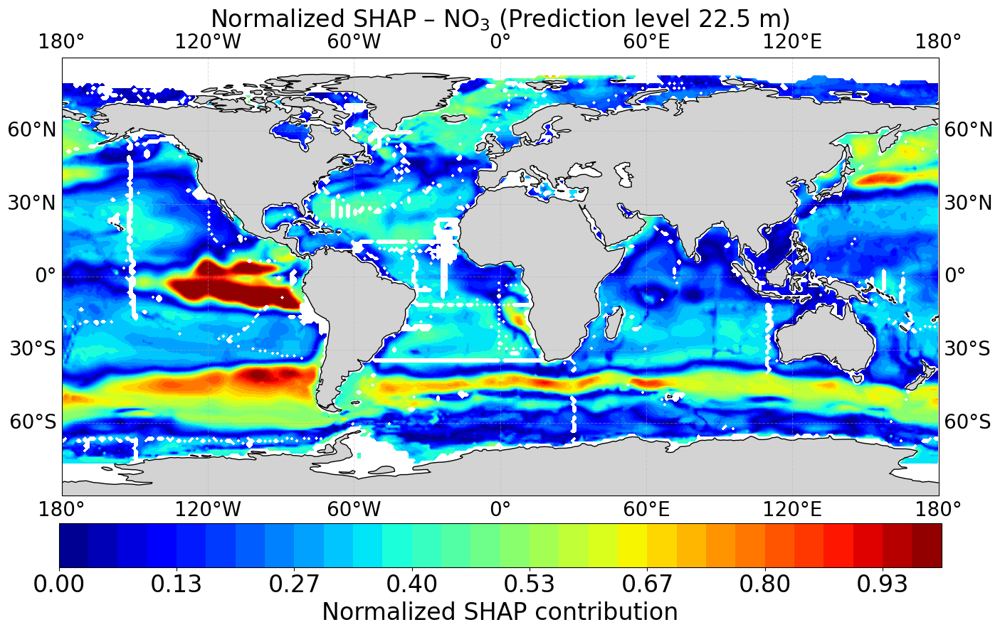

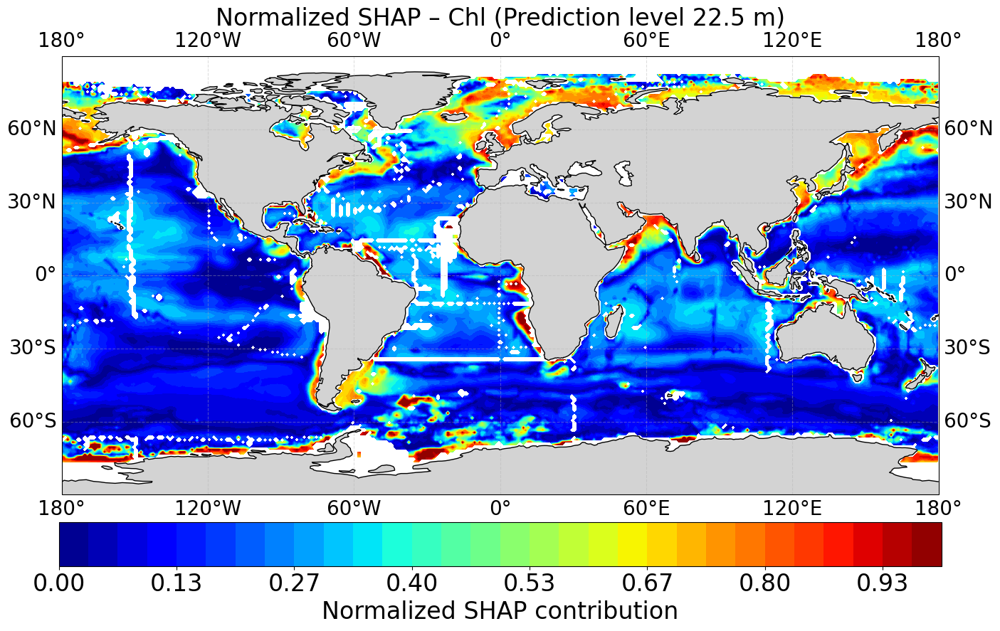

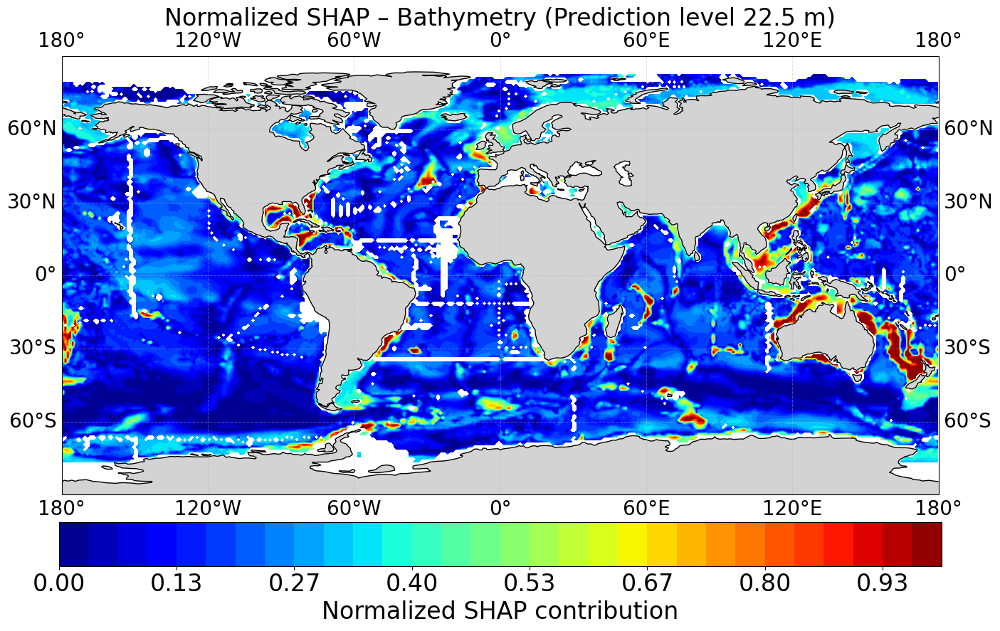

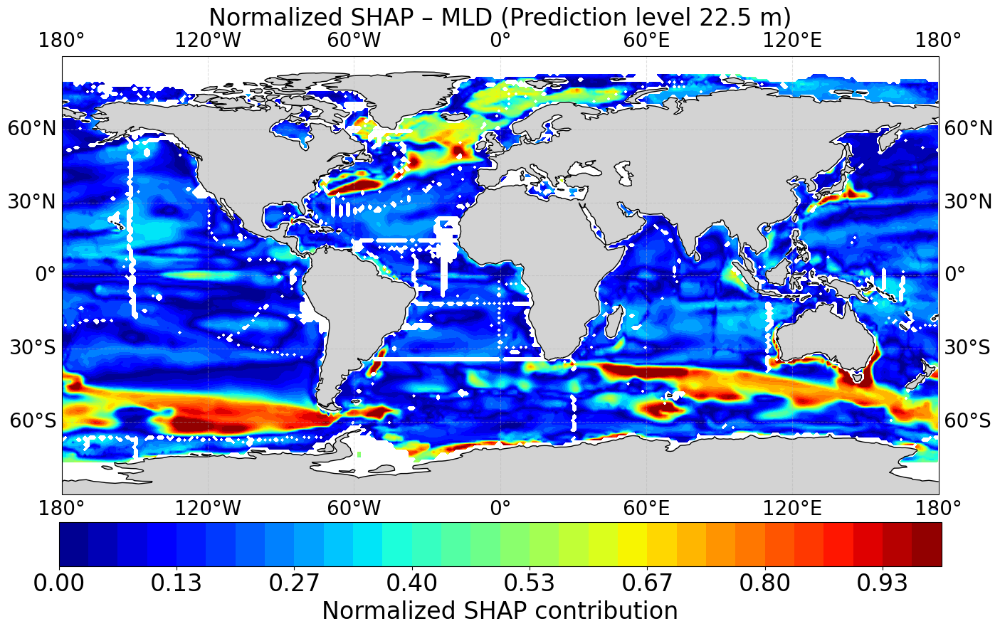

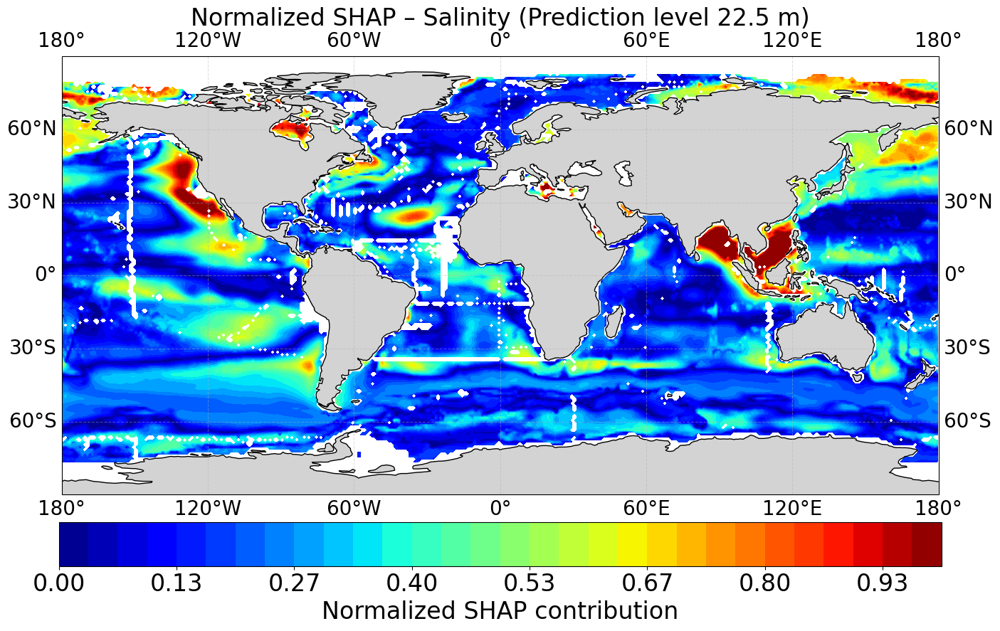

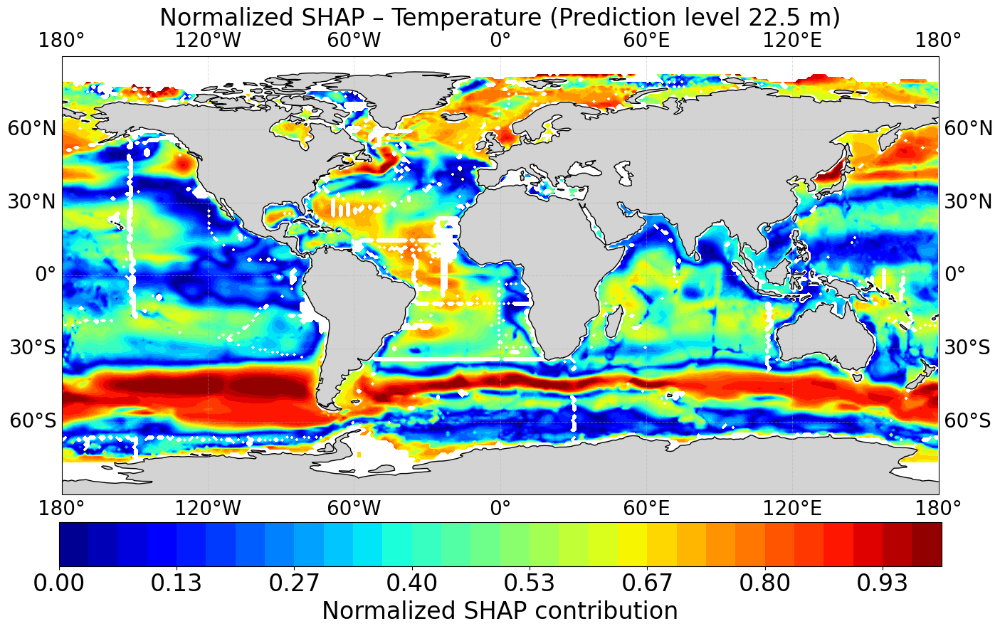

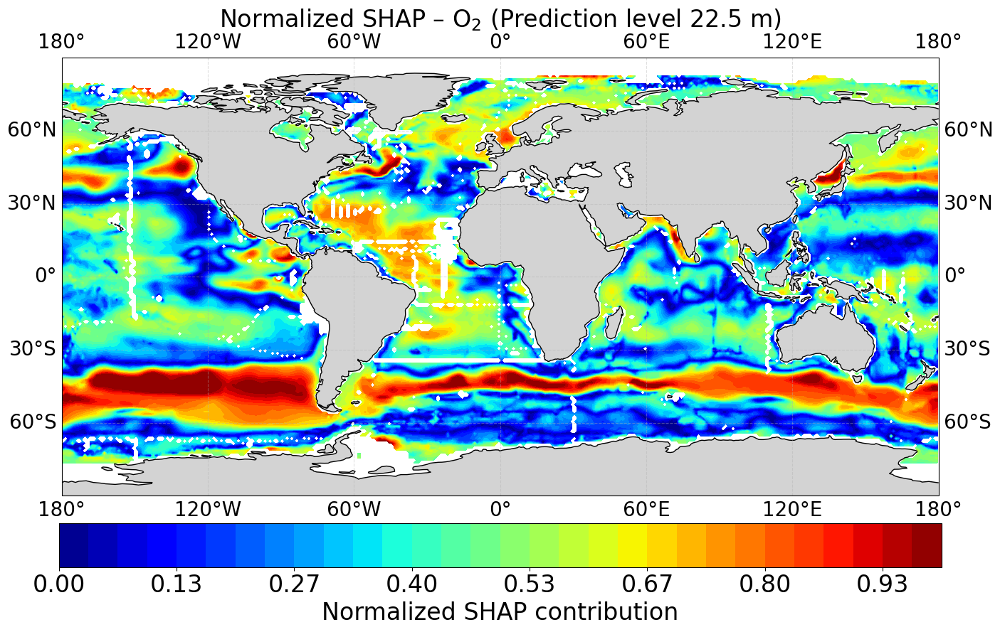

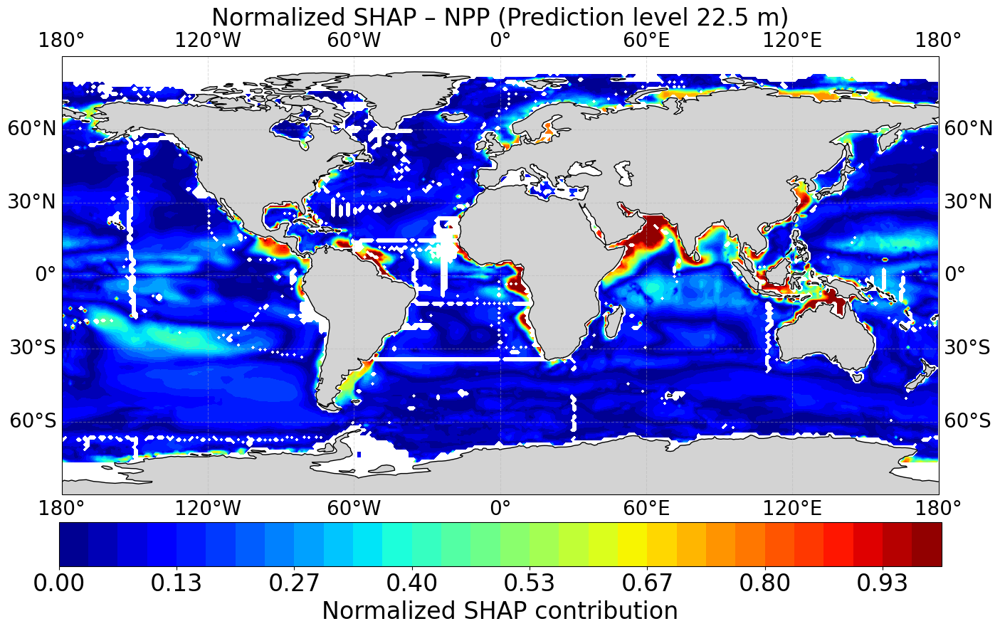

In [39]:
import numpy as np
import scipy.io as io
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.ticker import FormatStrFormatter


def load_shap_grids(idx):
    """
    Loads SHAP total values from shap_total2_{idx}.mat
    Returns (lon2d, lat2d, shap_grids)

    shap_grids shape: (n_features, lat, lon)
    """

    # Load X_test to get valid mask
    X_test = io.loadmat(f"data_X_test_Rf_{idx}.mat")["X"]
    valid_mask = ~np.isnan(X_test).any(axis=1)

    # Lon-lat grid
    lon_axis = ds_lon_missing_selected[idx]
    lat_axis = ds_lat_missing_selected[idx]
    lon2d, lat2d = np.meshgrid(lon_axis, lat_axis, indexing="xy")

    # Load SHAP values (n_samples, n_features)
    shap = io.loadmat(
        f"/Users/navarra/Desktop/shap_total2_{idx}.mat"
    )["shap_total2"]

    n_features = shap.shape[1]

    shap_grids = np.full((n_features, lon2d.size), np.nan)

    for f in range(n_features):
        shap_grids[f, valid_mask] = shap[:, f]

    shap_grids = shap_grids.reshape(
        n_features, lat2d.shape[0], lat2d.shape[1]
    )

    return lon2d, lat2d, shap_grids


# --------------------------------------------------
# Plot settings
# --------------------------------------------------
levels_to_plot = [1]


feature_names = [
    r"NO$_3$", r"Chl", r"Bathymetry",
    r"MLD", r"Salinity", r"Temperature", r"O$_2$", r"NPP"
]

print("Plotting normalized SHAP contour maps...")

for idx in levels_to_plot:

    lon2d, lat2d, shap_grids = load_shap_grids(idx)

    for f, fname in enumerate(feature_names):

        shap_grid = shap_grids[f]

        # --------------------------------------------------
        # Robust normalization to [-1, 1]
        # --------------------------------------------------
        scale = np.nanpercentile(np.abs(shap_grid), 99)

        if scale == 0 or np.isnan(scale):
            continue

        shap_norm = shap_grid / scale
        #shap_norm = np.clip(shap_norm, 0, 1)
        shap_norm = np.clip(np.abs(shap_norm), 0, 1)
 
        # --------------------------------------------------
        # Plot
        # --------------------------------------------------
        fig, ax = plt.subplots(
            subplot_kw={"projection": ccrs.PlateCarree()},
            figsize=(16, 10)
        )

        cf = ax.contourf(
            lon2d, lat2d, np.abs(shap_norm),
            levels=np.linspace(0, 1, 31),
            cmap="jet",
            vmin=0, vmax=1,
            transform=ccrs.PlateCarree()
        )

        ax.add_feature(cfeature.COASTLINE, linewidth=1)
        ax.add_feature(cfeature.LAND, facecolor="lightgray")
        ax.set_extent([-180, 180, -90, 90])

        gl = ax.gridlines(draw_labels=True, linestyle="--", alpha=0.4)
        gl.top_labels = True
        gl.right_labels = True
        gl.xlabel_style = {"size": 20}
        gl.ylabel_style = {"size": 20}


        cbar = plt.colorbar(
            cf, ax=ax, orientation="horizontal", pad=0.05
        )
        cbar.set_label("Normalized SHAP contribution", fontsize=24)
        cbar.ax.tick_params(labelsize=24)
        cbar.ax.xaxis.set_major_formatter(
            FormatStrFormatter('%.2f')
        )

        ax.set_title(
            f"Normalized SHAP – {fname} (Prediction level 22.5 m)",
            fontsize=24
        )

        plt.show()


/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)


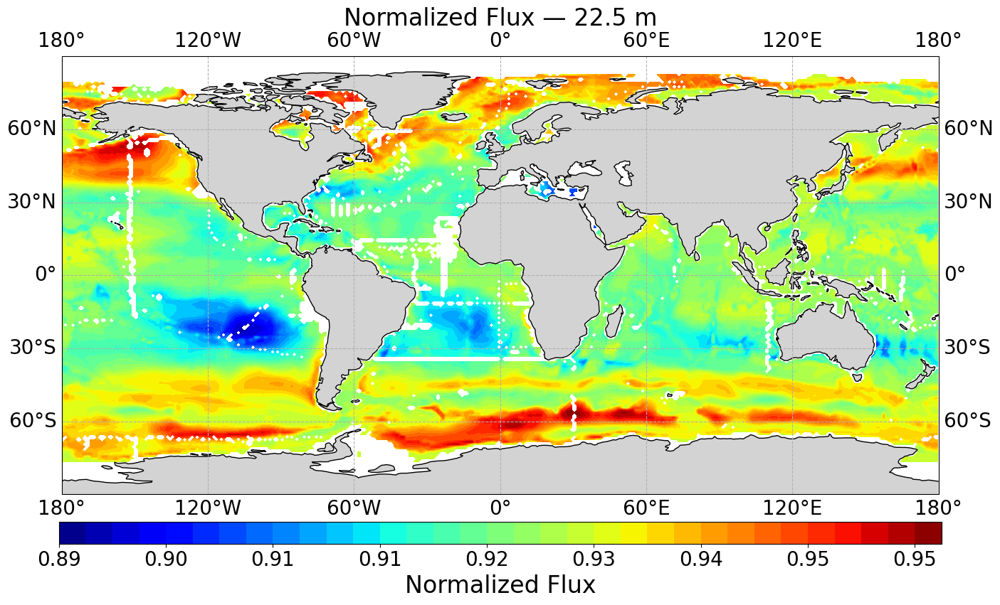

/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)


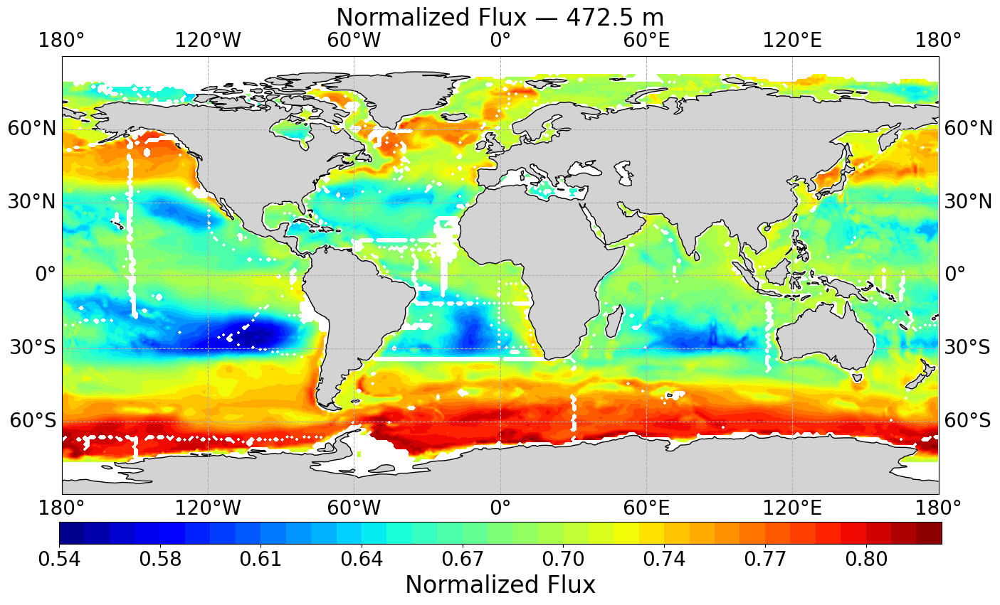

/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)


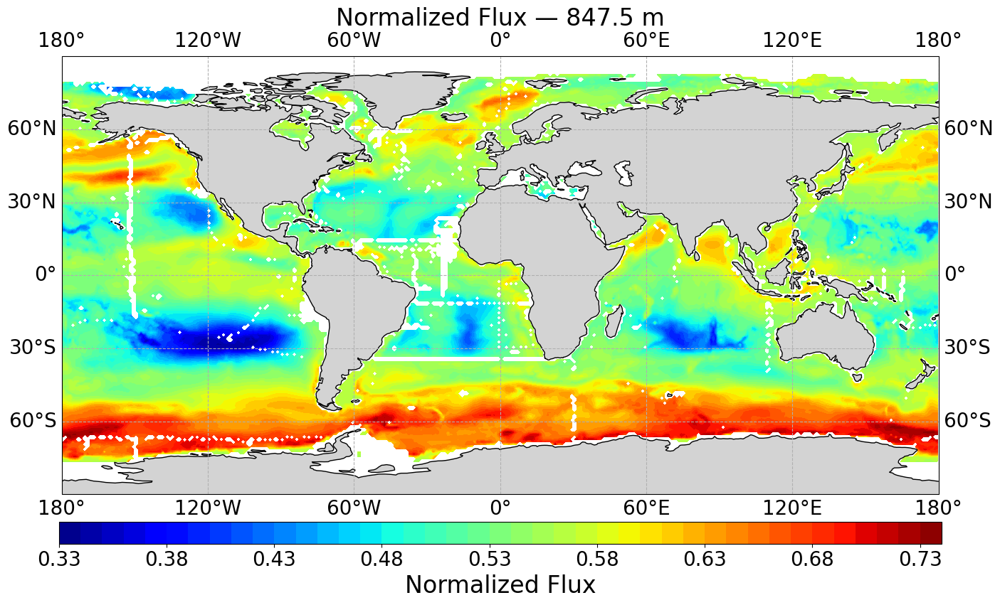

/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_16666/1685537558.py:175: RuntimeWarning: Mean of empty slice
  b_mean = np.nanmean(b_ens, axis=0)
/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)


✅ File 'b_mean_data.mat' has been saved successfully.


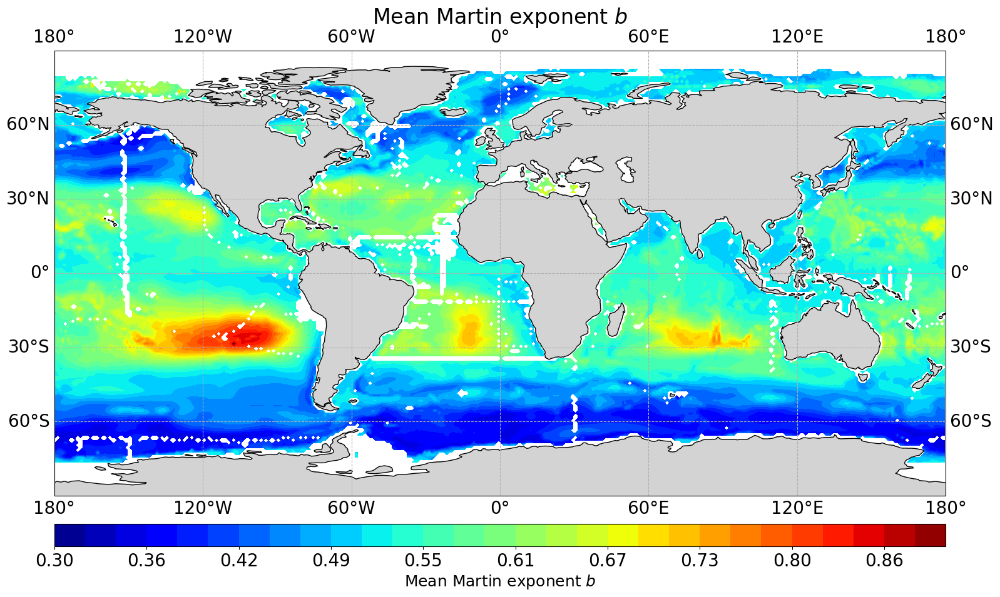

/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)


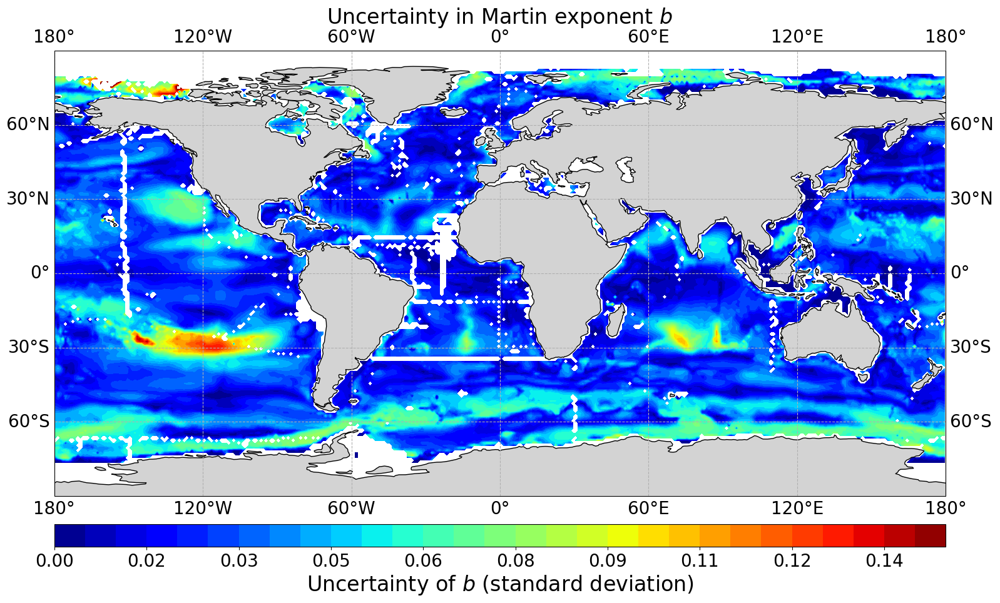

In [79]:
import numpy as np
import scipy.io as io
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import scipy.io
import numpy as np
# ------------------------------------------------------------
# Selected prediction indices
# ------------------------------------------------------------
levels = [1, 6, 11]   # original prediction indices
nlev = len(levels)
def load_prediction_grid(i, col):
    """
    col = 0 -> Beta
    col = 1 -> Biovolume
    """

    X_test = io.loadmat(f"data_X_test_Rf_{i}.mat")["X"]
    valid_mask = ~np.isnan(X_test).any(axis=1)

    lon_axis = ds_lon_missing_selected[i]
    lat_axis = ds_lat_missing_selected[i]
    lon2d, lat2d = np.meshgrid(lon_axis, lat_axis, indexing="xy")

    data = io.loadmat(f"/Users/navarra/Desktop/prediction4_gr_{i}.mat")["predictions3"]
    pred = data[:, col]

    grid = np.full(lon2d.size, np.nan)
    grid[valid_mask] = pred
    grid = grid.reshape(lat2d.shape)

    return lon2d, lat2d, grid

# ------------------------------------------------------------
# Load all selected predictions
# ------------------------------------------------------------
beta_all = []
bvol_all = []

for idx in levels:
    _, _, beta = load_prediction_grid(idx, col=0)
    _, _, bvol = load_prediction_grid(idx, col=1)

    beta_all.append(beta)
    bvol_all.append(bvol)

beta_all = np.array(beta_all)   # (3, lat, lon)
bvol_all = np.array(bvol_all)   # (3, lat, lon)

# ------------------------------------------------------------
# Depths corresponding to prediction indices
# ------------------------------------------------------------
z_full = np.array([
    22.5, 97.5, 172.5, 247.5, 322.5,
    397.5, 472.5, 547.5, 627.5,
    697.5, 772.5, 847.5
])

z_sel = z_full[levels]   # depths for [1, 6, 11]

# ------------------------------------------------------------
# Constants
# ------------------------------------------------------------
c_r  = 0.03
eta  = 2.28
smax = 0.102
smin = 5.16

r = np.mean(radius) * 1e-3  # meters
A_MF = (c_r * 1.17) / (2.2e5)

# ------------------------------------------------------------
# Allocate flux arrays
# ------------------------------------------------------------
F = np.full_like(beta_all, np.nan)
CF = np.full_like(beta_all, np.nan)

# ------------------------------------------------------------
# Compute flux
# ------------------------------------------------------------
for k in range(nlev):

    beta = beta_all[k]
    bio  = bvol_all[k] * 1e-9
    z    = z_sel[k]

    F[k] = (
        r ** (2.28 + 1.17 - beta)
        * (1 + A_MF * r ** (-1.17) * z) ** ((1 - beta) / 1.17)
    )

    CF[k] = r ** (2.28 + 1.17 - beta)

# Normalized flux
F_norm = F / CF

z_ref = z_sel[-1]   # e.g. deepest prediction depth

z0 = z_sel[0]
F0, F1 = F[0], F[-1]

# ------------------------------------------------------------
# Effective Martin exponent from log-log slope
# ------------------------------------------------------------
# ------------------------------------------------------------
# Compute effective Martin b from NORMALIZED flux only
# ------------------------------------------------------------
z = z_sel.astype(float)
logz = np.log(z)

b_map = np.full(F[0].shape, np.nan)

A = A_MF  # already defined





for k, idx in enumerate(levels):

    lon2d, lat2d, _ = load_prediction_grid(idx, 0)
    field = np.ma.masked_invalid(F_norm[k])

    fig, ax = plt.subplots(
        subplot_kw={"projection": ccrs.PlateCarree()},
        figsize=(16, 10)
    )

    cf = ax.contourf(
        lon2d, lat2d, field,
        levels=40,
        cmap="jet",
        shading="nearest",
        transform=ccrs.PlateCarree(),
    )

    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.LAND, facecolor="lightgray")
    ax.set_extent([-180, 180, -90, 90])

    gl = ax.gridlines(draw_labels=True, linestyle="--")
    gl.top_labels = True
    gl.right_labels = True
    gl.xlabel_style = {"size": 20}
    gl.ylabel_style = {"size": 20}
    cbar = plt.colorbar(
    cf, 
    ax=ax, 
    orientation="horizontal", 
    pad=0.05, aspect=40,
    format='%.2f'  # This forces one decimal place
    )
    ax.set_title(
        rf"Normalized Flux — {Z[k]} m",
        fontsize=24
    )
    cbar.set_label("Normalized Flux", fontsize=24)
    cbar.ax.tick_params(labelsize=20)
    plt.show()

# beta_all shape: (n_ens, ny, nx)
n_ens = beta_all.shape[0]

b_ens = np.full_like(beta_all, np.nan)

for i in range(n_ens):
    b_ens[i] = (
        (beta_all[i] - 1.0) / 1.17
        * (A * r**(-1.17) * z_ref)
        / (1.0 + A * r**(-1.17) * z_ref)
    )

b_ens = np.where(np.isfinite(b_ens), b_ens, np.nan)
b_mean = np.nanmean(b_ens, axis=0)


# Assuming b_ens is your ensemble array
# b_mean = np.nanmean(b_ens, axis=0)

# Save to a .mat file
# The input to savemat must be a dictionary where the key is the 
# variable name you want to see inside MATLAB.
scipy.io.savemat('b_mean_data.mat', {'b_mean': b_mean})

print("✅ File 'b_mean_data.mat' has been saved successfully.")
b_std = np.nanstd(b_ens, axis=0)
scipy.io.savemat('b_std_data.mat', {'b_std': b_std})

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(
    figsize=(16, 10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

cf = ax.contourf(
    lon2d, lat2d, b_mean,
    levels=np.linspace(0.3, 0.9, 30),
    cmap="jet",               # consider changing later (see note below)
    shading="nearest",
    transform=ccrs.PlateCarree()
)

ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.LAND, facecolor="lightgray")
ax.set_extent([-180, 180, -90, 90])
gl = ax.gridlines(draw_labels=True, linestyle="--")
gl.top_labels = True
gl.right_labels = True
gl.xlabel_style = {"size": 20}
gl.ylabel_style = {"size": 20}
cbar = plt.colorbar(
    cf, ax=ax,
    orientation="horizontal",
    pad=0.05, aspect=40,
    format="%.2f"
)
cbar.set_label(r"Mean Martin exponent $b$", fontsize=18)
cbar.ax.tick_params(labelsize=20)

ax.set_title("Mean Martin exponent $b$", fontsize=24)

plt.tight_layout()
plt.show()

fig, ax = plt.subplots(
    figsize=(16, 10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

pcm = ax.contourf(
    lon2d, lat2d, b_std,
    levels=np.linspace(0, 0.15, 30),
    cmap="jet",
    shading="nearest",
    transform=ccrs.PlateCarree(),
    vmin=0,
    vmax=0.15  # robust scaling
)

ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.LAND, facecolor="lightgray")
ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(
    pcm, ax=ax,
    orientation="horizontal",
    pad=0.05, aspect=40,
    format="%.2f"
)
gl = ax.gridlines(draw_labels=True, linestyle="--")
gl.top_labels = True
gl.right_labels = True
gl.xlabel_style = {"size": 20}
gl.ylabel_style = {"size": 20}
cbar.set_label(r"Uncertainty of $b$ (standard deviation)", fontsize=24)
cbar.ax.tick_params(labelsize=20)


ax.set_title("Uncertainty in Martin exponent $b$", fontsize=24)

plt.tight_layout()
plt.show()




/var/folders/hz/c2bm3dxj1bg8v39tp3k4wl5r0000gp/T/ipykernel_3108/533389429.py:14: RuntimeWarning: Mean of empty slice
  b_mean = np.nanmean(b_ens, axis=0)
/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


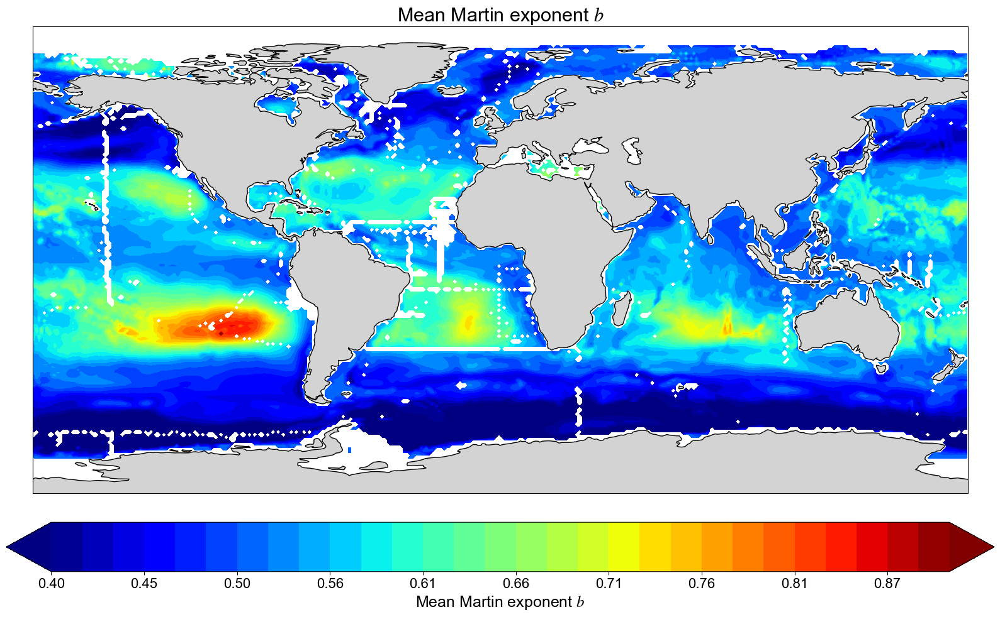

/Users/navarra/anaconda3/envs/oxygen/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)


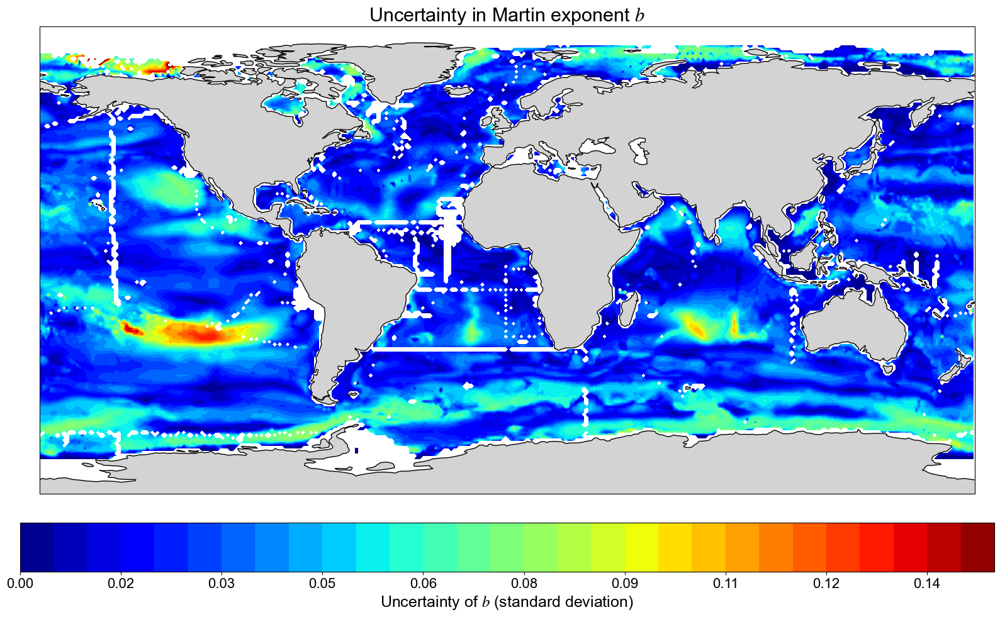

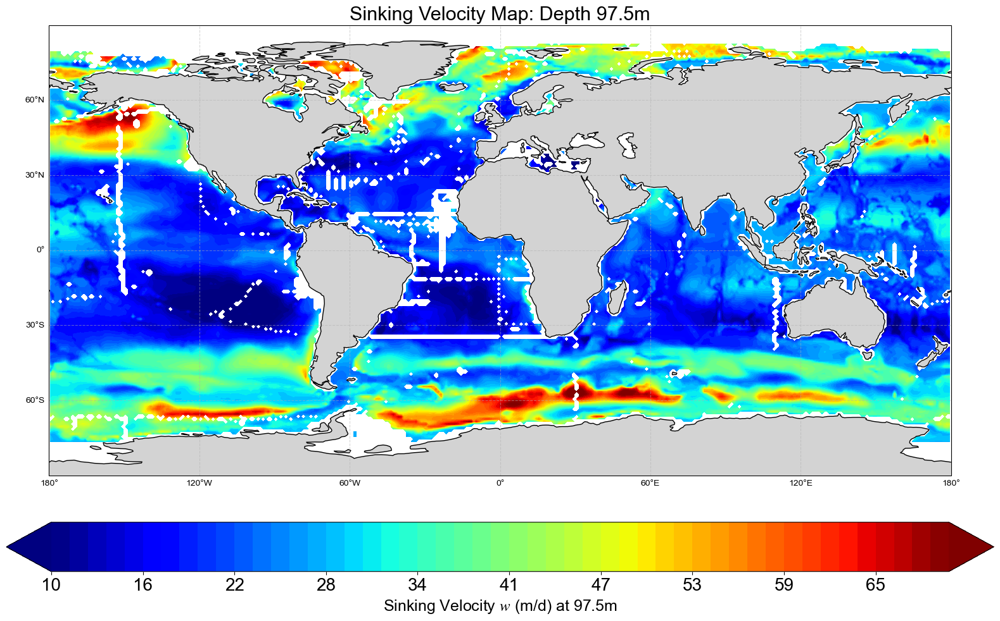

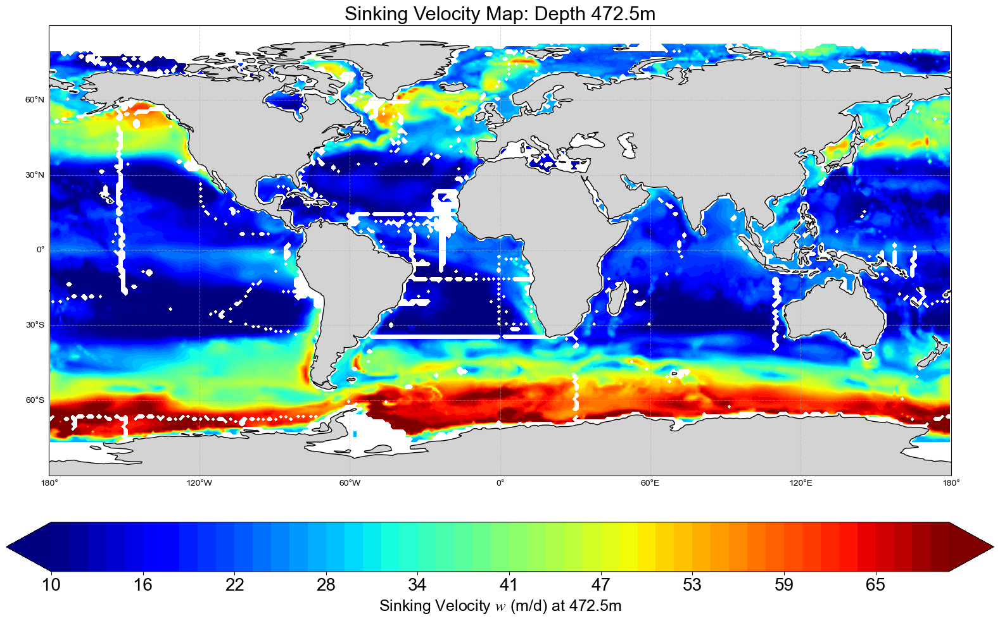

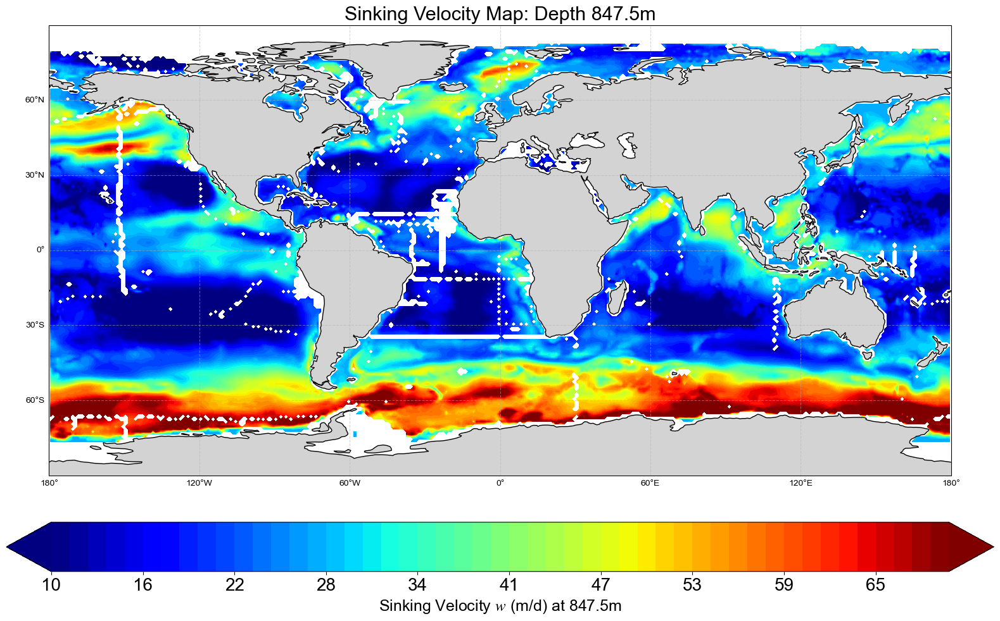

In [176]:
# ------------------------------------------------------------
# 1. Stabilized Sinking Velocity Calculation
# ------------------------------------------------------------
W = np.full_like(beta_all, np.nan)
day_scaling = 86400 
z_full = np.array([
    22.5, 97.5, 172.5, 247.5, 322.5,
    397.5, 472.5, 547.5, 627.5,
    697.5, 772.5, 847.5
])

z_sel = z_full[levels]   # depths for [1, 6, 11]

for k in range(nlev):
    # Clip beta to stay within physically and numerically safe limits
    # beta values too close to 1.0 or 2.0 can cause exponents to fail
    beta = np.clip(beta_all[k], 2.5, 4.5) 
    z = z_sel[k]

    # MATHEMATICAL SIMPLIFICATION:
    # Instead of calculating huge numbers for F and M separately, 
    # we calculate the ratio. In your model, F/M simplifies 
    # largely to r^(eta). 
    
    # To see spatial variability driven by the power law, use the 
    # definite integral ratio result:
    exp_F = (2.28 + 1.17 - beta + 1)
    exp_M = (2.28 - beta + 1)
    
    # Numerical stability check for integrals
    F_int = (r_max**exp_F - r_min**exp_F) / exp_F
    M_int = (r_max**exp_M - r_min**exp_M) / exp_M
    
    # Ratio * Time Scaling
    # This ensures W is in meters/day
    W_spatial = (F_int / M_int) * day_scaling
    
    # Re-apply the depth acceleration factor from your original model
    # (1 + A_MF * r_min**(-1.17) * z)
    accel = (1 + A_MF * r_min**(-1.17) * z)
    
    W[k] = W_spatial 

# Check for any remaining NaNs and replace with a baseline (optional)

# ------------------------------------------------------------
# 3. Visualization
# ------------------------------------------------------------
# ... (Your visualization code remains the same)
# ------------------------------------------------------------
# 3. Visualization
# ------------------------------------------------------------
for k in range(nlev):
    fig, ax = plt.subplots(figsize=(16, 10), subplot_kw={"projection": ccrs.PlateCarree()})
    
    # Set limits that capture the gradient between Tropics and Poles
    if k==0:
       vmin = 10
       vmax = 70 
    if k==1:
       vmin = 10
       vmax = 70
    if k==2:
       vmin = 10
       vmax = 70    
    
    cf = ax.contourf(
        lon2d, lat2d, W[k],
        levels=np.linspace(vmin, vmax, 50),
        cmap="jet",
        extend='both',  # CRITICAL: prevents white "out of bounds" holes at poles
        transform=ccrs.PlateCarree(),
    )
    
    ax.add_feature(cfeature.COASTLINE, linewidth=1)
    ax.add_feature(cfeature.LAND, facecolor="lightgray")
    ax.set_extent([-180, 180, -90, 90])
    
    # Formatting gridlines
    gl = ax.gridlines(draw_labels=True, linestyle="--", alpha=0.5)
    gl.top_labels = False
    gl.right_labels = False
    
    # Colorbar with better formatting
    cbar = plt.colorbar(cf, ax=ax, orientation="horizontal", pad=0.08, format='%.0f')
    cbar.set_label(f"Sinking Velocity $w$ (m/d) at {z_sel[k]}m", fontsize=18)
    cbar.ax.tick_params(labelsize=20)
    
    ax.set_title(f"Sinking Velocity Map: Depth {z_sel[k]}m", fontsize=22)
    plt.tight_layout()
    plt.show()

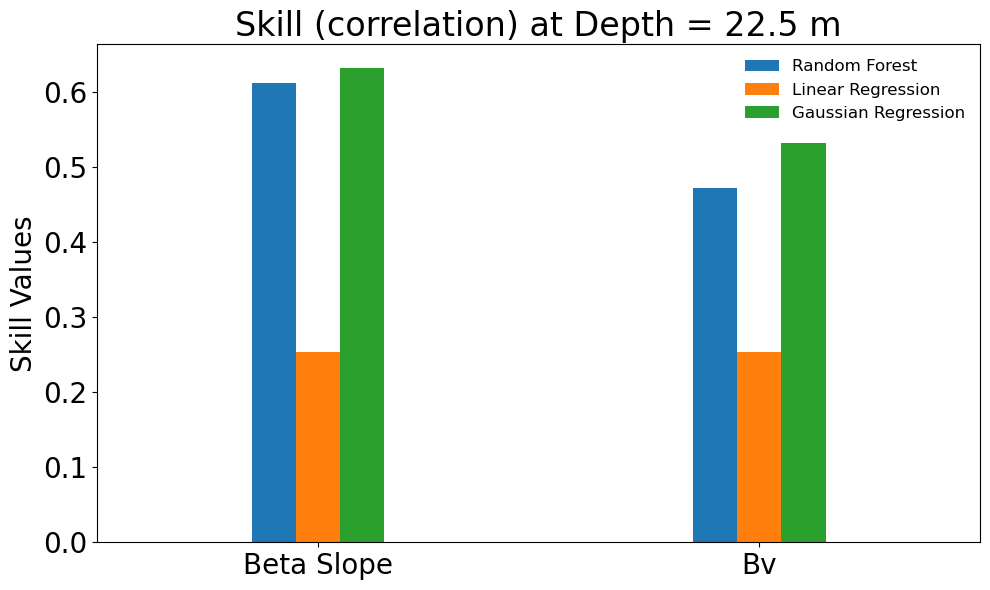

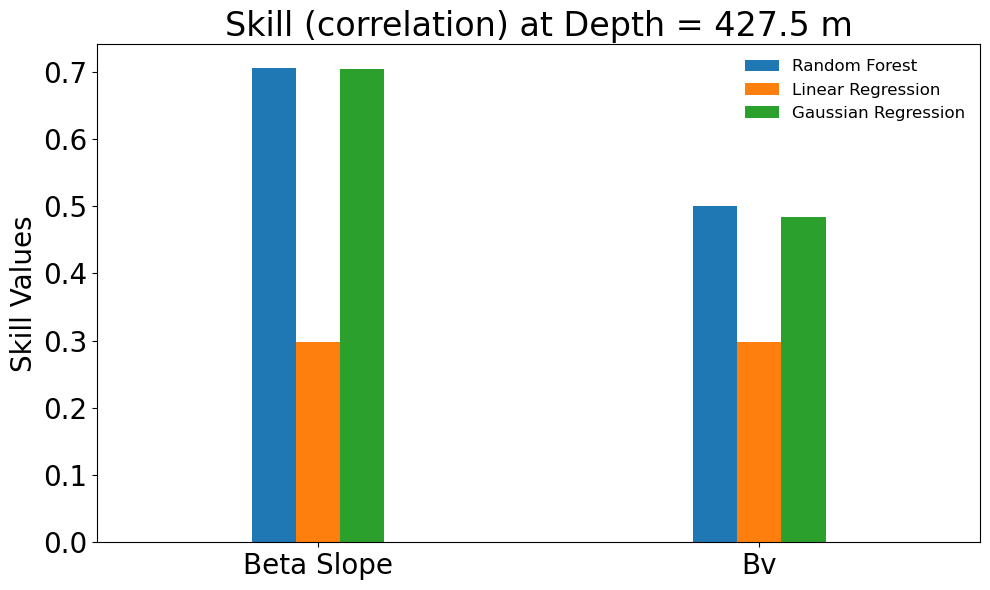

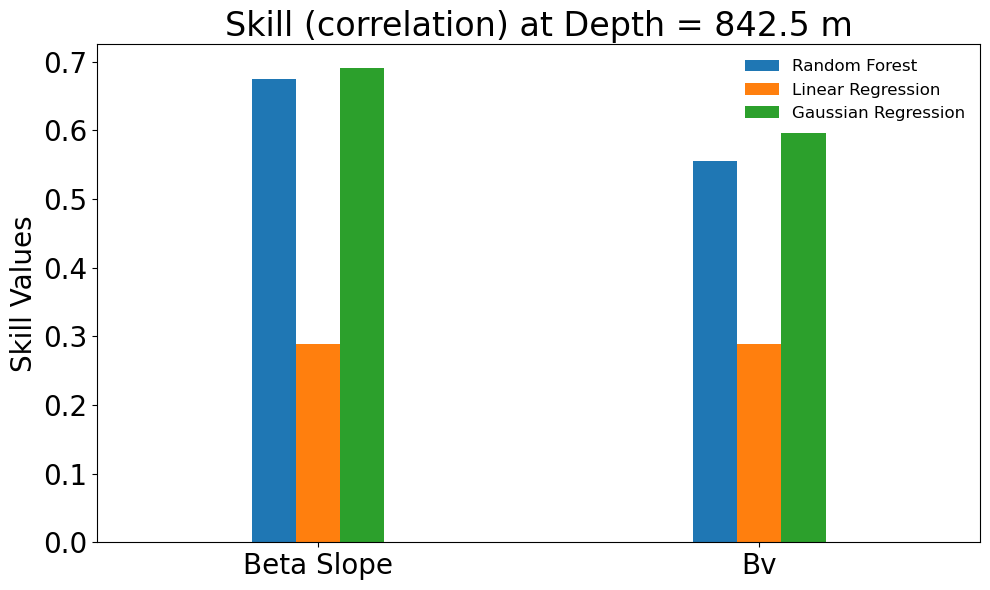

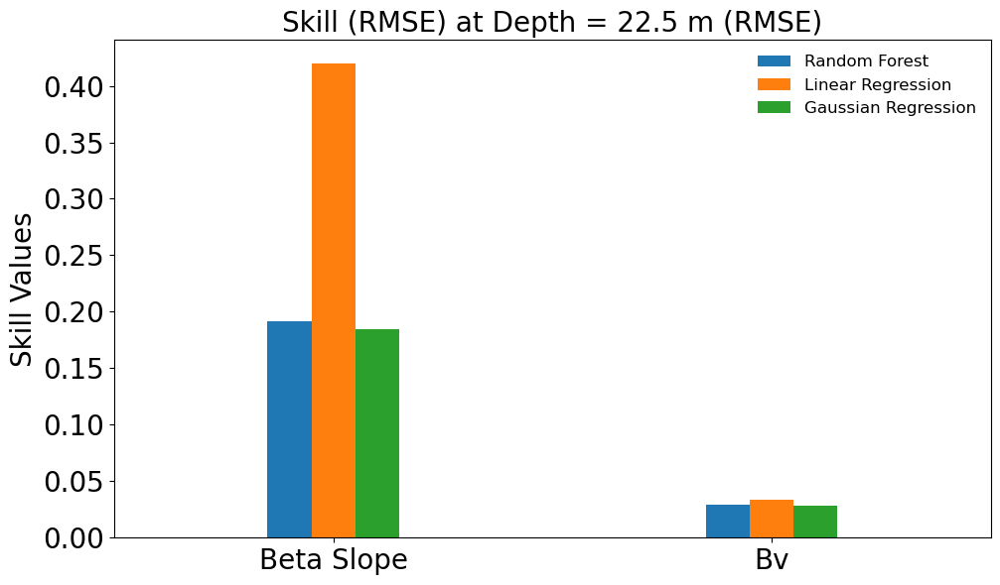

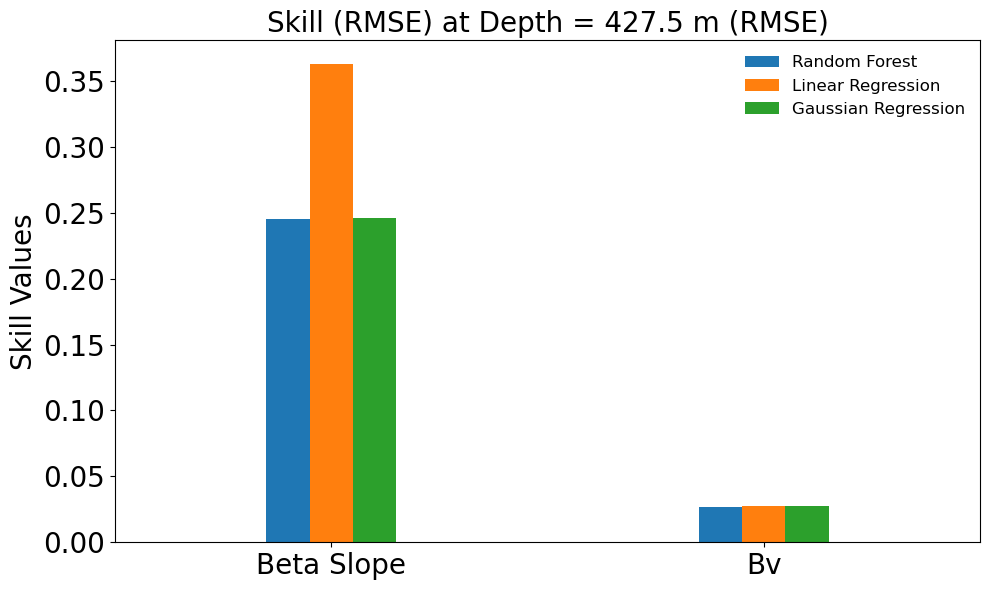

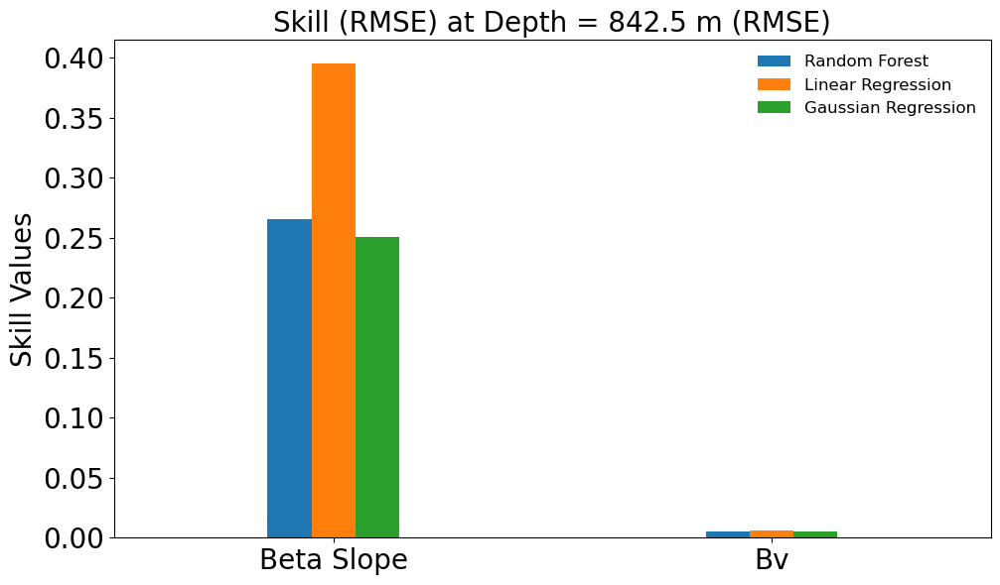

In [2]:
depth_labels = {
    1:   22.5,
    6:  427.5,
    11: 842.5
}


import scipy.io as io
import numpy as np
data = io.loadmat('/Users/navarra/Desktop/skill_Rf.mat')
skill_Rf=data['skill_Rf']
skill_Rf=np.nanmean(skill_Rf,axis=0)
import scipy.io as io
data = io.loadmat('/Users/navarra/Desktop/skill_lin.mat')
skill_lin=data['skill_lin']

skill_lin=np.nanmean(skill_lin,axis=0)
import scipy.io as io
data = io.loadmat('/Users/navarra/Desktop/skill_gr.mat')
skill_gr=data['skill_gr']
skill_gr=np.nanmean(skill_gr,axis=0)

means = []
for i in range(0, skill_Rf.shape[0], 1):
    chunk = skill_Rf[i:i+1]
    means.append(chunk.mean(axis=0))
skill_total = np.vstack(means)

means = []
for i in range(0, skill_lin.shape[0], 1):
    chunk = skill_lin[i:i+1]
    means.append(chunk.mean(axis=0))
skill_total2 = np.vstack(means)

means = []
for i in range(0, skill_gr.shape[0], 1):
    chunk = skill_gr[i:i+1]
    means.append(chunk.mean(axis=0))
skill_total3 = np.vstack(means)


import numpy as np
import matplotlib.pyplot as plt

for j in [1,6,11]:
    # Define labels for the x-axis
    labels = ['Beta Slope', 'Bv']

    # Define the width of each bar
    bar_width = 0.1
    index = np.arange(len(labels))

    # Create the bar plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot each skill vector with a slight offset for each bar group
    bars1 = ax.bar(index - bar_width, skill_total[j, :], bar_width, label='Random Forest')
    bars2 = ax.bar(index, skill_total2[j, :], bar_width, label='Linear Regression')
    bars3 = ax.bar(index + bar_width, skill_total3[j, :], bar_width, label='Gaussian Regression')

    # Add labels and title with increased font sizes
        # Add labels and title with increased font sizes
        # Add labels and title with increased font sizes
    ax.set_ylabel('Skill Values', fontsize=20)
    
    ax.set_xticks(index)
    ax.set_xticklabels(labels, fontsize=20)
    ax.tick_params(axis='y', labelsize=20)

    # Adjust legend position (UNCHANGED)
    ax.legend(fontsize=12, loc='upper right', frameon=False)

    ax.set_title(f"Skill (correlation) at Depth = {depth_labels[j]} m", fontsize=24)

    # 🔥 REMOVE WHITE SPACE (THIS IS THE FIX)
    ax.set_xlim(-0.5, len(labels) - 0.5)
    ax.margins(x=0.0)
    plt.tight_layout()

    plt.show()



import scipy.io as io
import numpy as np
data = io.loadmat('/Users/navarra/Desktop/skill_Rf_RMSE.mat')
skill_Rf=data['skill_Rf_RMSE']
skill_Rf=np.nanmean(skill_Rf,axis=0)
import scipy.io as io
data = io.loadmat('/Users/navarra/Desktop/skill_lin_RMSE.mat')
skill_lin=data['skill_lin_RMSE']

skill_lin=np.nanmean(skill_lin,axis=0)
import scipy.io as io
data = io.loadmat('/Users/navarra/Desktop/skill_gr_RMSE.mat')
skill_gr=data['skill_gr_RMSE']
skill_gr=np.nanmean(skill_gr,axis=0)

means = []
for i in range(0, skill_Rf.shape[0], 1):
    chunk = skill_Rf[i:i+1]
    means.append(chunk.mean(axis=0))
skill_total = np.vstack(means)

means = []
for i in range(0, skill_lin.shape[0], 1):
    chunk = skill_lin[i:i+1]
    means.append(chunk.mean(axis=0))
skill_total2 = np.vstack(means)

means = []
for i in range(0, skill_gr.shape[0], 1):
    chunk = skill_gr[i:i+1]
    means.append(chunk.mean(axis=0))
skill_total3 = np.vstack(means)


import numpy as np
import matplotlib.pyplot as plt

for j in [1,6,11]:
    # Define labels for the x-axis
    labels = ['Beta Slope', 'Bv']

    # Define the width of each bar
    bar_width = 0.1
    index = np.arange(len(labels))

    # Create the bar plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot each skill vector with a slight offset for each bar group
    bars1 = ax.bar(index - bar_width, skill_total[j, :], bar_width, label='Random Forest')
    bars2 = ax.bar(index, skill_total2[j, :], bar_width, label='Linear Regression')
    bars3 = ax.bar(index + bar_width, skill_total3[j, :], bar_width, label='Gaussian Regression')

    # Add labels and title with increased font sizes
        # Add labels and title with increased font sizes
        # Add labels and title with increased font sizes
    ax.set_ylabel('Skill Values', fontsize=20)
    
    ax.set_xticks(index)
    ax.set_xticklabels(labels, fontsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.set_title(f"Skill (RMSE) at Depth = {depth_labels[j]} m (RMSE)", fontsize=20)

    # Adjust legend position (UNCHANGED)
    ax.legend(fontsize=12, loc='upper right', frameon=False)


    # 🔥 REMOVE WHITE SPACE (THIS IS THE FIX)
    ax.set_xlim(-0.5, len(labels) - 0.5)
    ax.margins(x=0.0)
    plt.tight_layout()
    plt.show()


In [ ]:

### old code

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import io
import cartopy.crs as ccrs
import cartopy.feature as cfeature
data = io.loadmat('/Users/navarra/data_X_test_Rf.mat')

# Extract variables X and y
X_test = data['X']
valid_indices = ~np.isnan(X_test).any(axis=1)
from scipy import io

lon_filtered = lon[valid_indices]
lat_filtered = lat[valid_indices]

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 0],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 0].min(),
    vmax=40
)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 1],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 1].min(),
    vmax=50
)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()


fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 2],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 2].min(),
    vmax=50
)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 3],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 3].min(),
    vmax=60
)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()


fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 4],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 4].min(),
    vmax=70
)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 5],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 5].min(),
    vmax=90
)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 6],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 6].min(),
    vmax=90
)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 7],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 7].min(),
    vmax=90
)


ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 8],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 8].min(),
    vmax=90
)


ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 9],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 9].min(),
    vmax=100
)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())


sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=result[:, 10],
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=result[:, 10].min(),
    vmax=120
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()




In [ ]:
# sinking velocity per basin as a funciton of depth

import numpy as np

# Define the regions based on latitude and longitude conditions
north_pacific_subtropic = (lat_filtered >= 0) & (lat_filtered <= 30) & ((lon_filtered >= 120) | (lon_filtered <= -90))
north_pacific_subpolar = (lat_filtered >= 30) & (lat_filtered <= 60) & ((lon_filtered >= 120) | (lon_filtered <= -90))
south_pacific_subtropic = (lat_filtered <= 0) & (lat_filtered >= -30) & ((lon_filtered >= 120) | (lon_filtered <= -90))
north_atlantic_subtropic = (lat_filtered >= 0) & (lat_filtered <= 30) & (lon_filtered > -90) & (lon_filtered <= 20)
north_atlantic_subpolar = (lat_filtered >= 30) & (lat_filtered <= 60) & (lon_filtered > -90) & (lon_filtered <= 20)
south_atlantic_subtropic = (lat_filtered <= 0) & (lat_filtered >= -30) & (lon_filtered > -90) & (lon_filtered <= 20)
indian_ocean_subtropic = (lat_filtered <= 0) & (lat_filtered >= -30) & (lon_filtered > 20) & (lon_filtered <= 120)
southern_ocean = (lat_filtered < -30)  # Everything below 30S

# Apply conditions to filter data from `result[:, 9]`
regions = {
    "North Pacific Subtropic": {
        "lon": lon_filtered[north_pacific_subtropic],
        "lat": lat_filtered[north_pacific_subtropic],
        "result": result[north_pacific_subtropic, :]  # Select corresponding data from result
    },
    "North Pacific Subpolar": {
        "lon": lon_filtered[north_pacific_subpolar],
        "lat": lat_filtered[north_pacific_subpolar],
        "result": result[north_pacific_subpolar, :]  # Select corresponding data from result
    },

    "South Pacific Subtropic": {
        "lon": lon_filtered[south_pacific_subtropic],
        "lat": lat_filtered[south_pacific_subtropic],
        "result": result[south_pacific_subtropic, :]
    },
    "North Atlantic Subtropic": {
        "lon": lon_filtered[north_atlantic_subtropic],
        "lat": lat_filtered[north_atlantic_subtropic],
        "result": result[north_atlantic_subtropic, :]
    },
    "North Atlantic Subpolar": {
        "lon": lon_filtered[north_atlantic_subpolar],
        "lat": lat_filtered[north_atlantic_subpolar],
        "result": result[north_atlantic_subpolar, :]
    },
    "South Atlantic Subtropic": {
        "lon": lon_filtered[south_atlantic_subtropic],
        "lat": lat_filtered[south_atlantic_subtropic],
        "result": result[south_atlantic_subtropic, :]
    },
    "Indian Ocean Subtropic": {
        "lon": lon_filtered[indian_ocean_subtropic],
        "lat": lat_filtered[indian_ocean_subtropic],
        "result": result[indian_ocean_subtropic, :]
    },
    "Southern Ocean": {
        "lon": lon_filtered[southern_ocean],
        "lat": lat_filtered[southern_ocean],
        "result": result[southern_ocean, :]
    }
}

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Extract data for North Pacific Subtropic

result_npsubtropical = regions["North Pacific Subtropic"]["result"]
result_npsubpolar = regions["North Pacific Subpolar"]["result"]
result_spsubtropical = regions["South Pacific Subtropic"]["result"]


result_nasubtropical = regions["North Atlantic Subtropic"]["result"]
result_nasubpolar = regions["North Atlantic Subpolar"]["result"]
result_sasubtropical = regions["South Atlantic Subtropic"]["result"]

result_indiansubtropical = regions["Indian Ocean Subtropic"]["result"]
result_sosubpolar = regions["Southern Ocean"]["result"]
# Create the figure and axis


A=[result_npsubtropical,result_npsubpolar,result_spsubtropical,result_nasubtropical,result_nasubpolar,result_sasubtropical,result_indiansubtropical,result_sosubpolar]
 
A=[60,110,160,220,290,370,450,550,660,860]
plt.figure()
plt.plot(A,np.nanmean(result_npsubtropical, axis=0))
plt.title('Sinking Velocity for North Pacific Subtropic')
plt.gca().invert_yaxis()  # Invert Y-axis

# Add labels
plt.xlabel("Depth (m)")  # Change label based on what x represents
plt.ylabel("Sinking Velocity (m/d)")  # Change label based on what y represents

plt.show()

plt.figure()
plt.plot(A,np.nanmean(result_npsubpolar, axis=0))
plt.title('Sinking Velocity for North Pacific Subpolar')
plt.gca().invert_yaxis()  # Invert Y-axis

# Add labels
plt.xlabel("Depth (m)")  # Change label based on what x represents
plt.ylabel("Sinking Velocity (m/d)")  # Change label based on what y represents

plt.show()


plt.figure()
plt.plot(A,np.nanmean(result_spsubtropical, axis=0))
plt.title('Sinking Velocity for South Pacific Subtropic')
plt.gca().invert_yaxis()  # Invert Y-axis

# Add labels
plt.xlabel("Depth (m)")  # Change label based on what x represents
plt.ylabel("Sinking Velocity (m/d)")  # Change label based on what y represents

plt.show()

plt.figure()
plt.plot(A,np.nanmean(result_nasubtropical, axis=0))
plt.title('Sinking Velocity for North Atlantic Subtropic')
plt.gca().invert_yaxis()  # Invert Y-axis

# Add labels
plt.xlabel("Depth (m)")  # Change label based on what x represents
plt.ylabel("Sinking Velocity (m/d)")  # Change label based on what y represents

plt.show()

plt.figure()
plt.plot(A,np.nanmean(result_nasubpolar, axis=0))
plt.title('Sinking Velocity for North Atlantic Subpolar')
plt.gca().invert_yaxis()  # Invert Y-axis

# Add labels
plt.xlabel("Depth (m)")  # Change label based on what x represents
plt.ylabel("Sinking Velocity (m/d)")  # Change label based on what y represents

plt.show()

plt.figure()
plt.plot(A,np.nanmean(result_sasubtropical, axis=0))
plt.title('Sinking Velocity for South Atlantic Subtropic')
plt.gca().invert_yaxis()  # Invert Y-axis

# Add labels
plt.xlabel("Depth (m)")  # Change label based on what x represents
plt.ylabel("Sinking Velocity (m/d)")  # Change label based on what y represents

plt.show()

plt.figure()
plt.plot(A,np.nanmean(result_indiansubtropical, axis=0))
plt.title('Sinking Velocity for Indian Ocean Subtropic')
plt.gca().invert_yaxis()  # Invert Y-axis

# Add labels
plt.xlabel("Depth (m)")  # Change label based on what x represents
plt.ylabel("Sinking Velocity (m/d)")  # Change label based on what y represents

plt.show()

plt.figure()
plt.plot(A,np.nanmean(result_sosubpolar, axis=0))
plt.title('Sinking Velocity for Southern Ocean')
plt.gca().invert_yaxis()  # Invert Y-axis

# Add labels
plt.xlabel("Depth (m)")  # Change label based on what x represents
plt.ylabel("Sinking Velocity (m/d)")  # Change label based on what y represents

plt.show()

In [ ]:
#  transfer efficency
from matplotlib.colors import LogNorm

data = io.loadmat('/Users/navarra/data_X_test_Rf.mat')
print('data',data)
# Extract variables X and y
X_test = data['X']
X_test =X_test#np.concatenate((A2_no3[:, np.newaxis], A2_po4[:, np.newaxis], A_chl2[:, np.newaxis], A_oceqsw2[:, np.newaxis], A_bath2[:, np.newaxis], A_mld2[:, np.newaxis], A2_sal[:, np.newaxis], A2_temp[:, np.newaxis], A2_o2[:, np.newaxis]), axis=1)
    
# Filter out rows with NaN values
valid_indices = ~np.isnan(X_test).any(axis=1)

lon_filtered = lon[valid_indices]
lat_filtered = lat[valid_indices]

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 0], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 0], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 0], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Normalized Flux',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 1], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 1], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 1], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Normalized Flux',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()


fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 2], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 2], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 2], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Normalized Flux',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 3], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 3], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 3], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Normalized Flux',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()


fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 4], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 4], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 4], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Normalized Flux',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 5], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 5], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 5], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Normalized Flux',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 6], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 6], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 6], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 7], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 7], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 7], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 8], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 8], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 8], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 9], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 9], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 9], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()


fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

#sc = ax.scatter(lon_filtered, lat_filtered, c=np.nanmean(transfer_efficency[:,:9,0],axis=1), cmap='jet', marker='o', alpha=0.7,
#                    transform=ccrs.PlateCarree(), vmin=np.nanmean(transfer_efficency[:,:9,0],axis=1).min(), vmax=np.nanmean(transfer_efficency[:,:9,0],axis=1).max())
sc = ax.scatter(
    lon_filtered, lat_filtered,
    c=np.nanmean(normalized_flux[:, :, 10], axis=1),
    cmap='jet', marker='o', alpha=0.7,
    transform=ccrs.PlateCarree(),
    vmin=np.nanmean(normalized_flux[:, :, 10], axis=1).min(),
    vmax=np.nanmean(normalized_flux[:, :, 10], axis=1).max()
)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Sinking Velocity (m/d)',fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

In [ ]:
(A/A.std()).max()

In [ ]:
# shrinking due to remineralization , dw/dz

z2=[52.5,122.5, 197.5,267.5 ,342.5,422.5,492.5,567.5,637.5,717.5,802.5]
import numpy as np

# Ensure A and B are arrays of the correct size
A = np.zeros(result.shape[0])  # Initialize A as an array with correct size
B = np.zeros(result.shape[0])  # Initialize B as an array with correct size


data = io.loadmat('/Users/navarra/data_X_test_Rf.mat')
print('data',data)
# Extract variables X and y
X_test = data['X']
X_test =X_test#np.concatenate((A2_no3[:, np.newaxis], A2_po4[:, np.newaxis], A_chl2[:, np.newaxis], A_oceqsw2[:, np.newaxis], A_bath2[:, np.newaxis], A_mld2[:, np.newaxis], A2_sal[:, np.newaxis], A2_temp[:, np.newaxis], A2_o2[:, np.newaxis]), axis=1)
    
# Filter out rows with NaN values
valid_indices = ~np.isnan(X_test).any(axis=1)

lon_filtered = lon[valid_indices]
lat_filtered = lat[valid_indices]

#for i in range(result.shape[0]):
#B[i]=(np.nanmean(np.nanmean(n_test2[i,:,:],axis=0),axis=0))
A[:]=((result[:,1]-result[:,0])/(z2[1]-z2[0]))
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())


sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#for i in range(result.shape[0]):
#B=(np.nanmean(np.nanmean(n_test3,axis=1),axis=1))
A[:]=((result[:,2]-result[:,0])/(z2[2]-z2[0]))
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#for i in range(result.shape[0]):
#        B=(np.nanmean(np.nanmean(n_test3,axis=1),axis=1))
A[:]=((result[:,3]-result[:,0])/(z2[3]-z2[0]))#*B[i]
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#for i in range(result.shape[0]):
        #B[i]=(np.nanmean(np.nanmean(n_test4[i,:,:],axis=1),axis=1))
A[:]=((result[:,4]-result[:,0])/(z2[4]-z2[0]))#*B[i]
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#for i in range(result.shape[0]):
        #B[i]=(np.nanmean(np.nanmean(n_test6[i,:,:],axis=1),axis=1))
A[:]=((result[:,5]-result[:,0])/(z2[5]-z2[0]))#*B[i]
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()
#for i in range(result.shape[0]):
        #B[i]=(np.nanmean(np.nanmean(n_test7[i,:,:],axis=1),axis=1))
A[:]=((result[:,6]-result[:,0])/(z2[6]-z2[0]))#*B[i]
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#for i in range(result.shape[0]):
        #B[i]=(np.nanmean(np.nanmean(n_test8[i,:,:],axis=1),axis=1))
A[:]=((result[:,7]-result[:,0])/(z2[7]-z2[0]))#*B[i]
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()


#for i in range(result.shape[0]):
        #B[i]=(np.nanmean(np.nanmean(n_test9[i,:,:],axis=1),axis=1))
A[:]=((result[:,8]-result[:,0])/(z2[8]-z2[0]))#*B[i]
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

#for i in range(result.shape[0]):
        #B[i]=(np.nanmean(np.nanmean(n_test10[i,:,:],axis=1),axis=1))
A[:]=((result[:,9]-result[:,0])/(z2[9]-z2[0]))#*B[i]
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()


A[:]=((result[:,10]-result[:,0])/(z2[10]-z2[0]))#*B[i]
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=-A, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=-A.min(), vmax=-A.max())

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label(r'$\frac{\partial ws}{\partial z}$', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()


In [ ]:
## coeficent b 

z=[52.5,122.5, 197.5,267.5 ,342.5,422.5,492.5,567.5,637.5,717.5,802.5]
A=np.nanmean(normalized_flux,axis=1)
b=np.zeros((A.shape[0],1))
for i in range(0,1): 
    b[:,i]=np.log(np.divide(A[:,2],A[:,i+10]))/np.log(z[i+10]/198)


In [ ]:
import scipy.io as sio

# Save to .mat file
sio.savemat('remineralization_rate.mat', {
    'lon_filtered': lon_filtered,
    'lat_filtered': lat_filtered,
    'b': b
})


In [ ]:

fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

sc = ax.scatter(lon_filtered, lat_filtered, c=b[:,0], cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=0.75, vmax=1)

ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

ax.set_extent([-180, 180, -90, 90])

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('coefficent b', fontsize=16)
cbar.ax.tick_params(labelsize=16)  # Increase fontsize for the numbers on the colorbar
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()



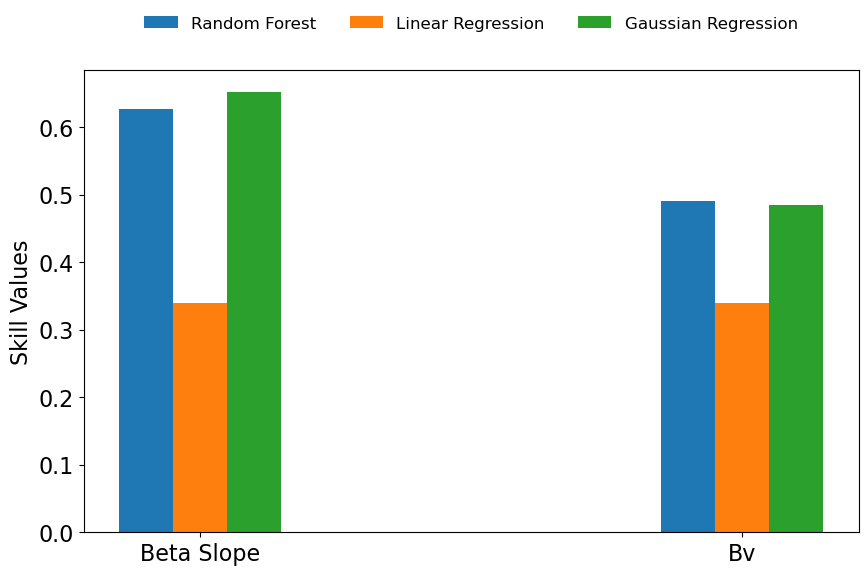

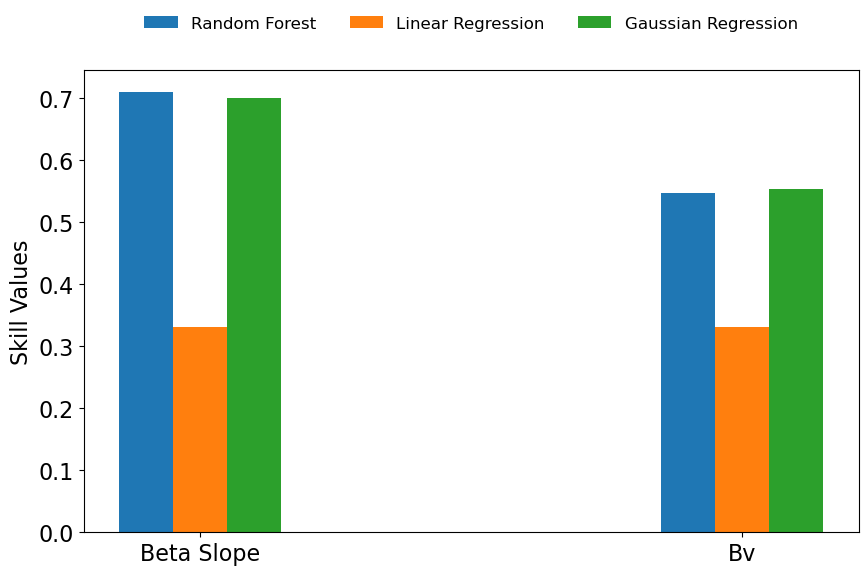

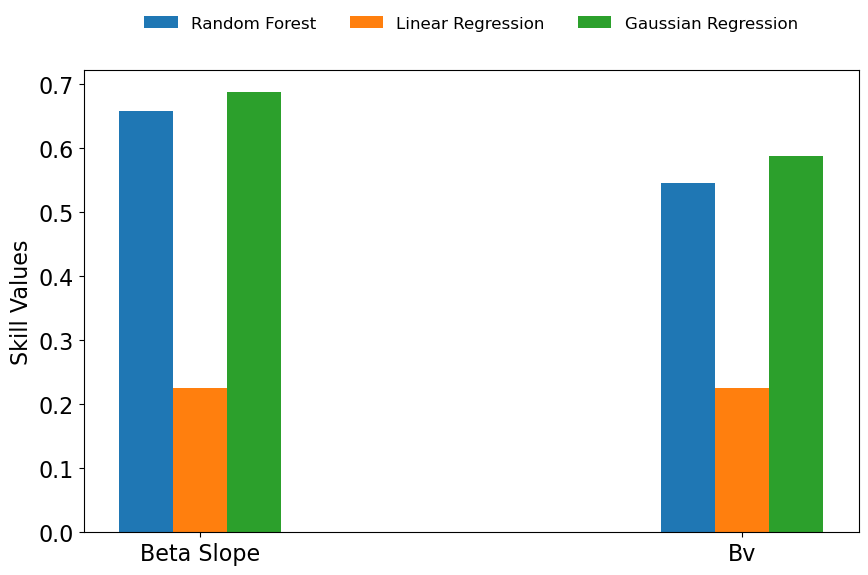

In [16]:
import scipy.io as io
import numpy as np
data = io.loadmat('/Users/navarra/Desktop/skill_Rf.mat')
skill_Rf=data['skill_Rf']
skill_Rf=np.nanmean(skill_Rf,axis=0)

data = io.loadmat('/Users/navarra/Desktop/skill_lin.mat')
skill_lin=data['skill_lin']

skill_lin=np.nanmean(skill_lin,axis=0)
import scipy.io as io
data = io.loadmat('/Users/navarra/Desktop/skill_gr.mat')
skill_gr=data['skill_gr']
skill_gr=np.nanmean(skill_gr,axis=0)

means = []
for i in range(0, skill_Rf.shape[0], 1):
    chunk = skill_Rf[i:i+2]
    means.append(chunk.mean(axis=0))
skill_total = np.vstack(means)

means = []
for i in range(0, skill_lin.shape[0], 1):
    chunk = skill_lin[i:i+2]
    means.append(chunk.mean(axis=0))
skill_total2 = np.vstack(means)

means = []
for i in range(0, skill_gr.shape[0], 1):
    chunk = skill_gr[i:i+2]
    means.append(chunk.mean(axis=0))
skill_total3 = np.vstack(means)


import numpy as np
import matplotlib.pyplot as plt

for j in [1,6,11]:
    # Define labels for the x-axis
    labels = ['Beta Slope', 'Bv']

    # Define the width of each bar
    bar_width = 0.1
    index = np.arange(len(labels))

    # Create the bar plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot each skill vector with a slight offset for each bar group
    bars1 = ax.bar(index - bar_width, skill_total[j, :], bar_width, label='Random Forest')
    bars2 = ax.bar(index, skill_total2[j, :], bar_width, label='Linear Regression')
    bars3 = ax.bar(index + bar_width, skill_total3[j, :], bar_width, label='Gaussian Regression')

    # Add labels and title with increased font sizes
    ax.set_ylabel('Skill Values', fontsize=16)  # Increase font size of y-axis label
    
    ax.set_xticks(index)
    ax.set_xticklabels(labels, fontsize=16)  # Increase font size of x-axis tick labels
    ax.tick_params(axis='y', labelsize=16)  # Increase font size of y-axis tick labels

    # Adjust legend position
    ax.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=3, frameon=False)

    # Display the plot
    plt.show()

In [ ]:
import scipy.io as io
import numpy as np
data = io.loadmat('/Users/navarra/Desktop/skill_Rf_RMSE.mat')
skill_Rf=data['skill_Rf_RMSE']
skill_Rf=np.nanmean(skill_Rf,axis=0)
import scipy.io as io
data = io.loadmat('/Users/navarra/Desktop/skill_lin_RMSE.mat')
skill_lin=data['skill_lin_RMSE']

skill_lin=np.nanmean(skill_lin,axis=0)
import scipy.io as io
data = io.loadmat('/Users/navarra/Desktop/skill_gr_RMSE.mat')
skill_gr=data['skill_gr_RMSE']
skill_gr=np.nanmean(skill_gr,axis=0)

means = []
for i in range(0, skill_Rf.shape[0], 1):
    chunk = skill_Rf[i:i+1]
    means.append(chunk.mean(axis=0))
skill_total = np.vstack(means)

means = []
for i in range(0, skill_lin.shape[0], 1):
    chunk = skill_lin[i:i+1]
    means.append(chunk.mean(axis=0))
skill_total2 = np.vstack(means)

means = []
for i in range(0, skill_gr.shape[0], 1):
    chunk = skill_gr[i:i+1]
    means.append(chunk.mean(axis=0))
skill_total3 = np.vstack(means)


import numpy as np
import matplotlib.pyplot as plt

for j in [0,2,5]:
    # Define labels for the x-axis
    labels = ['Beta Slope', 'Bv']

    # Define the width of each bar
    bar_width = 0.1
    index = np.arange(len(labels))

    # Create the bar plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot each skill vector with a slight offset for each bar group
    bars1 = ax.bar(index - bar_width, skill_total[j, :], bar_width, label='Random Forest')
    bars2 = ax.bar(index, skill_total2[j, :], bar_width, label='Linear Regression')
    bars3 = ax.bar(index + bar_width, skill_total3[j, :], bar_width, label='Gaussian Regression')

    # Add labels and title with increased font sizes
    ax.set_ylabel('Skill Values', fontsize=16)  # Increase font size of y-axis label
    
    ax.set_xticks(index)
    ax.set_xticklabels(labels, fontsize=16)  # Increase font size of x-axis tick labels
    ax.tick_params(axis='y', labelsize=16)  # Increase font size of y-axis tick labels

    # Adjust legend position
    ax.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=3, frameon=False)

    # Display the plot
    plt.show()

In [ ]:
#### prediction



In [ ]:
import scipy.io as io
import numpy as np
data = io.loadmat('/Users/navarra/Desktop/skill_Rf.mat')
skill_Rf=data['skill_Rf']
skill_Rf=np.nanmean(skill_Rf,axis=0)

data = io.loadmat('/Users/navarra/Desktop/skill_lin.mat')
skill_lin=data['skill_lin']

skill_lin=np.nanmean(skill_lin,axis=0)
import scipy.io as io
data = io.loadmat('/Users/navarra/Desktop/skill_gr.mat')
skill_gr=data['skill_gr']
skill_gr=np.nanmean(skill_gr,axis=0)

means = []
for i in range(0, skill_Rf.shape[0], 1):
    chunk = skill_Rf[i:i+2]
    means.append(chunk.mean(axis=0))
skill_total = np.vstack(means)

means = []
for i in range(0, skill_lin.shape[0], 1):
    chunk = skill_lin[i:i+2]
    means.append(chunk.mean(axis=0))
skill_total2 = np.vstack(means)

means = []
for i in range(0, skill_gr.shape[0], 1):
    chunk = skill_gr[i:i+2]
    means.append(chunk.mean(axis=0))
skill_total3 = np.vstack(means)


import numpy as np
import matplotlib.pyplot as plt

for j in [0,4,8]:
    # Define labels for the x-axis
    labels = ['Beta', 'Bv']

    # Define the width of each bar
    bar_width = 0.1
    index = np.arange(len(labels))

    # Create the bar plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot each skill vector with a slight offset for each bar group
    bars1 = ax.bar(index - bar_width, skill_total[j, :], bar_width, label='Random Forest')
    bars2 = ax.bar(index, skill_total2[j, :], bar_width, label='Linear Regression')
    bars3 = ax.bar(index + bar_width, skill_total3[j, :], bar_width, label='Gaussian Regression')

    # Add labels and title with increased font sizes
    ax.set_xlabel('Targets', fontsize=16)  # Increase font size of x-axis label
    ax.set_ylabel('Skill Values', fontsize=16)  # Increase font size of y-axis label
    
    ax.set_xticks(index)
    ax.set_xticklabels(labels, fontsize=16)  # Increase font size of x-axis tick labels
    ax.tick_params(axis='y', labelsize=16)  # Increase font size of y-axis tick labels

    # Adjust legend position
    ax.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=3, frameon=False)

    # Display the plot
    plt.show()

In [ ]:
import numpy as np
import random
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Ensemble prediction function for linear regression models
def ensemble_predict(models, x_data):
    predictions = [model.predict(x_data) for model in models]
    return np.mean(predictions, axis=0)

# Main process
predictions2 = []
predictions3 = np.zeros((36538, 4, 4))
skill5 = np.zeros((6, 4, 4))
for j in range(4):
    X = X  # Define X here with your features (e.g., A_no3, A_po4, etc.)
    if j == 0:
        y = y  # Define y here (e.g., Z1_beta_train, Q_bv_mean_train, etc.)
    elif j == 1:
        y = y2
    elif j == 2:
        y = y3
    elif j == 3:
        y = y4

    # Filter out rows with NaN values
    valid_indices = ~np.isnan(X).any(axis=1) & ~np.isnan(y).any(axis=1)
    X_valid_filtered = X[valid_indices]
    y_valid_filtered = y[valid_indices]

    # Ensure the data has enough valid rows
    if X_valid_filtered.size == 0 or y_valid_filtered.size == 0:
        raise ValueError("Filtered training data has no valid rows. Check for too many NaNs.")
    
    # Normalize the data
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    X_valid_filtered = scaler_X.fit_transform(X_valid_filtered)
    y_valid_filtered = scaler_y.fit_transform(y_valid_filtered)

    # K-Fold Cross Validation and Linear Regression Ensemble
    num_models = 6
    k_folds = 6
    kf = KFold(n_splits=k_folds, shuffle=False)

    mse_per_fold = []
    mae_per_fold = []

    for fold, (train_index, valid_index) in enumerate(kf.split(X_valid_filtered)):
        print(f"Fold {fold+1}/{k_folds}")

        X_train_fold, X_valid_fold = X_valid_filtered[train_index], X_valid_filtered[valid_index]
        y_train_fold, y_valid_fold = y_valid_filtered[train_index], y_valid_filtered[valid_index]

        # Train multiple Linear Regression models for the ensemble
        models = []
        for i in range(num_models):
            random.seed(i)
            np.random.seed(i)

            model = LinearRegression()
            model.fit(X_train_fold, y_train_fold)
            models.append(model)

        # Validate the ensemble model
        predictions = ensemble_predict(models, X_valid_fold)

        # Scale back the predictions and actual values
        y_valid_unscaled = scaler_y.inverse_transform(y_valid_fold)
        predictions_unscaled = scaler_y.inverse_transform(predictions)

        # Compute skill metrics (Correlation)
        for k in range(4):
            correlation_matrix = np.corrcoef(y_valid_unscaled[:, k], predictions_unscaled[:, k])
            skill = correlation_matrix[1, 0]
            skill5[fold, j, k] = skill

    # Prepare test data
    X_test = X_test  # Define X_test here with test features (e.g., A2_no3, A2_po4, etc.)
    
    # Filter out rows with NaN values
    valid_indices = ~np.isnan(X_test).any(axis=1)
    X_test_filtered = X_test[valid_indices]
    if X_test_filtered.size == 0:
       raise ValueError("Filtered test data has no valid rows. Check for too many NaNs.")

    # Normalize the test data
    X_test_filtered = scaler_X.transform(X_test_filtered)

    # Predict the target variable using the ensemble of models
    predictions = ensemble_predict(models, X_test_filtered)
    predictions = scaler_y.inverse_transform(predictions)
    predictions2 = np.array(predictions)
    predictions2 = predictions2.reshape(36538, 4)
    predictions3[:, :, j] = predictions2

    # Plotting
    lon_filtered = lon[valid_indices]
    lat_filtered = lat[valid_indices]

    fig = plt.figure(figsize=(14, 7))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

    sc = ax.scatter(lon_filtered, lat_filtered, c=predictions2[:, 0], cmap='jet', marker='o', alpha=0.7,
                    transform=ccrs.PlateCarree(), vmin=predictions2[:, 0].min(), vmax=predictions2[:, 0].max())

    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

    ax.set_extent([-180, 180, -90, 90])

    cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
    cbar.set_label('beta slope')

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 14}
    gl.ylabel_style = {'size': 14}

    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show()
    
    # Plot skill per feature
    features = ['beta', 'Bio', 'no', 'cw']
    skill_means = np.nanmean(skill5,axis=0)
    plt.figure()
    plt.bar(features, skill_means[j, :])
    plt.xlabel('Features')
    plt.ylabel('Correlation Skill')
    plt.title('Correlation Skill per Feature')
    plt.show()


In [ ]:
skill4.shape

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Replace these with your actual data

skill5 = skill_means

# Define labels for the x-axis
labels = ['Beta', 'Bv']

# Define the width of each bar
bar_width = 0.1
index = np.arange(len(labels))

# Create the bar plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each skill vector with a slight offset for each bar group
bars1 = ax.bar(index - bar_width, skill2[0,:], bar_width, label='Random Forest')
bars2 = ax.bar(index + bar_width, skill5[0,:], bar_width, label='Linear Regression')

# Add labels and title
ax.set_xlabel('Targets')
ax.set_ylabel('Skill Values')
ax.set_title('Skill Comparison (187-247 m)')
ax.set_xticks(index)
ax.set_xticklabels(labels)
ax.legend()

# Display the plot
plt.show()


In [ ]:
# PINN model


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import random
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from captum.attr import IntegratedGradients

# Define the CNN model
class CNN_LRP(nn.Module):
    def __init__(self, input_channels, output_dim):
        super(CNN_LRP, self).__init__()
        self.conv1 = nn.Conv1d(input_channels, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm1d(32)
        self.conv2 = nn.Conv1d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm1d(64)
        self.conv3 = nn.Conv1d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm1d(128)
        self.fc = nn.Linear(128, output_dim)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = torch.relu(self.bn1(self.conv1(x)))
        x = torch.relu(self.bn2(self.conv2(x)))
        x = torch.relu(self.bn3(self.conv3(x)))
        x = torch.max_pool1d(x, kernel_size=x.size(-1))  # Global max pooling
        x = x.view(x.size(0), -1)  # Flatten
        x = self.dropout(x)
        x = self.fc(x)
        return x

# Combine predictions from all models (simple averaging)
def ensemble_predict(models, x_data):
    with torch.no_grad():
        predictions = [model(torch.tensor(x_data, dtype=torch.float32).unsqueeze(1).detach()).numpy() for model in models]
    return np.mean(predictions, axis=0)

# Explanation with Integrated Gradients


# Plotting the relevance scores for each feature
def plot_relevance(relevance_scores, feature_names):
    plt.figure(figsize=(10, 6))
    for i in range(relevance_scores.shape[1]):  # Loop over the number of features
        plt.plot(relevance_scores[:, i], label=feature_names[i])

    plt.title('Integrated Gradients for Each Feature')
    plt.xlabel('Sample Index')
    plt.ylabel('Attribution Score')
    plt.legend()
    plt.show()

def apply_integrated_gradients_in_batches(model, X_test_tensor, batch_size=128):
    """
    Apply Integrated Gradients in batches to avoid memory crashes.
    """
    ig = IntegratedGradients(model)
    attributions_list = []
    deltas_list = []
    
    # Loop over the test data in batches
    for i in range(0, X_test_tensor.shape[0], batch_size):
        batch = X_test_tensor[i:i + batch_size]
        
        # Compute the Integrated Gradients for the current batch
        attributions, delta = ig.attribute(batch, target=0, return_convergence_delta=True)
        
        # Collect the attributions and deltas
        attributions_list.append(attributions.cpu().detach().numpy())  # Convert to numpy
        deltas_list.append(delta.cpu().detach().numpy())
    
    # Concatenate the results
    attributions = np.concatenate(attributions_list, axis=0)
    deltas = np.concatenate(deltas_list, axis=0)
    
    return attributions, deltas


# Main function
def main():
    # Example data (replace with actual data)
    # A_no3, A_po4, A_chl, etc. are assumed to be your input feature arrays

    X = np.concatenate((A_no3[:, np.newaxis], A_po4[:, np.newaxis], A_chl[:, np.newaxis], A_oceqsw[:, np.newaxis],
                        A_bath[:, np.newaxis], A_mld[:, np.newaxis], A_sal[:, np.newaxis], A_temp[:, np.newaxis],
                        A_o2[:, np.newaxis]), axis=1)
    y = np.concatenate((Z1_beta_train[:, np.newaxis], Q_bv_mean_train[:, np.newaxis], no_train[:, np.newaxis],
                        cw_mean_train[:, np.newaxis]), axis=1)

    # Filter out rows with NaN values
    valid_indices = ~np.isnan(X).any(axis=1) & ~np.isnan(y).any(axis=1)
    X_valid_filtered = X[valid_indices]
    y_valid_filtered = y[valid_indices]

    # Normalize the data
    scaler_X = StandardScaler()  # or MinMaxScaler()
    scaler_y = StandardScaler()  # or MinMaxScaler()

    X_valid_filtered = scaler_X.fit_transform(X_valid_filtered)
    y_valid_filtered = scaler_y.fit_transform(y_valid_filtered)

    # K-Fold Cross Validation
    k_folds = 6
    kf = KFold(n_splits=k_folds, shuffle=True, random_state=21)

    num_models = 6
    models = []
    
    for fold, (train_index, valid_index) in enumerate(kf.split(X_valid_filtered)):
        print(f"Fold {fold+1}/{k_folds}")

        X_train_fold, X_valid_fold = X_valid_filtered[train_index], X_valid_filtered[valid_index]
        y_train_fold, y_valid_fold = y_valid_filtered[train_index], y_valid_filtered[valid_index]

        for i, seed in zip(range(num_models), range(0, num_models)):
            random.seed(seed)
            np.random.seed(seed)
            torch.manual_seed(seed)

            # Initialize the CNN model
            input_channels = 1  # Adjust the number of channels
            output_dim = 4  # Adjust the output dimension based on your target variable
            model = CNN_LRP(input_channels, output_dim)

            # Define the optimizer with L2 regularization
            optimizer = optim.AdamW(model.parameters(), lr=0.007, weight_decay=1e-3)

            # Learning rate scheduler
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=3)

            # Train the model
            epochs = 100
            best_loss = float('inf')
            patience = 10
            patience_counter = 0

            for epoch in range(epochs):
                model.train()
                optimizer.zero_grad()
                loss = nn.MSELoss()(model(torch.tensor(X_train_fold, dtype=torch.float32).unsqueeze(1)),
                                    torch.tensor(y_train_fold, dtype=torch.float32))
                loss.backward()
                optimizer.step()

                # Validate the model
                model.eval()
                with torch.no_grad():
                    val_loss = nn.MSELoss()(model(torch.tensor(X_valid_fold, dtype=torch.float32).unsqueeze(1)),
                                            torch.tensor(y_valid_fold, dtype=torch.float32)).item()

                if val_loss < best_loss:
                    best_loss = val_loss
                    patience_counter = 0
                    best_model = model.state_dict()  # Save best model
                else:
                    patience_counter += 1

                if patience_counter >= patience:
                    print(f"Early stopping at epoch {epoch+1}")
                    break

                if epoch % 5 == 0:
                    print(f'Fold {fold+1}, Model {i+1}, Epoch {epoch}, Loss: {loss.item()}, Val Loss: {val_loss}')

            model.load_state_dict(best_model)
            models.append(model)

    # Test data (replace with actual data)
    X_test = np.concatenate((A2_no3[:, np.newaxis], A2_po4[:, np.newaxis], A_chl2[:, np.newaxis], A_oceqsw2[:, np.newaxis],
                             A_bath2[:, np.newaxis], A_mld2[:, np.newaxis], A2_sal[:, np.newaxis], A2_temp[:, np.newaxis],
                             A2_o2[:, np.newaxis]), axis=1)
    
    # Filter out rows with NaN values
    valid_indices = ~np.isnan(X_test).any(axis=1)
    X_test_filtered = X_test[valid_indices]
    print('X_test_filtered',X_test_filtered.shape)
    # Normalize the test data
    X_test_filtered = scaler_X.transform(X_test_filtered)
    print('X_test_filtered',X_test_filtered.shape)
    # Predict the target variable using the ensemble of models
    predictions = ensemble_predict(models, X_test_filtered)
    predictions = scaler_y.inverse_transform(predictions)
   
    # Explain the model predictions using Integrated Gradients
    
    ig = IntegratedGradients(model)
    
    X_test_tensor = torch.tensor(X_test_filtered.reshape(36538,1,9), dtype=torch.float32)  # Add channel dimension
    print('X_test_tensor',X_test_tensor.shape)
    # Compute the Integrated Gradients for the input
    attributions2=[]
    for i in range(6):
        attributions, delta = apply_integrated_gradients_in_batches(models[i], X_test_tensor, batch_size=128)
        attributions2.append(attributions)
    # Feature names used in your model
    feature_names = ['NO3', 'PO4', 'Chl', 'OceqSW', 'Bath', 'MLD', 'Salinity', 'Temperature', 'O2']
    return attributions2
    # Visualize the attributions

# Run the main function
attributions2=main()



In [ ]:
attributions2=np.array(attributions2)

In [ ]:
attributions2=np.mean(attributions2,axis=0)

In [ ]:
attributions2=attributions2.reshape(36538, 9)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature



# Filter out NaNs from predictions, lon, and lat
#valid_indices_test = ~np.isnan(predictions).any(axis=1) & ~np.isnan(lon) & ~np.isnan(lat)
lon_filtered = lon[valid_indices]
lat_filtered = lat[valid_indices]
#A2_sal=A2_sal[valid_indices]
# Ensure predictions are 2D (needed for multi-target, here we assume first target is used)
if predictions.ndim == 1:
    predictions = predictions[:, np.newaxis]


# Plotting
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Scatter plot
sc = ax.scatter(lon_filtered, lat_filtered, c=attributions2[:,8], cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=attributions2[:,8].min(), vmax=attributions2[:,8].max())

# Add coastline and land features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

# Set plot extent (adjust if necessary)
ax.set_extent([-180, 180, -90, 90])

#  X = np.concatenate((A_no3[:, np.newaxis], A_po4[:, np.newaxis], A_chl[:, np.newaxis], A_oceqsw[:, np.newaxis],
#                        A_bath[:, np.newaxis], A_mld[:, np.newaxis], A_sal[:, np.newaxis], A_temp[:, np.newaxis],
#                        A_o2[:, np.newaxis]), axis=1)
# Add colorbar
cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Integrated Gradients for O2')

# Add gridlines and labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

# Set labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()


In [ ]:
# sensitivity

for i in range(1,6):
    import scipy.io as io
    import numpy as np
    data = io.loadmat('/Users/navarra/Desktop/skill_Rf_sensitivity'+str(i)+'.mat')
    skill_Rf=data['skill_Rf']
    skill_Rf=np.mean(skill_Rf,axis=0)
    import scipy.io as io
    data = io.loadmat('/Users/navarra/Desktop/skill_lin_sensitivity'+str(i)+'.mat')
    skill_lin=data['skill_lin']
    skill_lin=np.mean(skill_lin,axis=0)
    import scipy.io as io
    data = io.loadmat('/Users/navarra/Desktop/skill_gr_sensitivity'+str(i)+'.mat')
    skill_gr=data['skill_gr']
    skill_gr=np.mean(skill_gr,axis=0)


    A1=skill_Rf[0,:]
    A2=np.nanmean(skill_Rf[1:19,:],axis=0)

    skill_total=np.concatenate((A1[:,np.newaxis],A2[:,np.newaxis]),axis=1)
    skill_total=skill_total.reshape(10,2) # first dimension is the depth levels, second number of variables

    A1=skill_lin[0,:]
    A2=np.nanmean(skill_lin[1:19,:],axis=0)

    skill_total2=np.concatenate((A1[:,np.newaxis],A2[:,np.newaxis]),axis=1)
    skill_total2=skill_total2.reshape(10,2) # first dimension is the depth levels, second number of variables

    A1=skill_gr[0,:]
    A2=np.nanmean(skill_gr[1:19,:],axis=0)

    skill_total3=np.concatenate((A1[:,np.newaxis],A2[:,np.newaxis]),axis=1)
    skill_total3=skill_total3.reshape(10,2) # first dimension is the depth levels, second number of variables


    import numpy as np
    import matplotlib.pyplot as plt

    for j in range(3,4):
        # Define labels for the x-axis
        labels = ['Beta', 'Bv']

        # Define the width of each bar
        bar_width = 0.1
        index = np.arange(len(labels))

        # Create the bar plot
        fig, ax = plt.subplots(figsize=(10, 6))

        # Plot each skill vector with a slight offset for each bar group
        bars1 = ax.bar(index - bar_width, skill_total[j, :], bar_width, label='Random Forest')
        bars2 = ax.bar(index, skill_total2[j, :], bar_width, label='Linear Regression')
        bars3 = ax.bar(index + bar_width, skill_total3[j, :], bar_width, label='Gaussian Regression')

        # Add labels and title with increased font sizes
        ax.set_xlabel('Targets', fontsize=16)  # Increase font size of x-axis label
        ax.set_ylabel('Skill Values', fontsize=16)  # Increase font size of y-axis label
    
        ax.set_xticks(index)
        ax.set_xticklabels(labels, fontsize=16)  # Increase font size of x-axis tick labels
        ax.tick_params(axis='y', labelsize=16)  # Increase font size of y-axis tick labels

        # Adjust legend position
        ax.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=3, frameon=False)

        # Display the plot
        plt.show()





In [ ]:
predictions2.shape

In [ ]:
import torch
import torch.nn as nn
import torch.autograd as autograd
import matplotlib.pyplot as plt
from torch.distributions import Normal
from sklearn.preprocessing import MinMaxScaler

# Define the Bayesian PINN model
class BayesianPINN(nn.Module):
    def __init__(self, eta):
        super(BayesianPINN, self).__init__()
        self.fc1 = nn.Linear(2, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, 1)  # Predict ws

        # Initialize eta as a constant
        self.eta = eta

        # Initialize Bayesian parameters C and F with small values for stability
        self.C_mu = nn.Parameter(torch.zeros(1))  # Mean of C initialized to 0
        self.C_logvar = nn.Parameter(torch.full((1,), -1.0))  # Log-variance of C initialized to small negative value

        self.F_mu = nn.Parameter(torch.zeros(1))  # Mean of F initialized to 0
        self.F_logvar = nn.Parameter(torch.full((1,), -1.0))  # Log-variance of F initialized to small negative value

    def forward(self, r_train, cw):
        # Combine r_train and cw into a single input tensor
        x = torch.cat((r_train.unsqueeze(1), cw.unsqueeze(1)), dim=1)

        # Predict ws using the neural network
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        ws = self.fc3(x)

        # Clamp log-variance to a safe range and check for NaNs
        C_logvar_clamped = torch.clamp(self.C_logvar, min=-10, max=5)
        F_logvar_clamped = torch.clamp(self.F_logvar, min=-10, max=5)

        # Create distributions for C and F
        C_dist = Normal(self.C_mu, torch.exp(0.5 * C_logvar_clamped))
        F_dist = Normal(self.F_mu, torch.exp(0.5 * F_logvar_clamped))
        
        C_sample = C_dist.rsample()  # Sample from the distribution of C
        F_sample = F_dist.rsample()  # Sample from the distribution of F

        return ws, C_sample, F_sample

    def physics_loss(self, r_train, cw, r_train2, cw2,z):
        # Ensure r_train has requires_grad=True so we can compute gradients with respect to it
        r_train.requires_grad_(True)

        ws, C, F = self.forward(r_train, cw)
        ws2, C, F = self.forward(r_train2, cw2)
        # Compute gradient of ws with respect to r_train
        #ws_grad = autograd.grad(outputs=ws, inputs=r_train, grad_outputs=torch.ones_like(ws),
        #                    create_graph=True, retain_graph=True, allow_unused=True)[0]

        # Compute y = grad(ws) + C + F
        y_pred = -((ws2-w)/(z[1]-z[0]))+ C + F
        y_pred2 = -((ws2-w)/(z[1]-z[0]))+ C + F
        return y_pred,y_pred2, C, F


    def bayesian_loss(self, r_train, cw, ws_true,r_train2, cw2):
        y_pred, C, F = self.physics_loss(r_train, cw)

        # Data likelihood loss (for y_true)
        likelihood_loss = nn.MSELoss()(y_pred, ws_true)

        # KL divergence between prior and the posterior of C and F (regularization)
        C_kl = -0.5 * torch.sum(1 + self.C_logvar - self.C_mu.pow(2) - self.C_logvar.exp())
        F_kl = -0.5 * torch.sum(1 + self.F_logvar - self.F_mu.pow(2) - self.F_logvar.exp())

        # Total loss = data likelihood + KL divergence
        total_loss = likelihood_loss + C_kl + F_kl
        return total_loss

# Define a function to train the Bayesian PINN and collect C and F values
def train_bayesian_pinn(model, r_train, cw_train, ws_train, epochs=1000, lr=0.0001):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    
    C_values = []
    F_values = []
    
    for epoch in range(epochs):
        optimizer.zero_grad()

        # Forward pass and compute loss
        loss = model.bayesian_loss(r_train, cw_train, ws_train)

        # Store current values of C and F
        C_values.append(model.C_mu.item())
        F_values.append(model.F_mu.item())

        # Check for NaNs in the loss
        if torch.isnan(loss).any():
            raise ValueError(f"NaN detected in loss at epoch {epoch}")
        
        # Backward pass with retain_graph=True to avoid freeing the computational graph
        loss.backward(retain_graph=True)

        # Clip gradients to prevent them from exploding
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        
        optimizer.step()

        if epoch % 100 == 0:
            print(f"Epoch {epoch}, Loss: {loss.item()}")
    
    return C_values, F_values

# Assume your data is preprocessed and normalized as in the previous steps
# Now proceed with the rest of the training

# Define the model
model = BayesianPINN(eta=1.8)

# Train the model and collect C and F values over epochs
C_values, F_values = train_bayesian_pinn(model, r_train, cw_mean_train, ws_train)

# Plot the evolution of C and F over time
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(C_values, label='C value')
plt.xlabel('Epochs')
plt.ylabel('C value')
plt.title('Evolution of C over epochs')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(F_values, label='F value', color='orange')
plt.xlabel('Epochs')
plt.ylabel('F value')
plt.title('Evolution of F over epochs')
plt.legend()

plt.tight_layout()
plt.show()


# Prediction example
model.eval()


r_test2_normalized = torch.tensor(scaler_r.transform(y_pred_test2_col3_r.reshape(-1, 1)), dtype=torch.float32, requires_grad=True)
cw_test2_normalized = torch.tensor(scaler_cw.transform(y_pred_test2_col3_cw.reshape(-1, 1)), dtype=torch.float32, requires_grad=True)


r_test3_normalized = torch.tensor(scaler_r.transform(y_pred_test2_col3_r2.reshape(-1, 1)), dtype=torch.float32, requires_grad=True)
cw_test3_normalized = torch.tensor(scaler_cw.transform(y_pred_test2_col3_cw2.reshape(-1, 1)), dtype=torch.float32, requires_grad=True)


# Concatenate the inputs so that each input sample has 2 features (r and cw)
test_inputs = torch.cat((r_test2_normalized, cw_test2_normalized, r_test3_normalized, cw_test3_normalized), dim=1)

# Make predictions using the trained model
y_pred_normalized, C_pred, F_pred = model.physics_loss(test_inputs[:, 0], test_inputs[:, 1], test_inputs[:,2], test_inputs[:,3])

# Inverse transform the prediction to get the original scale
y_pred = scaler_ws.inverse_transform(y_pred_normalized.detach().numpy().reshape(-1, 1))

# Output the predicted y, C, and F
print("Predicted y (original scale):", y_pred)
print("Predicted C:", C_pred)
print("Predicted F:", F_pred)




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Filter out NaNs from predictions, lon, and lat
#valid_indices_test = ~np.isnan(predictions).any(axis=1) & ~np.isnan(lon) & ~np.isnan(lat)
predictions = predictions#[valid_indices_test]
lon_filtered = lon[valid_indices]
lat_filtered = lat[valid_indices]

# Ensure predictions are 2D (needed for multi-target, here we assume first target is used)
if predictions.ndim == 1:
    predictions = predictions[:, np.newaxis]

# Plotting
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Scatter plot
sc = ax.scatter(lon_filtered, lat_filtered, c=y_pred, cmap='jet', marker='o', alpha=0.7,
                transform=ccrs.PlateCarree(), vmin=y_pred.min(), vmax=y_pred.max())

# Add coastline and land features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, zorder=100, edgecolor='k')

# Set plot extent (adjust if necessary)
ax.set_extent([-180, 180, -90, 90])

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.01, shrink=0.8)
cbar.set_label('Remineralization Rate')

# Add gridlines and labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

# Set labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()
